In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings("ignore")
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression,Ridge,Lasso,ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from mlxtend.regressor import StackingRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import IsolationForest
from sklearn.linear_model import SGDOneClassSVM
from sklearn.neighbors import LocalOutlierFactor
from category_encoders.binary import BinaryEncoder
from category_encoders.one_hot import OneHotEncoder
from category_encoders.m_estimate import MEstimateEncoder
from category_encoders.target_encoder import TargetEncoder
from category_encoders.leave_one_out import LeaveOneOutEncoder
from category_encoders.james_stein import JamesSteinEncoder
from category_encoders.cat_boost import CatBoostEncoder
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,mean_absolute_percentage_error
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [2]:
df = pd.read_csv("laptop_data.csv")

In [3]:
df.head(10)

,Unnamed: 0,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price
0,0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080
5,5,Acer,Notebook,15.6,1366x768,AMD A9-Series 9420 3GHz,4GB,500GB HDD,AMD Radeon R5,Windows 10,2.1kg,21312.0000
6,6,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.2GHz,16GB,256GB Flash Storage,Intel Iris Pro Graphics,Mac OS X,2.04kg,114017.6016
7,7,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,256GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,61735.5360
8,8,Asus,Ultrabook,14.0,Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,16GB,512GB SSD,Nvidia GeForce MX150,Windows 10,1.3kg,79653.6000
9,9,Acer,Ultrabook,14.0,IPS Panel Full HD 1920x1080,Intel Core i5 8250U 1.6GHz,8GB,256GB SSD,Intel UHD Graphics 620,Windows 10,1.6kg,41025.6000


In [4]:
df.columns

Index(['Unnamed: 0', 'Company', 'TypeName', 'Inches', 'ScreenResolution',
       'Cpu', 'Ram', 'Memory', 'Gpu', 'OpSys', 'Weight', 'Price'],
      dtype='object')

In [5]:
df.shape

(1303, 12)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1303 entries, 0 to 1302
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Unnamed: 0        1303 non-null   int64  
 1   Company           1303 non-null   object 
 2   TypeName          1303 non-null   object 
 3   Inches            1303 non-null   float64
 4   ScreenResolution  1303 non-null   object 
 5   Cpu               1303 non-null   object 
 6   Ram               1303 non-null   object 
 7   Memory            1303 non-null   object 
 8   Gpu               1303 non-null   object 
 9   OpSys             1303 non-null   object 
 10  Weight            1303 non-null   object 
 11  Price             1303 non-null   float64
dtypes: float64(2), int64(1), object(9)
memory usage: 122.3+ KB


In [7]:
df.duplicated().sum()

0

In [8]:
df.isnull().sum()

Unnamed: 0          0
Company             0
TypeName            0
Inches              0
ScreenResolution    0
Cpu                 0
Ram                 0
Memory              0
Gpu                 0
OpSys               0
Weight              0
Price               0
dtype: int64

In [9]:
df = df.drop("Unnamed: 0",axis=1)

In [10]:
df

,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080
...,...,...,...,...,...,...,...,...,...,...,...
1298,Lenovo,2 in 1 Convertible,14.0,IPS Panel Full HD / Touchscreen 1920x1080,Intel Core i7 6500U 2.5GHz,4GB,128GB SSD,Intel HD Graphics 520,Windows 10,1.8kg,33992.6400
1299,Lenovo,2 in 1 Convertible,13.3,IPS Panel Quad HD+ / Touchscreen 3200x1800,Intel Core i7 6500U 2.5GHz,16GB,512GB SSD,Intel HD Graphics 520,Windows 10,1.3kg,79866.7200
1300,Lenovo,Notebook,14.0,1366x768,Intel Celeron Dual Core N3050 1.6GHz,2GB,64GB Flash Storage,Intel HD Graphics,Windows 10,1.5kg,12201.1200
1301,HP,Notebook,15.6,1366x768,Intel Core i7 6500U 2.5GHz,6GB,1TB HDD,AMD Radeon R5 M330,Windows 10,2.19kg,40705.9200


In [11]:
df["Ram"] = df["Ram"].str.replace("GB","")
df["Weight"] = df["Weight"].str.replace("kg","")

In [12]:
df = df.astype({
    "Ram":"int32",
    "Weight":"float32"
})

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1303 entries, 0 to 1302
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Company           1303 non-null   object 
 1   TypeName          1303 non-null   object 
 2   Inches            1303 non-null   float64
 3   ScreenResolution  1303 non-null   object 
 4   Cpu               1303 non-null   object 
 5   Ram               1303 non-null   int32  
 6   Memory            1303 non-null   object 
 7   Gpu               1303 non-null   object 
 8   OpSys             1303 non-null   object 
 9   Weight            1303 non-null   float32
 10  Price             1303 non-null   float64
dtypes: float32(1), float64(2), int32(1), object(7)
memory usage: 101.9+ KB


<AxesSubplot:xlabel='Price', ylabel='Density'>

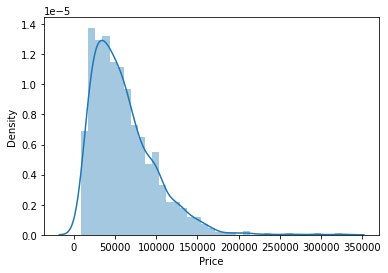

In [13]:
sns.distplot(df["Price"])

<AxesSubplot:>

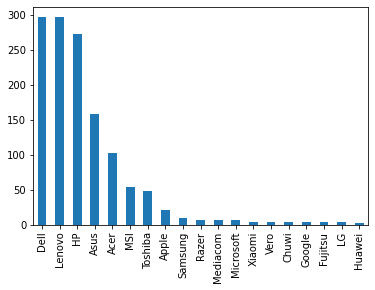

In [14]:
df["Company"].value_counts().plot(kind="bar")

In [15]:
df[df["Company"] == "Razer"]["Price"].mean()

178282.49142857143

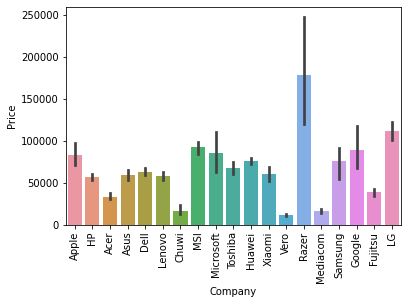

In [16]:
sns.barplot(x=df["Company"],y=df["Price"],estimator=np.mean)
plt.xticks(rotation = "vertical")
plt.show()

<AxesSubplot:>

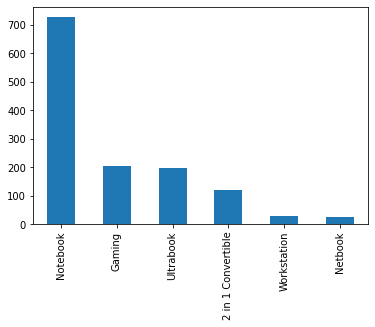

In [17]:
df["TypeName"].value_counts().plot(kind="bar")

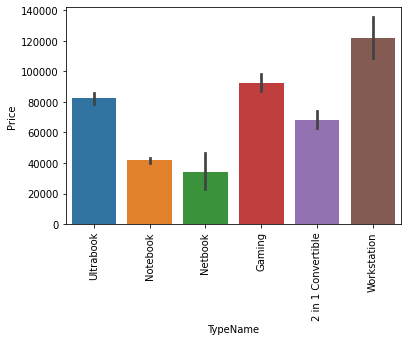

In [18]:
sns.barplot(x=df["TypeName"],y=df["Price"],estimator=np.mean)
plt.xticks(rotation = "vertical")
plt.show()

<AxesSubplot:xlabel='Inches', ylabel='Price'>

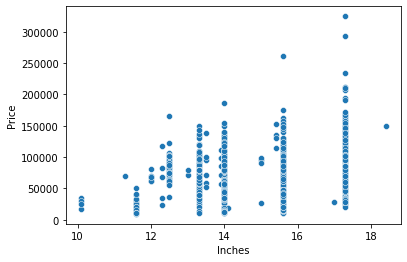

In [19]:
sns.scatterplot(df["Inches"],df["Price"])

<AxesSubplot:xlabel='Inches', ylabel='Price'>

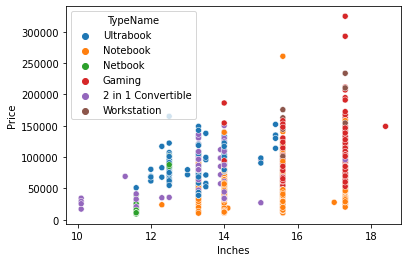

In [20]:
sns.scatterplot(df["Inches"],df["Price"],hue=df["TypeName"])

<AxesSubplot:xlabel='Inches', ylabel='Price'>

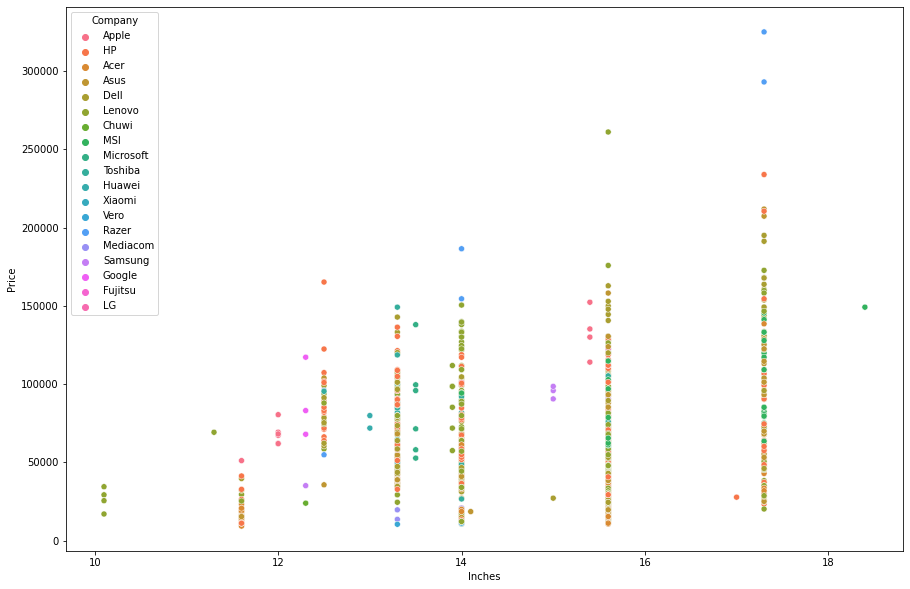

In [21]:
plt.figure(figsize=(15,10))
sns.scatterplot(df["Inches"],df["Price"],hue=df["Company"])

In [22]:
df["ScreenResolution"].value_counts()

Full HD 1920x1080                                507
1366x768                                         281
IPS Panel Full HD 1920x1080                      230
IPS Panel Full HD / Touchscreen 1920x1080         53
Full HD / Touchscreen 1920x1080                   47
1600x900                                          23
Touchscreen 1366x768                              16
Quad HD+ / Touchscreen 3200x1800                  15
IPS Panel 4K Ultra HD 3840x2160                   12
IPS Panel 4K Ultra HD / Touchscreen 3840x2160     11
4K Ultra HD / Touchscreen 3840x2160               10
4K Ultra HD 3840x2160                              7
Touchscreen 2560x1440                              7
IPS Panel 1366x768                                 7
IPS Panel Quad HD+ / Touchscreen 3200x1800         6
IPS Panel Retina Display 2560x1600                 6
IPS Panel Retina Display 2304x1440                 6
Touchscreen 2256x1504                              6
IPS Panel Touchscreen 2560x1440               

In [23]:
df["Touchscreen"] = df["ScreenResolution"].apply(lambda x:1 if "Touchscreen" in x else 0)

In [24]:
df.tail(10)

,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen
1293,Lenovo,Notebook,15.6,IPS Panel Full HD 1920x1080,Intel Core i7 6700HQ 2.6GHz,8,1TB HDD,Nvidia GeForce GTX 960M,Windows 10,2.60,47898.7200,0
1294,HP,Notebook,15.6,Full HD 1920x1080,AMD A9-Series 9410 2.9GHz,6,1.0TB Hybrid,AMD Radeon R7 M440,Windows 10,2.04,29303.4672,0
1295,Dell,Notebook,15.6,1366x768,Intel Core i7 7500U 2.7GHz,8,1TB HDD,AMD Radeon R5 M430,Linux,2.30,42943.1472,0
1296,HP,Netbook,11.6,1366x768,Intel Celeron Dual Core N3060 1.6GHz,2,32GB Flash Storage,Intel HD Graphics 400,Windows 10,1.17,11135.5200,0
1297,Asus,Notebook,15.6,1366x768,Intel Core i7 6500U 2.5GHz,4,500GB HDD,Nvidia GeForce 920M,Windows 10,2.20,38378.6496,0
1298,Lenovo,2 in 1 Convertible,14.0,IPS Panel Full HD / Touchscreen 1920x1080,Intel Core i7 6500U 2.5GHz,4,128GB SSD,Intel HD Graphics 520,Windows 10,1.80,33992.6400,1
1299,Lenovo,2 in 1 Convertible,13.3,IPS Panel Quad HD+ / Touchscreen 3200x1800,Intel Core i7 6500U 2.5GHz,16,512GB SSD,Intel HD Graphics 520,Windows 10,1.30,79866.7200,1
1300,Lenovo,Notebook,14.0,1366x768,Intel Celeron Dual Core N3050 1.6GHz,2,64GB Flash Storage,Intel HD Graphics,Windows 10,1.50,12201.1200,0
1301,HP,Notebook,15.6,1366x768,Intel Core i7 6500U 2.5GHz,6,1TB HDD,AMD Radeon R5 M330,Windows 10,2.19,40705.9200,0
1302,Asus,Notebook,15.6,1366x768,Intel Celeron Dual Core N3050 1.6GHz,4,500GB HDD,Intel HD Graphics,Windows 10,2.20,19660.3200,0


<AxesSubplot:>

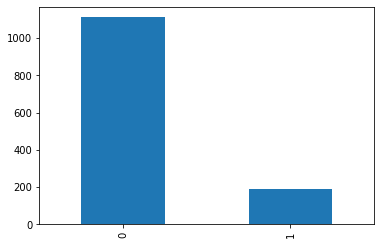

In [25]:
df["Touchscreen"].value_counts().plot(kind="bar")

<AxesSubplot:xlabel='Touchscreen', ylabel='Price'>

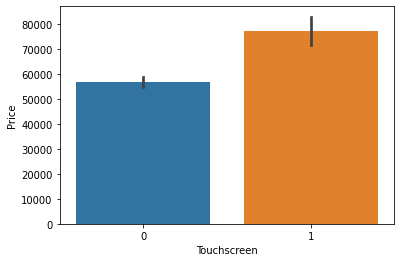

In [26]:
sns.barplot(df["Touchscreen"],df["Price"])

In [27]:
df["Ips"] = df["ScreenResolution"].apply(lambda x:1 if "IPS" in x else 0)

In [28]:
df.head(10)

,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8,256GB SSD,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16,512GB SSD,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1
5,Acer,Notebook,15.6,1366x768,AMD A9-Series 9420 3GHz,4,500GB HDD,AMD Radeon R5,Windows 10,2.10,21312.0000,0,0
6,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.2GHz,16,256GB Flash Storage,Intel Iris Pro Graphics,Mac OS X,2.04,114017.6016,0,1
7,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8,256GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,61735.5360,0,0
8,Asus,Ultrabook,14.0,Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,16,512GB SSD,Nvidia GeForce MX150,Windows 10,1.30,79653.6000,0,0
9,Acer,Ultrabook,14.0,IPS Panel Full HD 1920x1080,Intel Core i5 8250U 1.6GHz,8,256GB SSD,Intel UHD Graphics 620,Windows 10,1.60,41025.6000,0,1


In [29]:
#df["ScreenResolution"].apply(lambda x:x.split("x"))
#df["ScreenResolution"].str.split("x",expand=True)
new = df["ScreenResolution"].str.split("x").reset_index()
new

,index,ScreenResolution
0,0,"[IPS Panel Retina Display 2560, 1600]"
1,1,"[1440, 900]"
2,2,"[Full HD 1920, 1080]"
3,3,"[IPS Panel Retina Display 2880, 1800]"
4,4,"[IPS Panel Retina Display 2560, 1600]"
...,...,...
1298,1298,"[IPS Panel Full HD / Touchscreen 1920, 1080]"
1299,1299,"[IPS Panel Quad HD+ / Touchscreen 3200, 1800]"
1300,1300,"[1366, 768]"
1301,1301,"[1366, 768]"


In [30]:
df["x_resol"] = new["ScreenResolution"].apply(lambda x:x[0])

In [31]:
df["y_resol"] = new["ScreenResolution"].apply(lambda x:x[1])

In [32]:
df.head(10)

,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips,x_resol,y_resol
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,IPS Panel Retina Display 2560,1600
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,1440,900
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8,256GB SSD,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,Full HD 1920,1080
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16,512GB SSD,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,IPS Panel Retina Display 2880,1800
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,IPS Panel Retina Display 2560,1600
5,Acer,Notebook,15.6,1366x768,AMD A9-Series 9420 3GHz,4,500GB HDD,AMD Radeon R5,Windows 10,2.10,21312.0000,0,0,1366,768
6,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.2GHz,16,256GB Flash Storage,Intel Iris Pro Graphics,Mac OS X,2.04,114017.6016,0,1,IPS Panel Retina Display 2880,1800
7,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8,256GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,61735.5360,0,0,1440,900
8,Asus,Ultrabook,14.0,Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,16,512GB SSD,Nvidia GeForce MX150,Windows 10,1.30,79653.6000,0,0,Full HD 1920,1080
9,Acer,Ultrabook,14.0,IPS Panel Full HD 1920x1080,Intel Core i5 8250U 1.6GHz,8,256GB SSD,Intel UHD Graphics 620,Windows 10,1.60,41025.6000,0,1,IPS Panel Full HD 1920,1080


In [33]:
df["x_resol"] = df["x_resol"].str.findall(r'(\d+\.?\d+)').apply(lambda x:x[0])

In [34]:
df.head(10)

,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips,x_resol,y_resol
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,2560,1600
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,1440,900
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8,256GB SSD,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,1920,1080
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16,512GB SSD,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,2880,1800
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,2560,1600
5,Acer,Notebook,15.6,1366x768,AMD A9-Series 9420 3GHz,4,500GB HDD,AMD Radeon R5,Windows 10,2.10,21312.0000,0,0,1366,768
6,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.2GHz,16,256GB Flash Storage,Intel Iris Pro Graphics,Mac OS X,2.04,114017.6016,0,1,2880,1800
7,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8,256GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,61735.5360,0,0,1440,900
8,Asus,Ultrabook,14.0,Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,16,512GB SSD,Nvidia GeForce MX150,Windows 10,1.30,79653.6000,0,0,1920,1080
9,Acer,Ultrabook,14.0,IPS Panel Full HD 1920x1080,Intel Core i5 8250U 1.6GHz,8,256GB SSD,Intel UHD Graphics 620,Windows 10,1.60,41025.6000,0,1,1920,1080


In [35]:
import pickle 
df_reso = df
pickle.dump(df_reso,open("df_reso.pkl","wb"))

In [36]:
final = []
for i,j in zip(df["x_resol"],df["y_resol"]):
    final.append("{} X {}".format(i,j))

In [37]:
list(set(final))

['2304 X 1440',
 '2560 X 1600',
 '2400 X 1600',
 '1920 X 1200',
 '1366 X 768',
 '2160 X 1440',
 '3200 X 1800',
 '3840 X 2160',
 '1600 X 900',
 '2560 X 1440',
 '2736 X 1824',
 '2256 X 1504',
 '2880 X 1800',
 '1920 X 1080',
 '1440 X 900']

In [38]:
df = df.astype({
    "x_resol":"int",
    "y_resol":"int"
})

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1303 entries, 0 to 1302
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Company           1303 non-null   object 
 1   TypeName          1303 non-null   object 
 2   Inches            1303 non-null   float64
 3   ScreenResolution  1303 non-null   object 
 4   Cpu               1303 non-null   object 
 5   Ram               1303 non-null   int32  
 6   Memory            1303 non-null   object 
 7   Gpu               1303 non-null   object 
 8   OpSys             1303 non-null   object 
 9   Weight            1303 non-null   float32
 10  Price             1303 non-null   float64
 11  Touchscreen       1303 non-null   int64  
 12  Ips               1303 non-null   int64  
 13  x_resol           1303 non-null   int32  
 14  y_resol           1303 non-null   int32  
dtypes: float32(1), float64(2), int32(3), int64(2), object(7)
memory usage: 132.5+ KB


<AxesSubplot:>

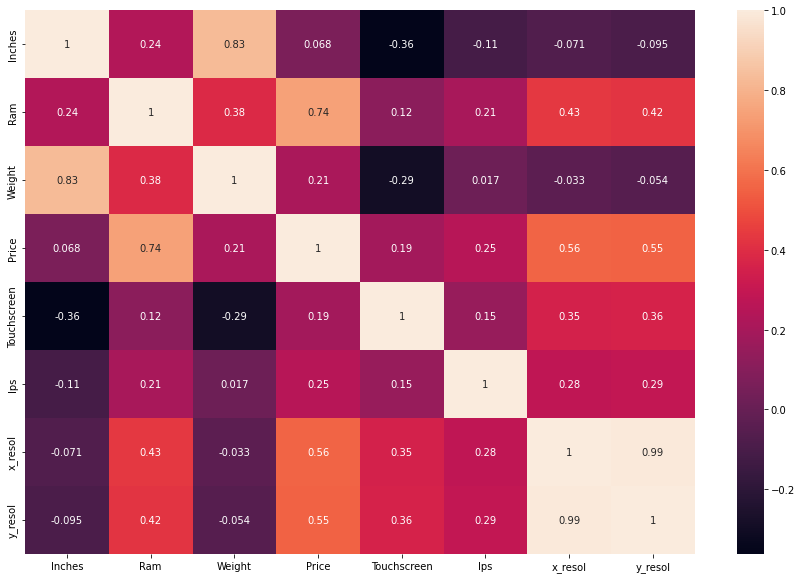

In [40]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True)

In [41]:
#above x_resol and y_resol have higher correlation
#we can confirm by using vif
df1 = df[["Inches","Ram","Weight","Touchscreen","Ips","x_resol","y_resol"]]
vif = pd.DataFrame()
vif["Columns"] = df1.columns
vif["VIF_value"] = [variance_inflation_factor(df1.values,i) for i in range(df1.shape[1])]

In [42]:
vif

,Columns,VIF_value
0,Inches,44.175892
1,Ram,5.858670
2,Weight,24.478255
3,Touchscreen,1.496154
4,Ips,1.563501
5,x_resol,1426.809565
6,y_resol,1379.935443


In [43]:
df1 = df[["Inches","Ram","Weight","Touchscreen","Ips","y_resol"]]
vif = pd.DataFrame()
vif["Columns"] = df1.columns
vif["VIF_value"] = [variance_inflation_factor(df1.values,i) for i in range(df1.shape[1])]
vif

,Columns,VIF_value
0,Inches,43.928885
1,Ram,5.845419
2,Weight,24.321735
3,Touchscreen,1.495861
4,Ips,1.557674
5,y_resol,21.704042


In [44]:
df1 = df[["Ram","Weight","Touchscreen","Ips","y_resol"]]
vif = pd.DataFrame()
vif["Columns"] = df1.columns
vif["VIF_value"] = [variance_inflation_factor(df1.values,i) for i in range(df1.shape[1])]
vif

,Columns,VIF_value
0,Ram,5.312563
1,Weight,8.263978
2,Touchscreen,1.494184
3,Ips,1.523695
4,y_resol,9.689982


In [45]:
#here instead of dropping the features we are combining the x_resol,y_resolve and inches called as pixel per inches(ppi)
df["Ppi"] = (((df["x_resol"]**2) + (df["y_resol"]**2))**0.5)/df["Inches"].astype("int")

In [46]:
df.head(10)

,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips,x_resol,y_resol,Ppi
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,2560,1600,232.221074
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,1440,900,130.624354
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8,256GB SSD,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,1920,1080,146.860478
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16,512GB SSD,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,2880,1800,226.415547
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,2560,1600,232.221074
5,Acer,Notebook,15.6,1366x768,AMD A9-Series 9420 3GHz,4,500GB HDD,AMD Radeon R5,Windows 10,2.10,21312.0000,0,0,1366,768,104.472857
6,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.2GHz,16,256GB Flash Storage,Intel Iris Pro Graphics,Mac OS X,2.04,114017.6016,0,1,2880,1800,226.415547
7,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8,256GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,61735.5360,0,0,1440,900,130.624354
8,Asus,Ultrabook,14.0,Full HD 1920x1080,Intel Core i7 8550U 1.8GHz,16,512GB SSD,Nvidia GeForce MX150,Windows 10,1.30,79653.6000,0,0,1920,1080,157.350512
9,Acer,Ultrabook,14.0,IPS Panel Full HD 1920x1080,Intel Core i5 8250U 1.6GHz,8,256GB SSD,Intel UHD Graphics 620,Windows 10,1.60,41025.6000,0,1,1920,1080,157.350512


In [47]:
df1 = df[["Ram","Weight","Touchscreen","Ips","Ppi"]]
vif = pd.DataFrame()
vif["Columns"] = df1.columns
vif["VIF_value"] = [variance_inflation_factor(df1.values,i) for i in range(df1.shape[1])]
vif

,Columns,VIF_value
0,Ram,5.205555
1,Weight,6.898516
2,Touchscreen,1.545316
3,Ips,1.529384
4,Ppi,7.421797


In [48]:
df.isnull().sum()

Company             0
TypeName            0
Inches              0
ScreenResolution    0
Cpu                 0
Ram                 0
Memory              0
Gpu                 0
OpSys               0
Weight              0
Price               0
Touchscreen         0
Ips                 0
x_resol             0
y_resol             0
Ppi                 0
dtype: int64

In [49]:
df = df.drop(["Inches","ScreenResolution","x_resol","y_resol"],axis=1)

In [50]:
df.sample(5)

,Company,TypeName,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi
0,Apple,Ultrabook,Intel Core i5 2.3GHz,8,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074
513,Dell,Notebook,Intel Core i7 8550U 1.8GHz,16,256GB SSD + 2TB HDD,AMD Radeon 530,Windows 10,2.20,64961.1072,0,0,146.860478
865,HP,Notebook,Intel Core i5 6200U 2.3GHz,4,500GB HDD,Intel HD Graphics 520,Windows 10,2.07,48484.8000,0,0,146.860478
874,Samsung,Ultrabook,Intel Core i7 7500U 2.7GHz,16,256GB SSD,Nvidia GeForce 940MX,Windows 10,1.23,98514.7200,0,0,146.860478
804,Dell,Netbook,Intel Pentium Quad Core N4200 1.1GHz,4,128GB SSD,Intel HD Graphics 505,Windows 10,1.63,39640.3200,0,0,142.462986


In [51]:
df["Cpu"].value_counts()

Intel Core i5 7200U 2.5GHz       190
Intel Core i7 7700HQ 2.8GHz      146
Intel Core i7 7500U 2.7GHz       134
Intel Core i7 8550U 1.8GHz        73
Intel Core i5 8250U 1.6GHz        72
                                ... 
Intel Core M M3-6Y30 0.9GHz        1
AMD A9-Series 9420 2.9GHz          1
Intel Core i3 6006U 2.2GHz         1
AMD A6-Series 7310 2GHz            1
Intel Xeon E3-1535M v6 3.1GHz      1
Name: Cpu, Length: 118, dtype: int64

In [52]:
df["Cpu"].unique()

array(['Intel Core i5 2.3GHz', 'Intel Core i5 1.8GHz',
       'Intel Core i5 7200U 2.5GHz', 'Intel Core i7 2.7GHz',
       'Intel Core i5 3.1GHz', 'AMD A9-Series 9420 3GHz',
       'Intel Core i7 2.2GHz', 'Intel Core i7 8550U 1.8GHz',
       'Intel Core i5 8250U 1.6GHz', 'Intel Core i3 6006U 2GHz',
       'Intel Core i7 2.8GHz', 'Intel Core M m3 1.2GHz',
       'Intel Core i7 7500U 2.7GHz', 'Intel Core i7 2.9GHz',
       'Intel Core i3 7100U 2.4GHz', 'Intel Atom x5-Z8350 1.44GHz',
       'Intel Core i5 7300HQ 2.5GHz', 'AMD E-Series E2-9000e 1.5GHz',
       'Intel Core i5 1.6GHz', 'Intel Core i7 8650U 1.9GHz',
       'Intel Atom x5-Z8300 1.44GHz', 'AMD E-Series E2-6110 1.5GHz',
       'AMD A6-Series 9220 2.5GHz',
       'Intel Celeron Dual Core N3350 1.1GHz',
       'Intel Core i3 7130U 2.7GHz', 'Intel Core i7 7700HQ 2.8GHz',
       'Intel Core i5 2.0GHz', 'AMD Ryzen 1700 3GHz',
       'Intel Pentium Quad Core N4200 1.1GHz',
       'Intel Atom x5-Z8550 1.44GHz',
       'Intel Celeron Du

In [53]:
old = df["Cpu"].apply(lambda x:" ".join(x.split(" ")[:3]))

In [54]:
old

0            Intel Core i5
1            Intel Core i5
2            Intel Core i5
3            Intel Core i7
4            Intel Core i5
               ...        
1298         Intel Core i7
1299         Intel Core i7
1300    Intel Celeron Dual
1301         Intel Core i7
1302    Intel Celeron Dual
Name: Cpu, Length: 1303, dtype: object

In [55]:
def fetch_data(x):
    if x == "Intel Core i5" or x == "Intel Core i7" or x == "Intel Core i3":
        return x
    else:
        if(x.split(" ")[0] == "Intel"):
            return "Other Intel processor"
        else:
            return "AMD processor"

In [56]:
df["CPU_type"] = old.apply(fetch_data)

In [57]:
df.head(10)

,Company,TypeName,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type
0,Apple,Ultrabook,Intel Core i5 2.3GHz,8,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5
1,Apple,Ultrabook,Intel Core i5 1.8GHz,8,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5
2,HP,Notebook,Intel Core i5 7200U 2.5GHz,8,256GB SSD,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5
3,Apple,Ultrabook,Intel Core i7 2.7GHz,16,512GB SSD,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7
4,Apple,Ultrabook,Intel Core i5 3.1GHz,8,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5
5,Acer,Notebook,AMD A9-Series 9420 3GHz,4,500GB HDD,AMD Radeon R5,Windows 10,2.10,21312.0000,0,0,104.472857,AMD processor
6,Apple,Ultrabook,Intel Core i7 2.2GHz,16,256GB Flash Storage,Intel Iris Pro Graphics,Mac OS X,2.04,114017.6016,0,1,226.415547,Intel Core i7
7,Apple,Ultrabook,Intel Core i5 1.8GHz,8,256GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,61735.5360,0,0,130.624354,Intel Core i5
8,Asus,Ultrabook,Intel Core i7 8550U 1.8GHz,16,512GB SSD,Nvidia GeForce MX150,Windows 10,1.30,79653.6000,0,0,157.350512,Intel Core i7
9,Acer,Ultrabook,Intel Core i5 8250U 1.6GHz,8,256GB SSD,Intel UHD Graphics 620,Windows 10,1.60,41025.6000,0,1,157.350512,Intel Core i5


In [58]:
df = df.drop("Cpu",axis=1)

In [59]:
df

,Company,TypeName,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type
0,Apple,Ultrabook,8,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5
1,Apple,Ultrabook,8,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5
2,HP,Notebook,8,256GB SSD,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5
3,Apple,Ultrabook,16,512GB SSD,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7
4,Apple,Ultrabook,8,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5
...,...,...,...,...,...,...,...,...,...,...,...,...
1298,Lenovo,2 in 1 Convertible,4,128GB SSD,Intel HD Graphics 520,Windows 10,1.80,33992.6400,1,1,157.350512,Intel Core i7
1299,Lenovo,2 in 1 Convertible,16,512GB SSD,Intel HD Graphics 520,Windows 10,1.30,79866.7200,1,1,282.423996,Intel Core i7
1300,Lenovo,Notebook,2,64GB Flash Storage,Intel HD Graphics,Windows 10,1.50,12201.1200,0,0,111.935204,Other Intel processor
1301,HP,Notebook,6,1TB HDD,AMD Radeon R5 M330,Windows 10,2.19,40705.9200,0,0,104.472857,Intel Core i7


<AxesSubplot:>

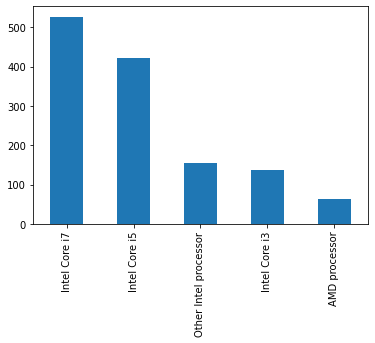

In [60]:
df["CPU_type"].value_counts().plot(kind="bar")

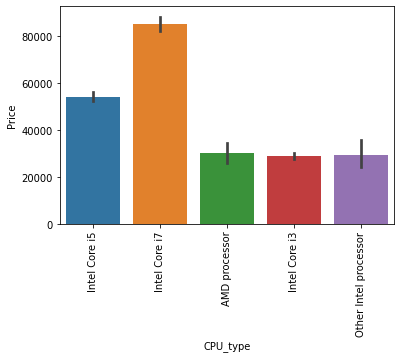

In [61]:
sns.barplot(df["CPU_type"],df["Price"])
plt.xticks(rotation='vertical')
plt.show()

<AxesSubplot:>

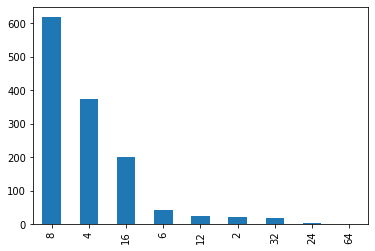

In [62]:
df["Ram"].value_counts().plot(kind="bar")

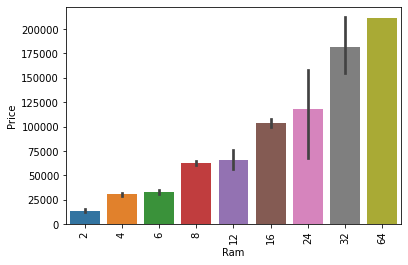

In [63]:
sns.barplot(df["Ram"],df["Price"])
plt.xticks(rotation='vertical')
plt.show()

In [64]:
df["Memory"].value_counts()

256GB SSD                        412
1TB HDD                          223
500GB HDD                        132
512GB SSD                        118
128GB SSD +  1TB HDD              94
128GB SSD                         76
256GB SSD +  1TB HDD              73
32GB Flash Storage                38
2TB HDD                           16
64GB Flash Storage                15
512GB SSD +  1TB HDD              14
1TB SSD                           14
256GB SSD +  2TB HDD              10
1.0TB Hybrid                       9
256GB Flash Storage                8
16GB Flash Storage                 7
32GB SSD                           6
180GB SSD                          5
128GB Flash Storage                4
512GB SSD +  2TB HDD               3
16GB SSD                           3
512GB Flash Storage                2
1TB SSD +  1TB HDD                 2
256GB SSD +  500GB HDD             2
128GB SSD +  2TB HDD               2
256GB SSD +  256GB SSD             2
512GB SSD +  256GB SSD             1
5

In [65]:
import re
def preprocessing(text):
    a = text.replace(" ","")
    if "SSD" not in a:
        a = "0000GBSSD+"+a
    if "HDD" not in a:
        a = a+"+0000GBHDD"
    if "FlashStorage" not in a:
        a = a+"+0000GBFlashStorage"
    if "Hybrid" not in a:
        a = a+"+0000GBHybrid"
    a = a.replace("1.0","1")
    for i in re.findall('\d{1}TB',a):
        k = re.findall('\d{1}',i)[0]
        j = int(k) * 1000
        new = str(j)+"GB"
        a = a.replace("{}TB".format(int(k)),new)
    a = a.split("+")
    y = []
    for i in a:
        if "SSD" in i:
            if(len(i)==8):
                o = re.findall("\d{3}",i)
                t = "0"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            elif(len(i)==7):
                o = re.findall("\d{2}",i)
                t = "00"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            elif(len(i)<=6):
                o = re.findall("\d{1}",i)
                t = "000"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            else:
                y.append(i)
        if "HDD" in i:
            if(len(i)==8):
                o = re.findall("\d{3}",i)
                t = "0"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            elif(len(i)==7):
                o = re.findall("\d{2}",i)
                t = "00"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            elif(len(i)<=6):
                o = re.findall("\d{1}",i)
                t = "000"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            else:
                y.append(i)
        if "Hybrid" in i:
            if(len(i)==11):
                o = re.findall("\d{3}",i)
                t = "0"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            elif(len(i)==10):
                o = re.findall("\d{2}",i)
                t = "00"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            elif(len(i)<=9):
                o = re.findall("\d{1}",i)
                t = "000"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            else:
                y.append(i) 
        if "FlashStorage" in i:
            if(len(i)==17):
                o = re.findall("\d{3}",i)
                t = "0"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            elif(len(i)==16):
                o = re.findall("\d{2}",i)
                t = "00"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            elif(len(i)<=15):
                o = re.findall("\d{1}",i)
                t = "000"+o[0]
                p = i.replace("{}".format(int(o[0])),t)
                y.append(p)
            else:
                y.append(i)
    y = "".join(y)
    #Solve repeatation
    for b in ["SSD","HDD","FlashStorage","Hybrid"]:
        m = re.findall("\d\d\d\dGB{}".format(b),y)
        if(len(m)>1):
            total = 0
            for i in range(len(m)):
                cur = int(re.findall('\d\d\d\d',m[i])[0])
                total = total + cur
            total = str(total)
            if(len(total) < 4):
                if(len(total) == 3):
                    total = "0" + total
                elif(len(total) == 2):
                    total = "00" + total
                else:
                    total = "000" + total
            for i in range(len(m)):
                if(i == 0):
                    y = y.replace(m[i],total+"GB{}".format(b),1)
                else:
                    y = y.replace(m[i],"")
    #ordering
    ordered = []
    for i in ["SSD","HDD","FlashStorage","Hybrid"]:
        l = re.findall('\d\d\d\dGB{}'.format(i),y)
        ordered.append(l[0])
    ordered_y = "".join(ordered)
    #Finally return the values
    SSD = []
    HDD = []
    FS = []
    Hy = []
    ssd = re.findall("\d\d\d\dGBSSD",ordered_y)[0]
    SSD.append(ssd)
    hdd = re.findall("\d\d\d\dGBHDD",ordered_y)[0]
    HDD.append(hdd)
    f = re.findall("\d\d\d\dGBFlashStorage",ordered_y)[0]
    FS.append(f)
    h = re.findall("\d\d\d\dGBHybrid",ordered_y)[0]
    Hy.append(h)
    return SSD,HDD,FS,Hy

In [63]:
preprocessing("128GB Flash Storage")

(['0000GBSSD'], ['0000GBHDD'], ['0128GBFlashStorage'], ['0000GBHybrid'])

In [64]:
final = pd.DataFrame(list(df.Memory.apply(preprocessing)))

In [65]:
final = final.rename(columns={0:"SSD",
                     1:"HDD",
                     2:"FlashStorage",
                     3:"Hybrid"})

In [66]:
final.head(10)

,SSD,HDD,FlashStorage,Hybrid
0,[0128GBSSD],[0000GBHDD],[0000GBFlashStorage],[0000GBHybrid]
1,[0000GBSSD],[0000GBHDD],[0128GBFlashStorage],[0000GBHybrid]
2,[0256GBSSD],[0000GBHDD],[0000GBFlashStorage],[0000GBHybrid]
3,[0512GBSSD],[0000GBHDD],[0000GBFlashStorage],[0000GBHybrid]
4,[0256GBSSD],[0000GBHDD],[0000GBFlashStorage],[0000GBHybrid]
5,[0000GBSSD],[0500GBHDD],[0000GBFlashStorage],[0000GBHybrid]
6,[0000GBSSD],[0000GBHDD],[0256GBFlashStorage],[0000GBHybrid]
7,[0000GBSSD],[0000GBHDD],[0256GBFlashStorage],[0000GBHybrid]
8,[0512GBSSD],[0000GBHDD],[0000GBFlashStorage],[0000GBHybrid]
9,[0256GBSSD],[0000GBHDD],[0000GBFlashStorage],[0000GBHybrid]


In [67]:
final["SSD"] = pd.Series(final["SSD"]).apply(lambda x:x[0])
final["HDD"] = pd.Series(final["HDD"]).apply(lambda x:x[0])
final["FlashStorage"] = pd.Series(final["FlashStorage"]).apply(lambda x:x[0])
final["Hybrid"] = pd.Series(final["Hybrid"]).apply(lambda x:x[0])

In [68]:
final

,SSD,HDD,FlashStorage,Hybrid
0,0128GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
1,0000GBSSD,0000GBHDD,0128GBFlashStorage,0000GBHybrid
2,0256GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
3,0512GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
4,0256GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
...,...,...,...,...
1298,0128GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
1299,0512GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
1300,0000GBSSD,0000GBHDD,0064GBFlashStorage,0000GBHybrid
1301,0000GBSSD,1000GBHDD,0000GBFlashStorage,0000GBHybrid


In [69]:
df = pd.concat([df,final],axis=1)

In [70]:
df.sample(20)

,Company,TypeName,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid
204,Dell,Workstation,16,256GB SSD + 1TB HDD,Nvidia Quadro M1200,Windows 10,2.80,162770.40,0,0,293.720956,Other Intel processor,0256GBSSD,1000GBHDD,0000GBFlashStorage,0000GBHybrid
508,HP,Ultrabook,8,512GB SSD,Intel HD Graphics 620,Windows 10,1.34,70489.44,0,1,169.454398,Intel Core i7,0512GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
574,Lenovo,Notebook,4,500GB HDD,Intel HD Graphics 620,Windows 10,2.05,36496.80,0,0,146.860478,Intel Core i5,0000GBSSD,0500GBHDD,0000GBFlashStorage,0000GBHybrid
1127,HP,Ultrabook,8,256GB SSD,Intel HD Graphics 520,Windows 7,1.26,100965.60,0,0,130.591071,Intel Core i5,0256GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
848,HP,2 in 1 Convertible,8,256GB SSD,Intel HD Graphics 620,Windows 10,1.28,121318.56,1,0,169.454398,Intel Core i5,0256GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
578,MSI,Gaming,16,512GB SSD + 1TB HDD,Nvidia GeForce GTX 1070,Windows 10,4.14,145401.12,0,0,129.582775,Intel Core i7,0512GBSSD,1000GBHDD,0000GBFlashStorage,0000GBHybrid
371,Acer,Notebook,4,128GB SSD,AMD Radeon R5,Windows 10,2.10,22697.28,0,0,104.472857,AMD processor,0128GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
845,Dell,Notebook,4,256GB SSD,AMD Radeon R5 M420,Windows 10,2.18,39373.92,0,0,146.860478,Intel Core i7,0256GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
17,Apple,Ultrabook,16,512GB SSD,AMD Radeon Pro 560,macOS,1.83,152274.24,0,1,226.415547,Intel Core i7,0512GBSSD,0000GBHDD,0000GBFlashStorage,0000GBHybrid
257,HP,Notebook,16,1TB HDD,Nvidia GeForce MX150,Windows 10,2.90,56423.52,0,1,129.582775,Intel Core i7,0000GBSSD,1000GBHDD,0000GBFlashStorage,0000GBHybrid


In [71]:
df.isnull().sum()

Company         0
TypeName        0
Ram             0
Memory          0
Gpu             0
OpSys           0
Weight          0
Price           0
Touchscreen     0
Ips             0
Ppi             0
CPU_type        0
SSD             0
HDD             0
FlashStorage    0
Hybrid          0
dtype: int64

In [72]:
df["SSD"] = df["SSD"].str.findall('\d{4}').apply(lambda x:x[0])
df["HDD"] = df["HDD"].str.findall('\d{4}').apply(lambda x:x[0])
df["FlashStorage"] = df["FlashStorage"].str.findall('\d{4}').apply(lambda x:x[0])
df["Hybrid"] = df["Hybrid"].str.findall('\d{4}').apply(lambda x:x[0])

In [73]:
df.head(10)

,Company,TypeName,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid
0,Apple,Ultrabook,8,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,0128,0000,0000,0000
1,Apple,Ultrabook,8,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0000,0000,0128,0000
2,HP,Notebook,8,256GB SSD,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5,0256,0000,0000,0000
3,Apple,Ultrabook,16,512GB SSD,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,0512,0000,0000,0000
4,Apple,Ultrabook,8,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,0256,0000,0000,0000
5,Acer,Notebook,4,500GB HDD,AMD Radeon R5,Windows 10,2.10,21312.0000,0,0,104.472857,AMD processor,0000,0500,0000,0000
6,Apple,Ultrabook,16,256GB Flash Storage,Intel Iris Pro Graphics,Mac OS X,2.04,114017.6016,0,1,226.415547,Intel Core i7,0000,0000,0256,0000
7,Apple,Ultrabook,8,256GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,61735.5360,0,0,130.624354,Intel Core i5,0000,0000,0256,0000
8,Asus,Ultrabook,16,512GB SSD,Nvidia GeForce MX150,Windows 10,1.30,79653.6000,0,0,157.350512,Intel Core i7,0512,0000,0000,0000
9,Acer,Ultrabook,8,256GB SSD,Intel UHD Graphics 620,Windows 10,1.60,41025.6000,0,1,157.350512,Intel Core i5,0256,0000,0000,0000


In [74]:
df = df.astype({
    "SSD" : "int32",
    "HDD" : "int32",
    "FlashStorage" : "int32",
    "Hybrid" : "int32"
})

In [75]:
df.head(100)

,Company,TypeName,Ram,Memory,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid
0,Apple,Ultrabook,8,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0
1,Apple,Ultrabook,8,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,128,0
2,HP,Notebook,8,256GB SSD,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,0,0
3,Apple,Ultrabook,16,512GB SSD,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,0,0
4,Apple,Ultrabook,8,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Acer,2 in 1 Convertible,8,256GB SSD,Intel UHD Graphics 620,Windows 10,1.50,45128.1600,1,1,169.454398,Intel Core i5,256,0,0,0
96,Dell,Notebook,8,1TB HDD,AMD Radeon R5 M430,Linux,2.20,31962.6720,0,0,146.860478,Intel Core i7,0,1000,0,0
97,Dell,Notebook,4,256GB SSD,AMD Radeon R5 M430,Linux,2.20,25840.8000,0,0,146.860478,Intel Core i3,256,0,0,0
98,Asus,Notebook,6,256GB SSD,Nvidia GeForce 920M,Windows 10,2.00,30742.5600,0,0,146.860478,Intel Core i3,256,0,0,0


<AxesSubplot:>

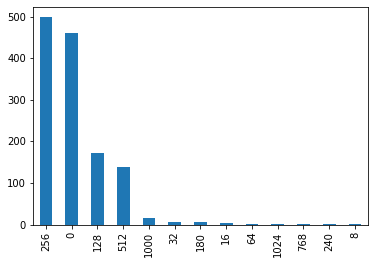

In [76]:
df["SSD"].value_counts().plot(kind = "bar")

<AxesSubplot:xlabel='SSD', ylabel='Price'>

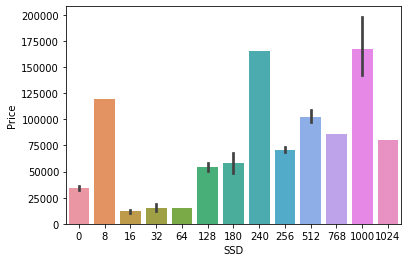

In [77]:
sns.barplot(data=df,x="SSD",y="Price")

<AxesSubplot:>

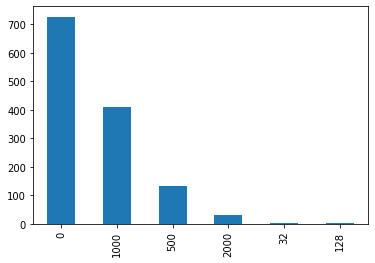

In [78]:
df["HDD"].value_counts().plot(kind = "bar")

<AxesSubplot:xlabel='HDD', ylabel='Price'>

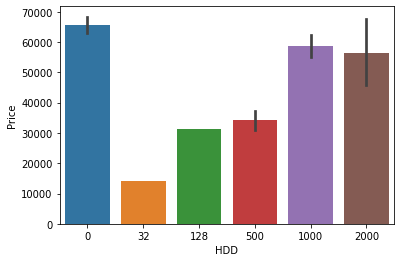

In [79]:
sns.barplot(data=df,x="HDD",y="Price")

<AxesSubplot:>

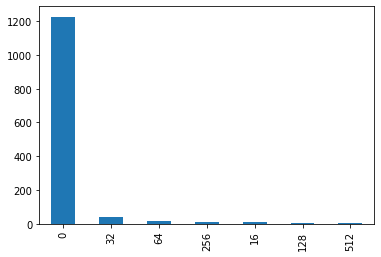

In [80]:
df["FlashStorage"].value_counts().plot(kind = "bar")

<AxesSubplot:xlabel='FlashStorage', ylabel='Price'>

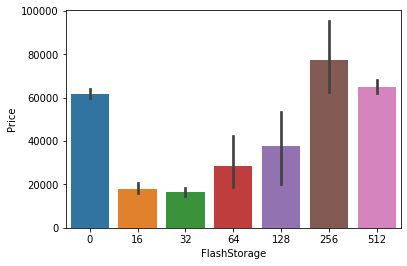

In [81]:
sns.barplot(data=df,x="FlashStorage",y="Price")

<AxesSubplot:>

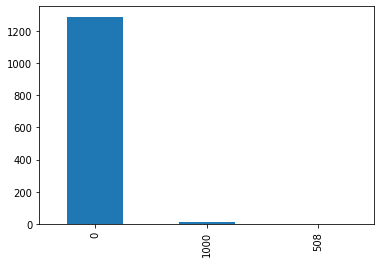

In [82]:
df["Hybrid"].value_counts().plot(kind = "bar")

<AxesSubplot:xlabel='Hybrid', ylabel='Price'>

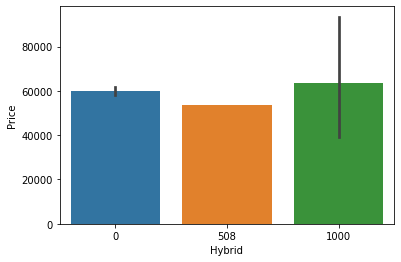

In [83]:
sns.barplot(data=df,x="Hybrid",y="Price")

In [84]:
df = df.drop("Memory",axis=1)

In [85]:
df

,Company,TypeName,Ram,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid
0,Apple,Ultrabook,8,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0
1,Apple,Ultrabook,8,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,128,0
2,HP,Notebook,8,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,0,0
3,Apple,Ultrabook,16,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,0,0
4,Apple,Ultrabook,8,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1298,Lenovo,2 in 1 Convertible,4,Intel HD Graphics 520,Windows 10,1.80,33992.6400,1,1,157.350512,Intel Core i7,128,0,0,0
1299,Lenovo,2 in 1 Convertible,16,Intel HD Graphics 520,Windows 10,1.30,79866.7200,1,1,282.423996,Intel Core i7,512,0,0,0
1300,Lenovo,Notebook,2,Intel HD Graphics,Windows 10,1.50,12201.1200,0,0,111.935204,Other Intel processor,0,0,64,0
1301,HP,Notebook,6,AMD Radeon R5 M330,Windows 10,2.19,40705.9200,0,0,104.472857,Intel Core i7,0,1000,0,0


In [86]:
df.isnull().sum()

Company         0
TypeName        0
Ram             0
Gpu             0
OpSys           0
Weight          0
Price           0
Touchscreen     0
Ips             0
Ppi             0
CPU_type        0
SSD             0
HDD             0
FlashStorage    0
Hybrid          0
dtype: int64

In [87]:
df.Gpu.unique()

array(['Intel Iris Plus Graphics 640', 'Intel HD Graphics 6000',
       'Intel HD Graphics 620', 'AMD Radeon Pro 455',
       'Intel Iris Plus Graphics 650', 'AMD Radeon R5',
       'Intel Iris Pro Graphics', 'Nvidia GeForce MX150',
       'Intel UHD Graphics 620', 'Intel HD Graphics 520',
       'AMD Radeon Pro 555', 'AMD Radeon R5 M430',
       'Intel HD Graphics 615', 'AMD Radeon Pro 560',
       'Nvidia GeForce 940MX', 'Intel HD Graphics 400',
       'Nvidia GeForce GTX 1050', 'AMD Radeon R2', 'AMD Radeon 530',
       'Nvidia GeForce 930MX', 'Intel HD Graphics',
       'Intel HD Graphics 500', 'Nvidia GeForce 930MX ',
       'Nvidia GeForce GTX 1060', 'Nvidia GeForce 150MX',
       'Intel Iris Graphics 540', 'AMD Radeon RX 580',
       'Nvidia GeForce 920MX', 'AMD Radeon R4 Graphics', 'AMD Radeon 520',
       'Nvidia GeForce GTX 1070', 'Nvidia GeForce GTX 1050 Ti',
       'Nvidia GeForce MX130', 'AMD R4 Graphics',
       'Nvidia GeForce GTX 940MX', 'AMD Radeon RX 560',
       'Nvid

In [88]:
df["Gpu"].value_counts()

Intel HD Graphics 620      281
Intel HD Graphics 520      185
Intel UHD Graphics 620      68
Nvidia GeForce GTX 1050     66
Nvidia GeForce GTX 1060     48
                          ... 
AMD Radeon R5 520            1
AMD Radeon R7                1
Intel HD Graphics 540        1
AMD Radeon 540               1
ARM Mali T860 MP4            1
Name: Gpu, Length: 110, dtype: int64

In [89]:
df["GPU_brand"] = df["Gpu"].apply(lambda x:x.split(" ")[0])

In [90]:
df["GPU_brand"].value_counts()

Intel     722
Nvidia    400
AMD       180
ARM         1
Name: GPU_brand, dtype: int64

In [91]:
df = df[df["GPU_brand"] != "ARM"]

In [92]:
df["GPU_brand"].value_counts()

Intel     722
Nvidia    400
AMD       180
Name: GPU_brand, dtype: int64

In [93]:
df[df["GPU_brand"] == "Intel"]["Gpu"].value_counts()

Intel HD Graphics 620           281
Intel HD Graphics 520           185
Intel UHD Graphics 620           68
Intel HD Graphics 500            39
Intel HD Graphics 400            37
Intel HD Graphics                29
Intel HD Graphics 515            15
Intel HD Graphics 615            14
Intel HD Graphics 505            12
Intel HD Graphics 405             9
Intel Iris Plus Graphics 640      8
Intel HD Graphics 6000            5
Intel HD Graphics 630             4
Intel HD Graphics 510             4
Intel HD Graphics 5300            2
Intel Iris Graphics 540           2
Intel Iris Plus Graphics 650      2
Intel Iris Graphics 550           1
Intel Iris Pro Graphics           1
Intel HD Graphics 530             1
Intel Graphics 620                1
Intel HD Graphics 540             1
Intel HD Graphics 620             1
Name: Gpu, dtype: int64

In [94]:
df["Intel_brand"] = df[df["GPU_brand"] == "Intel"]["Gpu"].apply(lambda x:"".join(re.findall('\D',"".join(x.split(" ")[1:]))))

In [95]:
df.head(10)

,Company,TypeName,Ram,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid,GPU_brand,Intel_brand
0,Apple,Ultrabook,8,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0,Intel,IrisPlusGraphics
1,Apple,Ultrabook,8,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,128,0,Intel,HDGraphics
2,HP,Notebook,8,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,0,0,Intel,HDGraphics
3,Apple,Ultrabook,16,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,0,0,AMD,NaN
4,Apple,Ultrabook,8,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,0,0,Intel,IrisPlusGraphics
5,Acer,Notebook,4,AMD Radeon R5,Windows 10,2.10,21312.0000,0,0,104.472857,AMD processor,0,500,0,0,AMD,NaN
6,Apple,Ultrabook,16,Intel Iris Pro Graphics,Mac OS X,2.04,114017.6016,0,1,226.415547,Intel Core i7,0,0,256,0,Intel,IrisProGraphics
7,Apple,Ultrabook,8,Intel HD Graphics 6000,macOS,1.34,61735.5360,0,0,130.624354,Intel Core i5,0,0,256,0,Intel,HDGraphics
8,Asus,Ultrabook,16,Nvidia GeForce MX150,Windows 10,1.30,79653.6000,0,0,157.350512,Intel Core i7,512,0,0,0,Nvidia,NaN
9,Acer,Ultrabook,8,Intel UHD Graphics 620,Windows 10,1.60,41025.6000,0,1,157.350512,Intel Core i5,256,0,0,0,Intel,UHDGraphics


In [96]:
df[df["GPU_brand"] == "Nvidia"]["Gpu"].value_counts()

Nvidia GeForce GTX 1050           66
Nvidia GeForce GTX 1060           48
Nvidia GeForce 940MX              43
Nvidia GeForce GTX 1070           30
Nvidia GeForce GTX 1050 Ti        28
Nvidia GeForce 930MX              20
Nvidia GeForce MX150              15
Nvidia GeForce GTX 960M           14
Nvidia GeForce 920MX              13
Nvidia GeForce GTX 980M           10
Nvidia Quadro M1200                9
Nvidia GeForce GTX 950M            7
Nvidia GeForce MX130               6
Nvidia GeForce 920M                6
Nvidia GeForce 930M                6
Nvidia GeForce GTX 1080            6
Nvidia GeForce GTX 970M            5
Nvidia GeForce GT 940MX            5
Nvidia Quadro M620                 5
Nvidia GeForce 920MX               5
Nvidia GeForce 930MX               5
Nvidia GeForce GTX 940MX           4
Nvidia GeForce GTX 965M            4
Nvidia Quadro M1000M               4
Nvidia GeForce GTX 1050M           3
Nvidia Quadro M2200M               3
Nvidia GeForce 150MX               3
N

In [97]:
df["Nvidia_brand"] = df[df["GPU_brand"] == "Nvidia"]["Gpu"].apply(lambda x:"".join(re.findall('\D',"".join(x.split(" ")[1:]))))

In [98]:
df["Nvidia_brand"].value_counts()

GeForceGTX         155
GeForceMX          110
GeForceGTXM         45
GeForceGTXTi        31
QuadroM             17
GeForceM            14
QuadroMM            14
GeForceGTXMX         5
GeForceGTMX          5
GeForceGTX<U+C>      2
GTXSLI               1
GeForce              1
Name: Nvidia_brand, dtype: int64

In [99]:
def do_corre(text):
    if text == "GeForceGTX":
        text = "GeForceGTX"
        return text
    if text == "GeForceMX":
        text = "GeForce"
        return text
    if text == "GeForceGTXM":
        text = "GeForceGTX"
        return text
    if text == "GeForceGTXTi":
        text = "GeForceGTX"
        return text
    if text == "QuadroM":
        text = "Quadro"
        return text
    if text == "GeForceM":
        text = "GeForce"
        return text
    if text == "QuadroMM":
        text = "Quadro"
        return text
    if text == "GeForceGTXMX":
        text = "GeForceGTX"
        return text
    if text == "GeForceGTMX":
        text = "GeForceGT"
        return text
    if text == "GeForceGTX<U+C>":
        text = "GeForceGTX"
        return text
    if text == "GTXSLI":
        text = "GTX"
        return text
    if text == "GeForceMX":
        text = "GeForce"
        return text
    if text == "GeForce":
        text = "GeForce"
        return text

In [100]:
df["Nvidia_brand"] = df["Nvidia_brand"].apply(do_corre)

In [101]:
df["Nvidia_brand"].value_counts()

GeForceGTX    238
GeForce       125
Quadro         31
GeForceGT       5
GTX             1
Name: Nvidia_brand, dtype: int64

In [102]:
df[df["GPU_brand"] == "AMD"]["Gpu"].value_counts()

AMD Radeon 530            41
AMD Radeon R5 M430        22
AMD Radeon 520            17
AMD Radeon R7 M445        14
AMD Radeon R5             11
AMD Radeon R5 M420         8
AMD Radeon R5 M330         7
AMD Radeon R7 M440         5
AMD Radeon R2              5
AMD Radeon RX 580          5
AMD Radeon R4 Graphics     5
AMD Radeon R2 Graphics     4
AMD Radeon RX 550          4
AMD Radeon R5 M420X        3
AMD Radeon R4              3
AMD FirePro W4190M         2
AMD Radeon R7 M460         2
AMD Radeon RX 540          2
AMD Radeon R7 M465         1
AMD Radeon R3              1
AMD Radeon Pro 455         1
AMD Radeon R7 M365X        1
AMD Radeon R9 M385         1
AMD FirePro W4190M         1
AMD FirePro W6150M         1
AMD Radeon R5 M315         1
AMD Radeon R7 Graphics     1
AMD FirePro W5130M         1
AMD Radeon 540             1
AMD Radeon R7              1
AMD Radeon R5 520          1
AMD Radeon R5 430          1
AMD R17M-M1-70             1
AMD Radeon RX 560          1
AMD R4 Graphic

In [103]:
df["AMD_brand"] = df[df["GPU_brand"] == "AMD"]["Gpu"].apply(lambda x:"".join(re.findall('\D',"".join(x.split(" ")[1:]))))

In [104]:
df["AMD_brand"].value_counts()

RadeonRM           62
Radeon             59
RadeonR            23
RadeonRX           12
RadeonRGraphics    10
FireProWM           5
RadeonRMX           4
RadeonPro           3
RGraphics           1
RM-M-               1
Name: AMD_brand, dtype: int64

In [105]:
def do_corre2(text):
    if text == "RadeonRM":
        text = "Radeon"
        return text
    if text == "Radeon":
        text = "Radeon"
        return text
    if text == "RadeonR":
        text = "Radeon"
        return text
    if text == "RadeonRX":
        text = "Radeon"
        return text
    if text == "RadeonRGraphics":
        text = "Radeon"
        return text
    if text == "FireProWM":
        text = "FirePro"
        return text
    if text == "RadeonRMX":
        text = "Radeon"
        return text
    if text == "RadeonPro":
        text = "RadeonPro"
        return text
    if text == "RGraphics":
        text = "Radeon"
        return text
    if text == "RM-M-":
        text = "Radeon"
        return text

In [106]:
df["AMD_brand"] = df["AMD_brand"].apply(do_corre2)

In [107]:
df

,Company,TypeName,Ram,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid,GPU_brand,Intel_brand,Nvidia_brand,AMD_brand
0,Apple,Ultrabook,8,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0,Intel,IrisPlusGraphics,None,None
1,Apple,Ultrabook,8,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,128,0,Intel,HDGraphics,None,None
2,HP,Notebook,8,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,0,0,Intel,HDGraphics,None,None
3,Apple,Ultrabook,16,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,0,0,AMD,NaN,None,RadeonPro
4,Apple,Ultrabook,8,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,0,0,Intel,IrisPlusGraphics,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1298,Lenovo,2 in 1 Convertible,4,Intel HD Graphics 520,Windows 10,1.80,33992.6400,1,1,157.350512,Intel Core i7,128,0,0,0,Intel,HDGraphics,None,None
1299,Lenovo,2 in 1 Convertible,16,Intel HD Graphics 520,Windows 10,1.30,79866.7200,1,1,282.423996,Intel Core i7,512,0,0,0,Intel,HDGraphics,None,None
1300,Lenovo,Notebook,2,Intel HD Graphics,Windows 10,1.50,12201.1200,0,0,111.935204,Other Intel processor,0,0,64,0,Intel,HDGraphics,None,None
1301,HP,Notebook,6,AMD Radeon R5 M330,Windows 10,2.19,40705.9200,0,0,104.472857,Intel Core i7,0,1000,0,0,AMD,NaN,None,Radeon


In [108]:
df.isnull().sum()

Company            0
TypeName           0
Ram                0
Gpu                0
OpSys              0
Weight             0
Price              0
Touchscreen        0
Ips                0
Ppi                0
CPU_type           0
SSD                0
HDD                0
FlashStorage       0
Hybrid             0
GPU_brand          0
Intel_brand      580
Nvidia_brand     902
AMD_brand       1122
dtype: int64

In [109]:
df = df.fillna("None")

In [110]:
df["Intel_brand"].unique()

array(['IrisPlusGraphics', 'HDGraphics', 'None', 'IrisProGraphics',
       'UHDGraphics', 'IrisGraphics', 'Graphics'], dtype=object)

In [111]:
df["Nvidia_brand"].unique()

array(['None', 'GeForce', 'GeForceGTX', 'GTX', 'Quadro', 'GeForceGT'],
      dtype=object)

In [112]:
df["AMD_brand"].unique()

array(['None', 'RadeonPro', 'Radeon', 'FirePro'], dtype=object)

In [113]:
df["Intel_brand"] = df["Intel_brand"].fillna("None")

In [114]:
df.head(10)

,Company,TypeName,Ram,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid,GPU_brand,Intel_brand,Nvidia_brand,AMD_brand
0,Apple,Ultrabook,8,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0,Intel,IrisPlusGraphics,None,None
1,Apple,Ultrabook,8,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,128,0,Intel,HDGraphics,None,None
2,HP,Notebook,8,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,0,0,Intel,HDGraphics,None,None
3,Apple,Ultrabook,16,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,0,0,AMD,None,None,RadeonPro
4,Apple,Ultrabook,8,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,0,0,Intel,IrisPlusGraphics,None,None
5,Acer,Notebook,4,AMD Radeon R5,Windows 10,2.10,21312.0000,0,0,104.472857,AMD processor,0,500,0,0,AMD,None,None,Radeon
6,Apple,Ultrabook,16,Intel Iris Pro Graphics,Mac OS X,2.04,114017.6016,0,1,226.415547,Intel Core i7,0,0,256,0,Intel,IrisProGraphics,None,None
7,Apple,Ultrabook,8,Intel HD Graphics 6000,macOS,1.34,61735.5360,0,0,130.624354,Intel Core i5,0,0,256,0,Intel,HDGraphics,None,None
8,Asus,Ultrabook,16,Nvidia GeForce MX150,Windows 10,1.30,79653.6000,0,0,157.350512,Intel Core i7,512,0,0,0,Nvidia,None,GeForce,None
9,Acer,Ultrabook,8,Intel UHD Graphics 620,Windows 10,1.60,41025.6000,0,1,157.350512,Intel Core i5,256,0,0,0,Intel,UHDGraphics,None,None


In [115]:
df

,Company,TypeName,Ram,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid,GPU_brand,Intel_brand,Nvidia_brand,AMD_brand
0,Apple,Ultrabook,8,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0,Intel,IrisPlusGraphics,None,None
1,Apple,Ultrabook,8,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,128,0,Intel,HDGraphics,None,None
2,HP,Notebook,8,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,0,0,Intel,HDGraphics,None,None
3,Apple,Ultrabook,16,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,0,0,AMD,None,None,RadeonPro
4,Apple,Ultrabook,8,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,0,0,Intel,IrisPlusGraphics,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1298,Lenovo,2 in 1 Convertible,4,Intel HD Graphics 520,Windows 10,1.80,33992.6400,1,1,157.350512,Intel Core i7,128,0,0,0,Intel,HDGraphics,None,None
1299,Lenovo,2 in 1 Convertible,16,Intel HD Graphics 520,Windows 10,1.30,79866.7200,1,1,282.423996,Intel Core i7,512,0,0,0,Intel,HDGraphics,None,None
1300,Lenovo,Notebook,2,Intel HD Graphics,Windows 10,1.50,12201.1200,0,0,111.935204,Other Intel processor,0,0,64,0,Intel,HDGraphics,None,None
1301,HP,Notebook,6,AMD Radeon R5 M330,Windows 10,2.19,40705.9200,0,0,104.472857,Intel Core i7,0,1000,0,0,AMD,None,None,Radeon


In [116]:
k = df[["Intel_brand","Nvidia_brand","AMD_brand"]]
k

,Intel_brand,Nvidia_brand,AMD_brand
0,IrisPlusGraphics,None,None
1,HDGraphics,None,None
2,HDGraphics,None,None
3,None,None,RadeonPro
4,IrisPlusGraphics,None,None
...,...,...,...
1298,HDGraphics,None,None
1299,HDGraphics,None,None
1300,HDGraphics,None,None
1301,None,None,Radeon


In [117]:
intel = list(k["Intel_brand"])
nvidia = list(k["Nvidia_brand"])
amd = list(k["AMD_brand"])

In [118]:
k[k["Intel_brand"] != "None"]["Intel_brand"].value_counts()

HDGraphics          639
UHDGraphics          68
IrisPlusGraphics     10
IrisGraphics          3
IrisProGraphics       1
Graphics              1
Name: Intel_brand, dtype: int64

In [119]:
k[k["Nvidia_brand"] != "None"]["Nvidia_brand"].value_counts()

GeForceGTX    238
GeForce       125
Quadro         31
GeForceGT       5
GTX             1
Name: Nvidia_brand, dtype: int64

In [120]:
k[k["AMD_brand"] != "None"]["AMD_brand"].value_counts()

Radeon       172
FirePro        5
RadeonPro      3
Name: AMD_brand, dtype: int64

In [121]:
data = []
for i,j,k in zip(intel,nvidia,amd):
    combine = str(i) + str(j) + str(k)
    data.append(combine)

In [122]:
amd

['None',
 'None',
 'None',
 'RadeonPro',
 'None',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'RadeonPro',
 'Radeon',
 'None',
 'None',
 'Radeon',
 'RadeonPro',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'None',
 'None',
 'None',
 'Radeon',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'Radeon',
 'None',
 'None',
 'None',
 'Radeon',
 'None',
 'None',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'None',
 'None',
 'None',
 'None',
 'None',
 'Radeon',
 'Radeon',
 'None',
 'None',
 'Radeon',
 'Radeon',
 'Radeon',
 'None',
 

In [123]:
n = pd.DataFrame({
    "GPU":df["GPU_brand"].to_list(),
    "Com":data
})
n

,GPU,Com
0,Intel,IrisPlusGraphicsNoneNone
1,Intel,HDGraphicsNoneNone
2,Intel,HDGraphicsNoneNone
3,AMD,NoneNoneRadeonPro
4,Intel,IrisPlusGraphicsNoneNone
...,...,...
1297,Intel,HDGraphicsNoneNone
1298,Intel,HDGraphicsNoneNone
1299,Intel,HDGraphicsNoneNone
1300,AMD,NoneNoneRadeon


In [124]:
def filter_data(text):
    return text.replace("None","")

In [125]:
cpm = pd.Series(n["Com"]).apply(filter_data)

In [126]:
data

['IrisPlusGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'NoneNoneRadeonPro',
 'IrisPlusGraphicsNoneNone',
 'NoneNoneRadeon',
 'IrisProGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'NoneGeForceNone',
 'UHDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'NoneNoneRadeonPro',
 'NoneNoneRadeon',
 'HDGraphicsNoneNone',
 'IrisPlusGraphicsNoneNone',
 'NoneNoneRadeon',
 'NoneNoneRadeonPro',
 'NoneGeForceNone',
 'UHDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'NoneGeForceGTXNone',
 'NoneNoneRadeon',
 'UHDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'NoneNoneRadeon',
 'UHDGraphicsNoneNone',
 'NoneGeForceNone',
 'HDGraphicsNoneNone',
 'NoneNoneRadeon',
 'NoneNoneRadeon',
 'UHDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'HDGraphicsNoneNone',
 'NoneNoneRadeon',
 'HDGraphicsNoneNone',
 'NoneGeForceNone',
 'HDGraphicsNoneNone',
 'NoneGeForceGTXNone',
 'NoneGeForceNone',
 'UHDGraphicsNoneNone',
 'NoneGeF

In [127]:
c = pd.DataFrame({
    "GPU":df["GPU_brand"].to_list(),
    "Cpm":cpm
})
n

,GPU,Com
0,Intel,IrisPlusGraphicsNoneNone
1,Intel,HDGraphicsNoneNone
2,Intel,HDGraphicsNoneNone
3,AMD,NoneNoneRadeonPro
4,Intel,IrisPlusGraphicsNoneNone
...,...,...
1297,Intel,HDGraphicsNoneNone
1298,Intel,HDGraphicsNoneNone
1299,Intel,HDGraphicsNoneNone
1300,AMD,NoneNoneRadeon


In [128]:
c[c["GPU"] == "AMD"]["Cpm"].value_counts()

Radeon       172
FirePro        5
RadeonPro      3
Name: Cpm, dtype: int64

In [129]:
c[c["GPU"] == "Intel"]["Cpm"].value_counts()

HDGraphics          639
UHDGraphics          68
IrisPlusGraphics     10
IrisGraphics          3
IrisProGraphics       1
Graphics              1
Name: Cpm, dtype: int64

In [130]:
c[c["GPU"] == "Nvidia"]["Cpm"].value_counts()

GeForceGTX    238
GeForce       125
Quadro         31
GeForceGT       5
GTX             1
Name: Cpm, dtype: int64

In [131]:
df.isnull().sum()

Company         0
TypeName        0
Ram             0
Gpu             0
OpSys           0
Weight          0
Price           0
Touchscreen     0
Ips             0
Ppi             0
CPU_type        0
SSD             0
HDD             0
FlashStorage    0
Hybrid          0
GPU_brand       0
Intel_brand     0
Nvidia_brand    0
AMD_brand       0
dtype: int64

In [132]:
c

,GPU,Cpm
0,Intel,IrisPlusGraphics
1,Intel,HDGraphics
2,Intel,HDGraphics
3,AMD,RadeonPro
4,Intel,IrisPlusGraphics
...,...,...
1297,Intel,HDGraphics
1298,Intel,HDGraphics
1299,Intel,HDGraphics
1300,AMD,Radeon


In [133]:
df = df.reset_index()

In [134]:
df

,index,Company,TypeName,Ram,Gpu,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid,GPU_brand,Intel_brand,Nvidia_brand,AMD_brand
0,0,Apple,Ultrabook,8,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0,Intel,IrisPlusGraphics,None,None
1,1,Apple,Ultrabook,8,Intel HD Graphics 6000,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,128,0,Intel,HDGraphics,None,None
2,2,HP,Notebook,8,Intel HD Graphics 620,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,0,0,Intel,HDGraphics,None,None
3,3,Apple,Ultrabook,16,AMD Radeon Pro 455,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,0,0,AMD,None,None,RadeonPro
4,4,Apple,Ultrabook,8,Intel Iris Plus Graphics 650,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,0,0,Intel,IrisPlusGraphics,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297,1298,Lenovo,2 in 1 Convertible,4,Intel HD Graphics 520,Windows 10,1.80,33992.6400,1,1,157.350512,Intel Core i7,128,0,0,0,Intel,HDGraphics,None,None
1298,1299,Lenovo,2 in 1 Convertible,16,Intel HD Graphics 520,Windows 10,1.30,79866.7200,1,1,282.423996,Intel Core i7,512,0,0,0,Intel,HDGraphics,None,None
1299,1300,Lenovo,Notebook,2,Intel HD Graphics,Windows 10,1.50,12201.1200,0,0,111.935204,Other Intel processor,0,0,64,0,Intel,HDGraphics,None,None
1300,1301,HP,Notebook,6,AMD Radeon R5 M330,Windows 10,2.19,40705.9200,0,0,104.472857,Intel Core i7,0,1000,0,0,AMD,None,None,Radeon


In [135]:
df = pd.concat([df,c],axis=1)

In [136]:
df.head(1)

,index,Company,TypeName,Ram,Gpu,OpSys,Weight,Price,Touchscreen,Ips,...,SSD,HDD,FlashStorage,Hybrid,GPU_brand,Intel_brand,Nvidia_brand,AMD_brand,GPU,Cpm
0,0,Apple,Ultrabook,8,Intel Iris Plus Graphics 640,macOS,1.37,71378.6832,0,1,...,128,0,0,0,Intel,IrisPlusGraphics,None,None,Intel,IrisPlusGraphics


In [137]:
df.isnull().sum()

index           0
Company         0
TypeName        0
Ram             0
Gpu             0
OpSys           0
Weight          0
Price           0
Touchscreen     0
Ips             0
Ppi             0
CPU_type        0
SSD             0
HDD             0
FlashStorage    0
Hybrid          0
GPU_brand       0
Intel_brand     0
Nvidia_brand    0
AMD_brand       0
GPU             0
Cpm             0
dtype: int64

In [138]:
df = df.drop(["GPU_brand","Intel_brand","Nvidia_brand","AMD_brand"],axis=1)

In [139]:
df = df.drop(["index"],axis=1)

In [140]:
df = df.drop(["Gpu"],axis=1)

In [141]:
df = df.rename(columns={
    "GPU":"GPU_brand",
    "Cpm" : "GPU_brand_types"
})

In [142]:
df.isnull().sum()

Company            0
TypeName           0
Ram                0
OpSys              0
Weight             0
Price              0
Touchscreen        0
Ips                0
Ppi                0
CPU_type           0
SSD                0
HDD                0
FlashStorage       0
Hybrid             0
GPU_brand          0
GPU_brand_types    0
dtype: int64

In [143]:
df

,Company,TypeName,Ram,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid,GPU_brand,GPU_brand_types
0,Apple,Ultrabook,8,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0,Intel,IrisPlusGraphics
1,Apple,Ultrabook,8,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,128,0,Intel,HDGraphics
2,HP,Notebook,8,No OS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,0,0,Intel,HDGraphics
3,Apple,Ultrabook,16,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,0,0,AMD,RadeonPro
4,Apple,Ultrabook,8,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,0,0,Intel,IrisPlusGraphics
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297,Lenovo,2 in 1 Convertible,4,Windows 10,1.80,33992.6400,1,1,157.350512,Intel Core i7,128,0,0,0,Intel,HDGraphics
1298,Lenovo,2 in 1 Convertible,16,Windows 10,1.30,79866.7200,1,1,282.423996,Intel Core i7,512,0,0,0,Intel,HDGraphics
1299,Lenovo,Notebook,2,Windows 10,1.50,12201.1200,0,0,111.935204,Other Intel processor,0,0,64,0,Intel,HDGraphics
1300,HP,Notebook,6,Windows 10,2.19,40705.9200,0,0,104.472857,Intel Core i7,0,1000,0,0,AMD,Radeon


<AxesSubplot:>

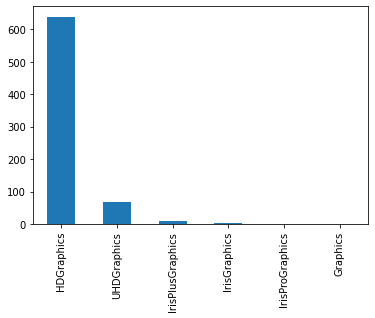

In [144]:
df[df["GPU_brand"]=="Intel"]["GPU_brand_types"].value_counts().plot(kind="bar")

<AxesSubplot:>

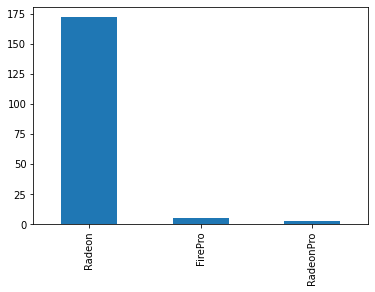

In [145]:
df[df["GPU_brand"]=="AMD"]["GPU_brand_types"].value_counts().plot(kind="bar")

<AxesSubplot:>

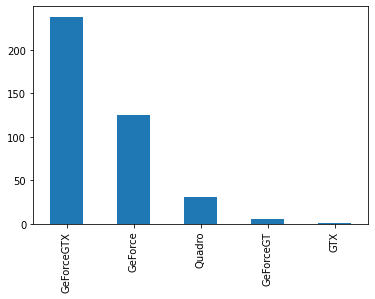

In [146]:
df[df["GPU_brand"]=="Nvidia"]["GPU_brand_types"].value_counts().plot(kind="bar")

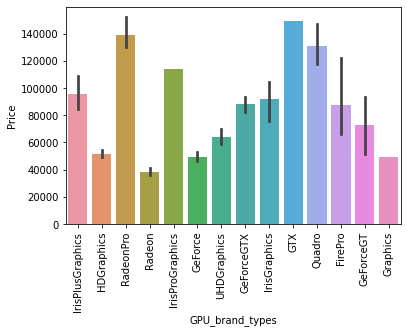

In [147]:
sns.barplot(data=df,x="GPU_brand_types",y="Price")
plt.xticks(rotation="vertical")
plt.show()

In [148]:
df.head(1)

,Company,TypeName,Ram,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid,GPU_brand,GPU_brand_types
0,Apple,Ultrabook,8,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0,Intel,IrisPlusGraphics


In [149]:
df.GPU_brand_types.isnull().sum()

0

In [150]:
df["OpSys"].value_counts()

Windows 10      1072
No OS             66
Linux             62
Windows 7         45
Chrome OS         26
macOS             13
Mac OS X           8
Windows 10 S       8
Android            2
Name: OpSys, dtype: int64

In [151]:
def clean_data(text):
    if(text == "Windows 10" or text == "Windows 7" or text == "Windows 10 S"):
        return "WindowsOS"
    if(text == "macOS" or text == "Mac OS X"):
        return "macOS"
    if(text == "Android" or text == "No OS" or text == "Chrome OS"):
        return "OtherOS"
    else:
        return "Linux"

In [152]:
df["OpSys"] = df["OpSys"].apply(clean_data)

In [153]:
df.sample(20)

,Company,TypeName,Ram,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid,GPU_brand,GPU_brand_types
371,Acer,Notebook,4,WindowsOS,2.10,22697.2800,0,0,104.472857,AMD processor,128,0,0,0,AMD,Radeon
179,HP,2 in 1 Convertible,8,WindowsOS,1.29,79866.7200,1,1,338.908795,Intel Core i5,256,0,0,0,Intel,UHDGraphics
953,Asus,2 in 1 Convertible,8,OtherOS,1.20,61751.5200,0,0,183.575598,Other Intel processor,0,0,64,0,Intel,HDGraphics
403,Acer,Notebook,8,Linux,2.50,46833.1200,0,0,146.860478,Intel Core i7,256,0,0,0,Nvidia,GeForceGTX
902,Dell,2 in 1 Convertible,16,WindowsOS,1.22,87858.7200,1,0,169.454398,Intel Core i7,256,0,0,0,Intel,HDGraphics
1262,Acer,Notebook,4,Linux,2.40,15397.9200,0,0,104.472857,Other Intel processor,0,500,0,0,Intel,HDGraphics
591,Lenovo,Notebook,12,WindowsOS,2.20,50562.7200,0,0,146.860478,AMD processor,512,0,0,0,AMD,Radeon
842,HP,Notebook,8,WindowsOS,2.63,48484.8000,0,0,107.985646,Intel Core i5,0,1000,0,0,Nvidia,GeForce
1022,HP,Notebook,8,WindowsOS,1.11,61218.7200,0,1,169.454398,Intel Core i5,256,0,0,0,Intel,HDGraphics
325,Lenovo,Notebook,4,WindowsOS,1.44,15557.7600,0,0,111.935204,Other Intel processor,0,0,32,0,Intel,HDGraphics


<AxesSubplot:xlabel='Weight', ylabel='Price'>

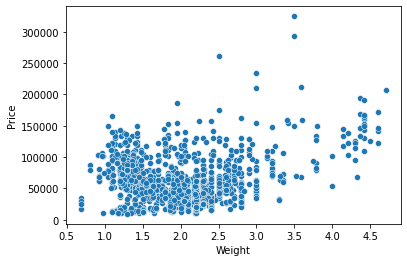

In [154]:
sns.scatterplot(x=df["Weight"],y=df["Price"])

<AxesSubplot:xlabel='Weight', ylabel='Price'>

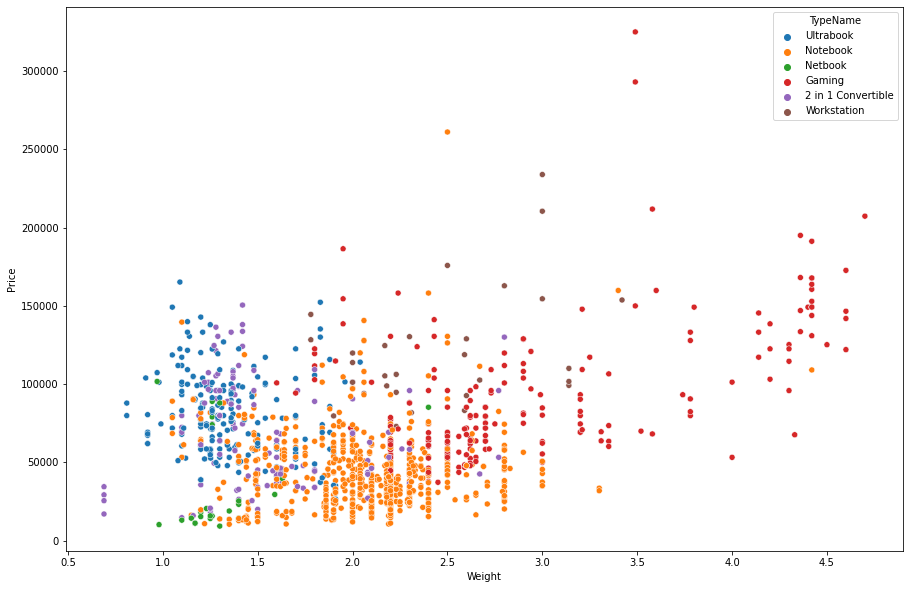

In [155]:
plt.figure(figsize=(15,10))
sns.scatterplot(x=df["Weight"],y=df["Price"],hue=df["TypeName"])

In [156]:
#remove small no of occurances in the catagories and remove highly correlated features in the numerical feature
df["Company"].value_counts()

Dell         297
Lenovo       297
HP           274
Asus         158
Acer         103
MSI           54
Toshiba       48
Apple         21
Samsung        8
Razer          7
Mediacom       7
Microsoft      6
Xiaomi         4
Vero           4
Chuwi          3
Google         3
Fujitsu        3
LG             3
Huawei         2
Name: Company, dtype: int64

In [157]:
df["TypeName"].value_counts()

Notebook              727
Gaming                205
Ultrabook             196
2 in 1 Convertible    120
Workstation            29
Netbook                25
Name: TypeName, dtype: int64

In [158]:
df["OpSys"].value_counts()

WindowsOS    1125
OtherOS        94
Linux          62
macOS          21
Name: OpSys, dtype: int64

In [159]:
df["CPU_type"].value_counts()

Intel Core i7            527
Intel Core i5            423
Other Intel processor    154
Intel Core i3            136
AMD processor             62
Name: CPU_type, dtype: int64

In [160]:
df["GPU_brand"].value_counts()

Intel     722
Nvidia    400
AMD       180
Name: GPU_brand, dtype: int64

In [161]:
df["GPU_brand_types"].value_counts()

HDGraphics          639
GeForceGTX          238
Radeon              172
GeForce             125
UHDGraphics          68
Quadro               31
IrisPlusGraphics     10
FirePro               5
GeForceGT             5
RadeonPro             3
IrisGraphics          3
IrisProGraphics       1
GTX                   1
Graphics              1
Name: GPU_brand_types, dtype: int64

<AxesSubplot:>

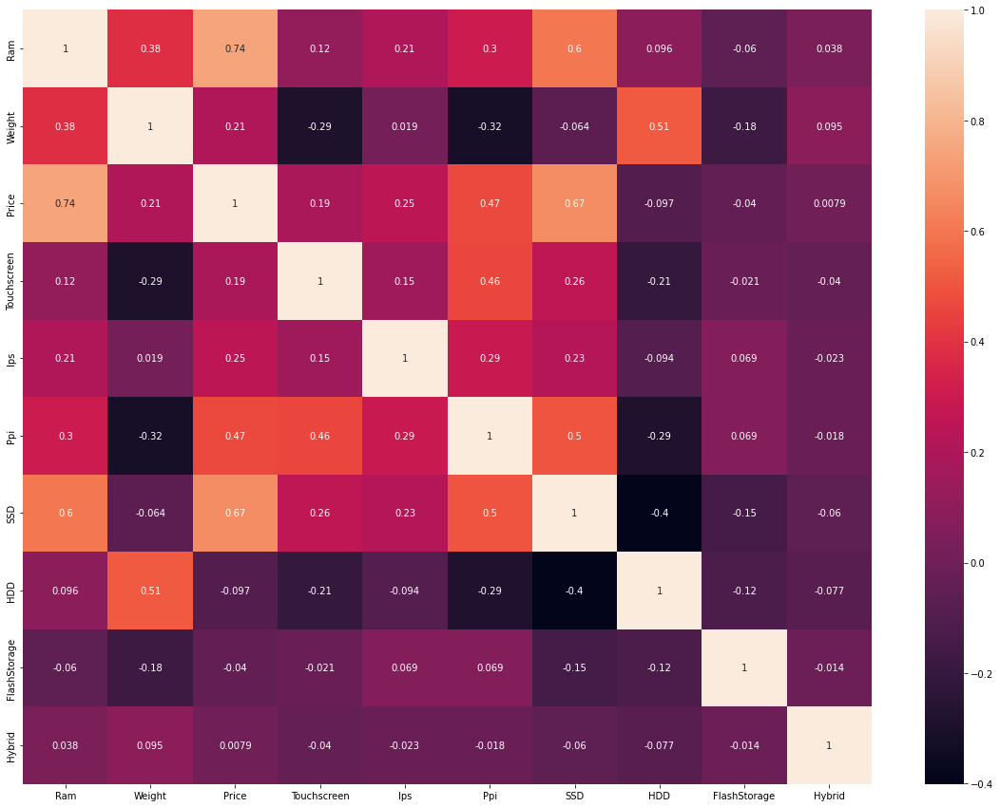

In [162]:
cor = df.corr() 
plt.figure(figsize=(20,15))
sns.heatmap(cor,annot=True)

In [163]:
df

,Company,TypeName,Ram,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,FlashStorage,Hybrid,GPU_brand,GPU_brand_types
0,Apple,Ultrabook,8,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,0,0,Intel,IrisPlusGraphics
1,Apple,Ultrabook,8,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,128,0,Intel,HDGraphics
2,HP,Notebook,8,OtherOS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,0,0,Intel,HDGraphics
3,Apple,Ultrabook,16,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,0,0,AMD,RadeonPro
4,Apple,Ultrabook,8,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,0,0,Intel,IrisPlusGraphics
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297,Lenovo,2 in 1 Convertible,4,WindowsOS,1.80,33992.6400,1,1,157.350512,Intel Core i7,128,0,0,0,Intel,HDGraphics
1298,Lenovo,2 in 1 Convertible,16,WindowsOS,1.30,79866.7200,1,1,282.423996,Intel Core i7,512,0,0,0,Intel,HDGraphics
1299,Lenovo,Notebook,2,WindowsOS,1.50,12201.1200,0,0,111.935204,Other Intel processor,0,0,64,0,Intel,HDGraphics
1300,HP,Notebook,6,WindowsOS,2.19,40705.9200,0,0,104.472857,Intel Core i7,0,1000,0,0,AMD,Radeon


In [164]:
new = df[["Ram","Weight","Ips","Ppi","SSD","HDD","FlashStorage","Hybrid"]]
d = pd.DataFrame()
d["Columns"] = new.columns
d["Vif"] = [variance_inflation_factor(new.values,i) for i in range(new.shape[1])]

In [165]:
d

,Columns,Vif
0,Ram,9.060150
1,Weight,9.360927
2,Ips,1.539527
3,Ppi,7.463777
4,SSD,5.737887
5,HDD,3.140498
6,FlashStorage,1.153568
7,Hybrid,1.072908


In [166]:
cor.loc["Price"].reset_index().sort_values("Price",ascending=False)

,index,Price
2,Price,1.000000
0,Ram,0.742905
6,SSD,0.670660
5,Ppi,0.465818
4,Ips,0.253320
1,Weight,0.209867
3,Touchscreen,0.192917
9,Hybrid,0.007942
8,FlashStorage,-0.040067
7,HDD,-0.096891


In [167]:
df = df.drop(["Hybrid","FlashStorage"],axis=1)

In [168]:
df.head(10)

,Company,TypeName,Ram,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,GPU_brand,GPU_brand_types
0,Apple,Ultrabook,8,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,Intel,IrisPlusGraphics
1,Apple,Ultrabook,8,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,Intel,HDGraphics
2,HP,Notebook,8,OtherOS,1.86,30636.0000,0,0,146.860478,Intel Core i5,256,0,Intel,HDGraphics
3,Apple,Ultrabook,16,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,AMD,RadeonPro
4,Apple,Ultrabook,8,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,Intel,IrisPlusGraphics
5,Acer,Notebook,4,WindowsOS,2.10,21312.0000,0,0,104.472857,AMD processor,0,500,AMD,Radeon
6,Apple,Ultrabook,16,macOS,2.04,114017.6016,0,1,226.415547,Intel Core i7,0,0,Intel,IrisProGraphics
7,Apple,Ultrabook,8,macOS,1.34,61735.5360,0,0,130.624354,Intel Core i5,0,0,Intel,HDGraphics
8,Asus,Ultrabook,16,WindowsOS,1.30,79653.6000,0,0,157.350512,Intel Core i7,512,0,Nvidia,GeForce
9,Acer,Ultrabook,8,WindowsOS,1.60,41025.6000,0,1,157.350512,Intel Core i5,256,0,Intel,UHDGraphics


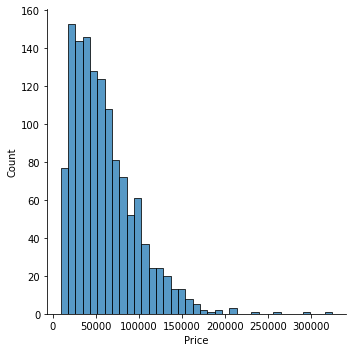

In [169]:
sns.displot(df["Price"])

In [170]:
x = df.drop(["Price"],axis =1)
y = np.log(df.Price)

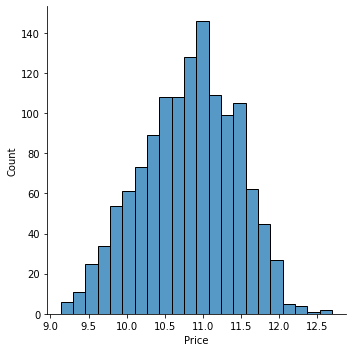

In [171]:
sns.displot(y)

In [172]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.10,random_state=20)

In [173]:
print(x_train.shape[0],x_test.shape[0],y_train.shape[0],y_test.shape[0])

1171 131 1171 131


In [174]:
x_train.isnull().sum()

Company            0
TypeName           0
Ram                0
OpSys              0
Weight             0
Touchscreen        0
Ips                0
Ppi                0
CPU_type           0
SSD                0
HDD                0
GPU_brand          0
GPU_brand_types    0
dtype: int64

In [175]:
y_train

682     11.601644
940     11.219074
148     11.590859
748     11.002618
274     10.675061
          ...    
1242    11.470547
924     11.484896
1247    10.326447
271     11.320926
474     11.144911
Name: Price, Length: 1171, dtype: float64

In [176]:
overall_data = pd.DataFrame()

# Ridge Regression

In [1003]:
def Ridge_regression():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    overall_model = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                    ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
                ("Step1",transforemed),
               ("clf",Ridge())
            ])
        
            inner_cv = KFold(n_splits=2)
        
            para = {"clf__alpha":[i for i in np.arange(0,1,0.1)] + [1]}
            grid = GridSearchCV(estimator=pipe,param_grid=para,cv=inner_cv)
        
            outer_cv = KFold(n_splits=5)
        
            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = grid.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                best = g.best_estimator_
                bested.append(best)
                #print("Outer:",best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                #print("Overall Outer Score",np.mean(outer_valid))
        
            higher = max(outer_valid)
            #print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))
        
            model_accuracy_train.append(r2_score(y_train,get.predict(x_train)))
            model_accuracy_test.append(r2_score(y_test,get.predict(x_test)))
            model_score.append(np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            model_stand.append(j)
            model.append(get)
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    print("<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<")
    best_model = pd.DataFrame({
        "Algorithm":["Ridge" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    overall_data = pd.concat([best_model.iloc[:10,:],overall_data],axis=0)
    
    print(best_model)
    return best_model

In [1004]:
ridge = Ridge_regression()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Ridge(alpha=1))])
*************Training Time Score**********************
R2_Score 0.8382392439844136
MSE 0.06395416157252487
MAE 0.19605759601141484
MAPE 0.01809431152760764
*************Testing Time Score**********************
R2_Score 0.8455308069228803
MSE 0.05143151804333256
MAE 0.18460356640783085
MAPE 0.016975012729754574
*******Differences blw train and test scores*********
r2_score_difference 0.00

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Ridge(alpha=1))])
*************Training Time Score**********************
R2_Score 0.8024279168365397
MSE 0.07811262286409425
MAE 0.21626852829225185
MAPE 0.019990547191571534
*************Testing Time Score**********************
R2_Score 0.8181845129732407
MSE 0.06053664368470871
MAE 0.1921812793954619
MAPE 0.017639583581370948
*******Differences blw train and test scores*********
r2_score_difference 0.015756596136700995
MSE_difference 0.01757597917938554
MAPE_difference 0.1986289447108809
MAE_difference 0.024087248896789953
*****************

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Ridge(alpha=1))])
*************Training Time Score**********************
R2_Score 0.801265306292928
MSE 0.0785722756524683
MAE 0.21555440501890932
MAPE 0.01986023744350089
*************Testing Time Score**********************
R2_Score 0.8162747054257857
MSE 0.06117252647388844
MAE 0.18992840998025876
MAPE 0.017382433471498794
*******Differences blw train and test scores*********
r2_score_difference 0.015009399132857704
MSE_difference 0.01739974917857986
MAPE_difference 0.19817197154741054
MAE_difference 0.025625995038650567
********************

KeyboardInterrupt: 

In [ ]:
ridge

In [ ]:
ridge.iloc[0]

In [739]:
ridge.iloc[0].loc["model"]

Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Ridge(alpha=1))])

In [740]:
mo = Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Ridge(alpha=1))])

mo.fit(x_train,y_train)
r2_score(y_train,mo.predict(x_train))

0.8398697292934001

# Lasso Regression

In [741]:
def Lasso_regression():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                    ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
                ("Step1",transforemed),
               ("clf",Lasso())
            ])
        
            inner_cv = KFold(n_splits=2)
        
            para = {"clf__alpha":[i for i in np.arange(0,1,0.1)] + [1]}
            grid = GridSearchCV(estimator=pipe,param_grid=para,cv=inner_cv)
        
            outer_cv = KFold(n_splits=5)
        
            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = grid.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                best = g.best_estimator_
                bested.append(best)
                #print("Outer:",best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                #print("Overall Outer Score",np.mean(outer_valid))
        
            higher = max(outer_valid)
            #print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))
        
            model_accuracy_train.append(r2_score(y_train,get.predict(x_train)))
            model_accuracy_test.append(r2_score(y_test,get.predict(x_test)))
            model_score.append(np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            model_stand.append(j)
            model.append(get)
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    print("<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<")
    best_model = pd.DataFrame({
        "Algorithm":["Lasso" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    
    overall_data = pd.concat([overall_data,best_model.iloc[:10,:]],axis=0)
    
    print(best_model)
    return best_model

In [742]:
lasso = Lasso_regression()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Lasso(alpha=0.0))])
*************Training Time Score**********************
R2_Score 0.8406057330259074
MSE 0.06301854018791218
MAE 0.19496894440549467
MAPE 0.017986641266991704
*************Testing Time Score**********************
R2_Score 0.8458803715307761
MSE 0.0513151282436569
MAE 0.18361079277005363
MAPE 0.01688003475264339
*******Differences blw train and test scores*********
r2_score_difference 0.0

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Lasso(alpha=0.0))])
*************Training Time Score**********************
R2_Score 0.8034897486939881
MSE 0.0776928142043995
MAE 0.21596922623770662
MAPE 0.01996270941286445
*************Testing Time Score**********************
R2_Score 0.8182293675685481
MSE 0.06052170905676172
MAE 0.19330017969926075
MAPE 0.017747464132750426
*******Differences blw train and test scores*********
r2_score_difference 0.01473961887455999
MSE_difference 0.017171105147637776
MAPE_difference 0.19822176210495618
MAE_difference 0.02266904653844587
****************

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Lasso(alpha=0.0))])
*************Training Time Score**********************
R2_Score 0.8023018576488194
MSE 0.07816246195892629
MAE 0.21517292265070048
MAPE 0.019827495788339387
*************Testing Time Score**********************
R2_Score 0.8163651437177549
MSE 0.0611424144589775
MAE 0.19104729344834642
MAPE 0.01749066566134502
*******Differences blw train and test scores*********
r2_score_difference 0.014063286068935477
MSE_difference 0.017020047499948787
MAPE_difference 0.19768225698935546
MAE_difference 0.02412562920235406
*****************

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', LeaveOneOutEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Lasso(alpha=0.0))])
*************Training Time Score**********************
R2_Score 0.8056665756753301
MSE 0.07683217811497148
MAE 0.2143437017338451
MAPE 0.0197951645928945
*************Testing Time Score**********************
R2_Score 0.8200380038815414
MSE 0.059919511885193025
MAE 0.19022889110250157
MAPE 0.0174403126076842
*******Differences blw train and test scores*********
r2_score_difference 0.01437142820621129
MSE_difference 0.016912666229778453
MAPE_difference 0.1969033891261609
MAE_difference 0.02411481063134352
******************

In [743]:
lasso

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Lasso,OneHotEncoder(),StandardScaler(),0.840606,0.845880,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Lasso,BinaryEncoder(),RobustScaler(),0.808104,0.804027,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Lasso,JamesSteinEncoder(),StandardScaler(),0.803490,0.818229,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Lasso,MEstimateEncoder(),StandardScaler(),0.804426,0.818889,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Lasso,CatBoostEncoder(),StandardScaler(),0.802302,0.816365,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Lasso,TargetEncoder(),StandardScaler(),0.805332,0.818827,"(ColumnTransformer(remainder='passthrough',\n ..."
6,Lasso,LeaveOneOutEncoder(),RobustScaler(),0.805667,0.820038,"(ColumnTransformer(remainder='passthrough',\n ..."


In [744]:
lasso.iloc[0]

Algorithm                                                  Lasso
Encoders                                         OneHotEncoder()
Stand                                           StandardScaler()
train_score                                             0.840606
test_score                                               0.84588
model          (ColumnTransformer(remainder='passthrough',\n ...
Name: 0, dtype: object

In [745]:
lasso.iloc[0].loc["model"]

Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Lasso(alpha=0.0))])

In [746]:
mo1 =Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', Lasso(alpha=0.0))])
mo1.fit(x_train,y_train)
r2_score(y_train,mo1.predict(x_train))

0.8406057330259074

# Elastic Regression

In [747]:
def Elastic_regression():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                    ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
                ("Step1",transforemed),
               ("clf",ElasticNet())
            ])
        
            inner_cv = KFold(n_splits=2)
        
            para = [{"clf__alpha":[i for i in np.arange(0,1,0.1)] + [1]},
                   {"clf__l1_ratio":[i for i in np.arange(0,1,0.1)] + [1]}]
            grid = GridSearchCV(estimator=pipe,param_grid=para,cv=inner_cv)
        
            outer_cv = KFold(n_splits=5)
        
            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = grid.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                best = g.best_estimator_
                bested.append(best)
                #print("Outer:",best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                #print("Overall Outer Score",np.mean(outer_valid))
        
            higher = max(outer_valid)
            #print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))
        
            model_accuracy_train.append(r2_score(y_train,get.predict(x_train)))
            model_accuracy_test.append(r2_score(y_test,get.predict(x_test)))
            model_score.append(np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            model_stand.append(j)
            model.append(get)
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    print("<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<")
    best_model = pd.DataFrame({
        "Algorithm":["Elastic" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    overall_data = pd.concat([overall_data,best_model.iloc[:10,:]],axis=0)
    
    print(best_model)
    return best_model

In [748]:
Elastic = Elastic_regression()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', ElasticNet(alpha=0.0))])
*************Training Time Score**********************
R2_Score 0.8406057330259074
MSE 0.06301854018791218
MAE 0.19496894440549467
MAPE 0.017986641266991704
*************Testing Time Score**********************
R2_Score 0.8458803715307761
MSE 0.0513151282436569
MAE 0.18361079277005363
MAPE 0.01688003475264339
*******Differences blw train and test scores*********
r2_score_differenc

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', ElasticNet(alpha=0.0))])
*************Training Time Score**********************
R2_Score 0.8034897486939881
MSE 0.0776928142043995
MAE 0.21596922623770662
MAPE 0.01996270941286445
*************Testing Time Score**********************
R2_Score 0.8182293675685481
MSE 0.06052170905676172
MAE 0.19330017969926075
MAPE 0.017747464132750426
*******Differences blw train and test scores*********
r2_score_difference 0.01473961887455999
MSE_difference 0.017171105147637776
MAPE_difference 0.19822176210495618
MAE_difference 0.02266904653844587
***********

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', ElasticNet(alpha=0.0))])
*************Training Time Score**********************
R2_Score 0.8023018576488194
MSE 0.07816246195892629
MAE 0.21517292265070048
MAPE 0.019827495788339387
*************Testing Time Score**********************
R2_Score 0.8163651437177549
MSE 0.0611424144589775
MAE 0.19104729344834642
MAPE 0.01749066566134502
*******Differences blw train and test scores*********
r2_score_difference 0.014063286068935477
MSE_difference 0.017020047499948787
MAPE_difference 0.19768225698935546
MAE_difference 0.02412562920235406
************

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', LeaveOneOutEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', ElasticNet(alpha=0.0))])
*************Training Time Score**********************
R2_Score 0.8056665756753301
MSE 0.07683217811497148
MAE 0.2143437017338451
MAPE 0.0197951645928945
*************Testing Time Score**********************
R2_Score 0.8200380038815414
MSE 0.059919511885193025
MAE 0.19022889110250157
MAPE 0.0174403126076842
*******Differences blw train and test scores*********
r2_score_difference 0.01437142820621129
MSE_difference 0.016912666229778453
MAPE_difference 0.1969033891261609
MAE_difference 0.02411481063134352
*************

In [749]:
Elastic

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Elastic,OneHotEncoder(),StandardScaler(),0.840606,0.845880,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Elastic,BinaryEncoder(),RobustScaler(),0.808104,0.804027,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Elastic,JamesSteinEncoder(),StandardScaler(),0.803490,0.818229,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Elastic,MEstimateEncoder(),StandardScaler(),0.804426,0.818889,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Elastic,CatBoostEncoder(),StandardScaler(),0.802302,0.816365,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Elastic,TargetEncoder(),StandardScaler(),0.805332,0.818827,"(ColumnTransformer(remainder='passthrough',\n ..."
6,Elastic,LeaveOneOutEncoder(),RobustScaler(),0.805667,0.820038,"(ColumnTransformer(remainder='passthrough',\n ..."


In [750]:
Elastic.iloc[0]

Algorithm                                                Elastic
Encoders                                         OneHotEncoder()
Stand                                           StandardScaler()
train_score                                             0.840606
test_score                                               0.84588
model          (ColumnTransformer(remainder='passthrough',\n ...
Name: 0, dtype: object

In [751]:
Elastic.iloc[0].loc["model"]

Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', ElasticNet(alpha=0.0))])

In [752]:
mo2 = Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', ElasticNet(alpha=0.0))])
mo2.fit(x_train,y_train)
r2_score(y_train,mo2.predict(x_train))

0.8406057330259074

# Linear Regression

In [753]:
def Linear():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                   ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
               ("Step1",transforemed),
               ("clf",LinearRegression())
            ])

            #inner_cv = KFold(n_splits=2)

            #para = [{"clf__alpha":[i for i in np.arange(0,1,0.1)] + [1]},
            #       {"clf__l1_ratio":[i for i in np.arange(0,1,0.1)] + [1]}]
            #grid = GridSearchCV(estimator=pipe,param_grid=para,cv=inner_cv)

            outer_cv = KFold(n_splits=5)

            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = pipe.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                #best = g.best_estimator_
                bested.append(g)
                print("Outer:",g.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(g.score(x_train.iloc[y_index],y_train.iloc[y_index]))
            print("Overall Outer Score",np.mean(outer_valid))

            higher = max(outer_valid)
            print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))

            model_accuracy_train.append(r2_score(y_train,get.predict(x_train)))
            model_accuracy_test.append(r2_score(y_test,get.predict(x_test)))
            model_score.append(np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            model_stand.append(j)
            model.append(get)
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    print("<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<<")
    best_model = pd.DataFrame({
        "Algorithm":["Linear" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    overall_data = pd.concat([overall_data,best_model.iloc[:10,:]],axis=0)
    
    print(best_model)
    return best_model

In [754]:
Linear = Linear()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Outer: 0.8145258453588771
Outer: 0.8386155257045057
Outer: -2.8045549063701995e+21
Outer: -3.302509641315851e+21
Outer: -1.009268758664142e+23
Overall Outer Score -2.140678808282005e+22
Larger Score: 0.8386155257045057
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', LinearRegression())])
*************Training Time Score**********************
R2_Score 0.840237823230281
MSE 0.06316399798060039
MAE 0.19553229375980502
MAPE 0.018046070249627438
***********

MAE 0.2154609452872977
MAPE 0.019902760980686832
*************Testing Time Score**********************
R2_Score 0.8040265935551058
MSE 0.06525061462936378
MAE 0.21131007979873975
MAPE 0.01940694336108642
*******Differences blw train and test scores*********
r2_score_difference 0.004077429564087076
MSE_difference 0.010617887798815576
MAPE_difference 0.19605400192621128
MAE_difference 0.004150865488557948
********************************************************************************
>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
Best model in BinaryEncoder() is Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', BinaryEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2

*************Training Time Score**********************
R2_Score 0.798077585396404
MSE 0.07983258144162254
MAE 0.22062009524523138
MAPE 0.02030456559076992
*************Testing Time Score**********************
R2_Score 0.7812362512022117
MSE 0.07283880668621877
MAE 0.21379733460806144
MAPE 0.019642480404249853
*******Differences blw train and test scores*********
r2_score_difference 0.016841334194192314
MSE_difference 0.0069937747554037755
MAPE_difference 0.20097761484098153
MAE_difference 0.006822760637169939
********************************************************************************
***********************************************************************************
Encoder Type: MEstimateEncoder()
Scaler Type: RobustScaler()
Outer: 0.7728416898747363
Outer: 0.8095259310162625
Outer: 0.795831230892957
Outer: 0.8138414510886256
Outer: 0.7744663211947829
Overall Outer Score 0.7933013248134728
Larger Score: 0.8138414510886256
Overall Best Model in RobustScaler(): Pipeline(steps=[('St

r2_score_difference 0.013495575033261376
MSE_difference 0.01664194412118787
MAPE_difference 0.19720054689859096
MAE_difference 0.023266635719865425
********************************************************************************
***********************************************************************************
Encoder Type: TargetEncoder()
Scaler Type: Normalizer()
Outer: 0.791080973836071
Outer: 0.7998627532686554
Outer: 0.7892510798162518
Outer: 0.7984137455081157
Outer: 0.7512458841908037
Overall Outer Score 0.7859708873239796
Larger Score: 0.7998627532686554
Overall Best Model in Normalizer(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', TargetEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', Normalizer(),
                                                  [2, 4, 7, 9, 10])])),
              

In [755]:
j = Linear

In [756]:
Linear.iloc[0]

Algorithm                                                 Linear
Encoders                                         OneHotEncoder()
Stand                                           StandardScaler()
train_score                                             0.840238
test_score                                              0.846054
model          (ColumnTransformer(remainder='passthrough',\n ...
Name: 0, dtype: object

In [757]:
Linear.iloc[0].loc["model"]

Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', LinearRegression())])

In [758]:
mo4 =Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', LinearRegression())])

mo4.fit(x_train,y_train)
r2_score(y_train,mo4.predict(x_train))

0.840341329021717

In [814]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1171 entries, 682 to 474
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Company          1171 non-null   object 
 1   TypeName         1171 non-null   object 
 2   Ram              1171 non-null   int32  
 3   OpSys            1171 non-null   object 
 4   Weight           1171 non-null   float32
 5   Touchscreen      1171 non-null   int64  
 6   Ips              1171 non-null   int64  
 7   Ppi              1171 non-null   float64
 8   CPU_type         1171 non-null   object 
 9   SSD              1171 non-null   int32  
 10  HDD              1171 non-null   int32  
 11  GPU_brand        1171 non-null   object 
 12  GPU_brand_types  1171 non-null   object 
dtypes: float32(1), float64(1), int32(3), int64(2), object(6)
memory usage: 109.8+ KB


# Decision Tree Regressor

In [187]:
def Decisiontreeregressor():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    overall_dataframe = pd.DataFrame()
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                    ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
                ("Step1",transforemed),
               ("clf",DecisionTreeRegressor())
            ])
        
            inner_cv = KFold(n_splits=2)
        
            para = {"clf__max_depth":[i for i in np.arange(0,500,50)] + [None]}
            grid = GridSearchCV(estimator=pipe,param_grid=para,cv=inner_cv)
        
            outer_cv = KFold(n_splits=5)
        
            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = grid.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                best = g.best_estimator_
                bested.append(best)
                #print("Outer:",best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                #print("Overall Outer Score",np.mean(outer_valid))
        
            higher = max(outer_valid)
            #print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))
        
            
            #Regularization
            path= get[1].cost_complexity_pruning_path(get[:-1].transform(x_train),y_train)
            alpha,impurities = path.ccp_alphas,path.impurities
            final = []
            score_train = []
            score_test = []
            alp = []
            alpha_model = []
            for value in alpha:
                new_pipe = Pipeline([
                        ("Step1",transforemed),
                        ("clf",DecisionTreeRegressor(max_depth=get[1].max_depth,ccp_alpha=value))
                ])
                new_pipe.fit(x_train,y_train)
                train_score =r2_score(y_train,new_pipe.predict(x_train))
                test_score = r2_score(y_test,new_pipe.predict(x_test))
                if train_score > 0.20:
                    final_score = np.abs(train_score - test_score)
                    score_train.append(train_score)
                    score_test.append(test_score)
                    final.append(final_score)
                    alp.append(value)
                    alpha_model.append(new_pipe)
            
            data = pd.DataFrame({
                "Algorithm":["DecisionTree" for i in range(len(final))],
                "Encoders":[i for h in range(0,len(final))],
                "Stand":[j for h in range(0,len(final))],
                "Alpha" : alp,
                "Final_diff":final,
                "train_score":score_train,
                "test_score":score_test,
                "depth":[get[1].max_depth for i in range(len(final))],
                "model":alpha_model
            })
            
            dated = data.sort_values("Final_diff",ascending=True)
            print(dated)
            getted = dated.iloc[0,:]
            a = float('{0:.4f}'.format(getted.loc["Alpha"]))
            b = getted.loc["depth"]
            print("alpha",a)
            print("depth",b)
            new_pipe1 = Pipeline([
                        ("Step1",transforemed),
                        ("clf",DecisionTreeRegressor(max_depth=b,ccp_alpha=a))
                ])
            new_pipe1.fit(x_train,y_train)
            train_ = r2_score(y_train,new_pipe1.predict(x_train))
            test_ = r2_score(y_test,new_pipe1.predict(x_test))
            diff = np.abs(train_ - test_)
            print("After:")
            print("train",train_)
            print("test",test_)
            print("alpha",new_pipe1[1].ccp_alpha)
            print("depth",new_pipe1[1].max_depth)
            model_accuracy_train.append(train_)
            model_accuracy_test.append(test_)
            model_score.append(diff)
            model_stand.append(j)
            model.append(new_pipe1)
            newer = dated.iloc[0:11,:]
            overall_dataframe = pd.concat([overall_dataframe,newer],axis=0)
            print(model_accuracy_train)
            print(model_accuracy_test)
            print(model_score)
            print(model_stand)
            print(model)
            n = dated.drop(["Alpha","Final_diff","depth"],axis=1)
            overall_data = pd.concat([overall_data,n],axis=0)
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        print(model_accuracy_train)
        print(model_accuracy_test)
        print(model_score)
        print(model_stand)
        print(model)
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        print(overall_model_train)
        print(overall_model_test)
        print(overall_score)
        print(overall_stand)
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    best_model = pd.DataFrame({
        "Algorithm":["DecisionTree" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    
    print(best_model)
    return overall_dataframe,best_model

In [188]:
final = Decisiontreeregressor()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', DecisionTreeRegressor(max_depth=450))])
*************Training Time Score**********************
R2_Score 0.9962175845190719
MSE 0.0014954258174855704
MAE 0.011133723810100662
MAPE 0.001025659516808153
*************Testing Time Score**********************
R2_Score 0.6945012217444939
MSE 0.10171779636486915
MAE 0.2413287969197037
MAPE 0.022376706281245568
*******Differences blw train and test scores*********

Overall Best Model in RobustScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', DecisionTreeRegressor(max_depth=250))])
*************Training Time Score**********************
R2_Score 0.9962175845190719
MSE 0.0014954258174855704
MAE 0.01113372381010066
MAPE 0.001025659516808153
*************Testing Time Score**********************
R2_Score 0.7569001195563381
MSE 0.08094167929735988
MAE 0.2132523625543828
MAPE 0.019833825916037114
*******Differences blw train and test scores*********
r2_score_difference 0.23931746496273387
MSE_difference -0.0794462534798743
MAPE_difference -0.008700102105936454
MAE_difference -0.20211863874428213

MSE 0.0014954258174855704
MAE 0.011133723810100658
MAPE 0.0010256595168081529
*************Testing Time Score**********************
R2_Score 0.7432399284501452
MSE 0.08548992837769766
MAE 0.23454296588647583
MAPE 0.021641558999096783
*******Differences blw train and test scores*********
r2_score_difference 0.25297765606892675
MSE_difference -0.08399450256021208
MAPE_difference -0.010507835188996124
MAE_difference -0.22340924207637516
        Algorithm         Encoders             Stand         Alpha  \
880  DecisionTree  BinaryEncoder()  StandardScaler()  9.713420e-03   
879  DecisionTree  BinaryEncoder()  StandardScaler()  5.181912e-03   
875  DecisionTree  BinaryEncoder()  StandardScaler()  2.478284e-03   
874  DecisionTree  BinaryEncoder()  StandardScaler()  2.019137e-03   
877  DecisionTree  BinaryEncoder()  StandardScaler()  3.847841e-03   
..            ...              ...               ...           ...   
112  DecisionTree  BinaryEncoder()  StandardScaler()  2.217308e-07   
34

R2_Score 0.7418917814777093
MSE 0.0859388026415989
MAE 0.23116853528239534
MAPE 0.021416420963407904
*******Differences blw train and test scores*********
r2_score_difference 0.25432580304136265
MSE_difference -0.08444337682411332
MAPE_difference -0.01028269715330724
MAE_difference -0.22003481147229467
        Algorithm         Encoders           Stand         Alpha  Final_diff  \
883  DecisionTree  BinaryEncoder()  RobustScaler()  1.473644e-02    0.004392   
882  DecisionTree  BinaryEncoder()  RobustScaler()  1.172670e-02    0.004392   
879  DecisionTree  BinaryEncoder()  RobustScaler()  5.181912e-03    0.012704   
875  DecisionTree  BinaryEncoder()  RobustScaler()  2.478284e-03    0.017753   
874  DecisionTree  BinaryEncoder()  RobustScaler()  2.019137e-03    0.017770   
..            ...              ...             ...           ...         ...   
55   DecisionTree  BinaryEncoder()  RobustScaler()  5.125103e-08    0.281733   
4    DecisionTree  BinaryEncoder()  RobustScaler()  1.18

Overall Best Model in Normalizer(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', Normalizer(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', DecisionTreeRegressor(max_depth=200))])
*************Training Time Score**********************
R2_Score 0.9962175845190719
MSE 0.0014954258174855704
MAE 0.011133723810100662
MAPE 0.001025659516808153
*************Testing Time Score**********************
R2_Score 0.6681859700655988
MSE 0.11047962980606685
MAE 0.2382507813733576
MAPE 0.0219737197248574
*******Differences blw train and test scores*********
r2_score_difference 0.3280316144534732
MSE_difference -0.10898420398858127
MAPE_difference -0.010839995914756737
MAE_difference -0.22711705756325692


Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', MEstimateEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', DecisionTreeRegressor(max_depth=450))])
*************Training Time Score**********************
R2_Score 0.9962175845190719
MSE 0.0014954258174855704
MAE 0.011133723810100658
MAPE 0.0010256595168081529
*************Testing Time Score**********************
R2_Score 0.7555057367214857
MSE 0.08140594809103592
MAE 0.22396177412530288
MAPE 0.02064780580903185
*******Differences blw train and test scores*********
r2_score_difference 0.24071184779758625
MSE_difference -0.07991052227355035
MAPE_difference -0.009514081998931192
MAE_difference -0.2128280

Overall Best Model in RobustScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', MEstimateEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf', DecisionTreeRegressor(max_depth=300))])
*************Training Time Score**********************
R2_Score 0.9962175845190719
MSE 0.0014954258174855704
MAE 0.011133723810100665
MAPE 0.0010256595168081535
*************Testing Time Score**********************
R2_Score 0.749530223645587
MSE 0.08339553386188808
MAE 0.22406607171041687
MAPE 0.02061543226324701
*******Differences blw train and test scores*********
r2_score_difference 0.24668736087348497
MSE_difference -0.08190010804440251
MAPE_difference -0.009481708453146345
MAE_difference -0.212932347900

R2_Score 0.8429418834898907
MSE 0.06209491354377777
MAE 0.16422117348558962
MAPE 0.015181990133369658
*************Testing Time Score**********************
R2_Score 0.6436787498256522
MSE 0.11863946747242568
MAE 0.2700834137439973
MAPE 0.024892336361858742
*******Differences blw train and test scores*********
r2_score_difference 0.19926313366423853
MSE_difference -0.05654455392864791
MAPE_difference 0.13932883712373087
MAE_difference -0.10586224025840768
        Algorithm           Encoders             Stand         Alpha  \
863  DecisionTree  CatBoostEncoder()  StandardScaler()  8.981448e-03   
852  DecisionTree  CatBoostEncoder()  StandardScaler()  1.495217e-03   
862  DecisionTree  CatBoostEncoder()  StandardScaler()  6.850842e-03   
851  DecisionTree  CatBoostEncoder()  StandardScaler()  1.378282e-03   
858  DecisionTree  CatBoostEncoder()  StandardScaler()  2.900377e-03   
..            ...                ...               ...           ...   
401  DecisionTree  CatBoostEncoder() 

MAPE 0.014838245080994714
*************Testing Time Score**********************
R2_Score 0.6816928358039965
MSE 0.10598243139973834
MAE 0.25226105450424563
MAPE 0.023255172845519922
*******Differences blw train and test scores*********
r2_score_difference 0.1666533298659848
MSE_difference -0.0460241691936665
MAPE_difference 0.13705017499525343
MAE_difference -0.09195570666347228
        Algorithm           Encoders           Stand         Alpha  \
862  DecisionTree  CatBoostEncoder()  RobustScaler()  8.981448e-03   
851  DecisionTree  CatBoostEncoder()  RobustScaler()  1.495217e-03   
861  DecisionTree  CatBoostEncoder()  RobustScaler()  6.850842e-03   
850  DecisionTree  CatBoostEncoder()  RobustScaler()  1.378282e-03   
856  DecisionTree  CatBoostEncoder()  RobustScaler()  2.829109e-03   
..            ...                ...             ...           ...   
278  DecisionTree  CatBoostEncoder()  RobustScaler()  2.980805e-06   
367  DecisionTree  CatBoostEncoder()  RobustScaler()  5.68

MAE_difference -0.20432026710476242
        Algorithm         Encoders             Stand         Alpha  \
873  DecisionTree  TargetEncoder()  StandardScaler()  6.850842e-03   
863  DecisionTree  TargetEncoder()  StandardScaler()  1.495217e-03   
869  DecisionTree  TargetEncoder()  StandardScaler()  2.900377e-03   
867  DecisionTree  TargetEncoder()  StandardScaler()  2.317672e-03   
868  DecisionTree  TargetEncoder()  StandardScaler()  2.829109e-03   
..            ...              ...               ...           ...   
42   DecisionTree  TargetEncoder()  StandardScaler()  3.064848e-08   
61   DecisionTree  TargetEncoder()  StandardScaler()  6.756010e-08   
236  DecisionTree  TargetEncoder()  StandardScaler()  1.973799e-06   
31   DecisionTree  TargetEncoder()  StandardScaler()  1.457529e-08   
248  DecisionTree  TargetEncoder()  StandardScaler()  2.210625e-06   

     Final_diff  train_score  test_score  depth  \
873    0.006578     0.747872    0.741294    350   
863    0.012021     0

MAE 0.011133723810100662
MAPE 0.001025659516808153
*************Testing Time Score**********************
R2_Score 0.7565972493870091
MSE 0.08104252188136207
MAE 0.21966787257615827
MAPE 0.02020283191291555
*******Differences blw train and test scores*********
r2_score_difference 0.23962033513206282
MSE_difference -0.0795470960638765
MAPE_difference -0.009069108102814888
MAE_difference -0.2085341487660576
        Algorithm         Encoders           Stand         Alpha  Final_diff  \
872  DecisionTree  TargetEncoder()  RobustScaler()  4.509732e-03    0.006578   
873  DecisionTree  TargetEncoder()  RobustScaler()  6.850842e-03    0.006578   
863  DecisionTree  TargetEncoder()  RobustScaler()  1.495217e-03    0.012021   
868  DecisionTree  TargetEncoder()  RobustScaler()  2.829109e-03    0.015708   
855  DecisionTree  TargetEncoder()  RobustScaler()  9.854771e-04    0.016580   
..            ...              ...             ...           ...         ...   
95   DecisionTree  TargetEncoder

MAPE_difference 0.34636259833372307
MAE_difference 0.003430466817126665
        Algorithm              Encoders             Stand         Alpha  \
132  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  3.461841e-07   
297  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  3.450369e-06   
256  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  2.345001e-06   
650  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  4.583624e-05   
308  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  3.690973e-06   
..            ...                   ...               ...           ...   
872  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  2.900377e-03   
871  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  2.829109e-03   
875  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  4.509732e-03   
870  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  2.317672e-03   
876  DecisionTree  LeaveOneOutEncoder()  StandardScaler()  6.850842e-03   

     Final_diff  train_scor

R2_Score 0.3576721670825126
MSE 0.21386721112692733
MAE 0.3838909670721354
MAPE 0.0352560105497531
*******Differences blw train and test scores*********
r2_score_difference 0.022623467724270485
MSE_difference 0.0311407504762391
MAPE_difference 0.3581090525106023
MAE_difference 0.009474095988220022
        Algorithm              Encoders           Stand         Alpha  \
167  DecisionTree  LeaveOneOutEncoder()  RobustScaler()  8.176722e-07   
403  DecisionTree  LeaveOneOutEncoder()  RobustScaler()  6.980313e-06   
322  DecisionTree  LeaveOneOutEncoder()  RobustScaler()  4.392405e-06   
126  DecisionTree  LeaveOneOutEncoder()  RobustScaler()  3.355729e-07   
429  DecisionTree  LeaveOneOutEncoder()  RobustScaler()  8.126139e-06   
..            ...                   ...             ...           ...   
874  DecisionTree  LeaveOneOutEncoder()  RobustScaler()  4.509732e-03   
871  DecisionTree  LeaveOneOutEncoder()  RobustScaler()  2.900377e-03   
873  DecisionTree  LeaveOneOutEncoder()  Rob

In [189]:
pd.get_option("display.max_rows")

60

In [190]:
pd.set_option("display.max_rows",None)

In [191]:
#You can choose Model from function recommanded or yoou can manually choose the best model
final[0]

,Algorithm,Encoders,Stand,Alpha,Final_diff,train_score,test_score,depth,model
881,DecisionTree,OneHotEncoder(),StandardScaler(),7.540181e-03,0.002056,0.742504,0.740448,450,"(ColumnTransformer(remainder='passthrough',\n ..."
880,DecisionTree,OneHotEncoder(),StandardScaler(),4.509732e-03,0.002056,0.742504,0.740448,450,"(ColumnTransformer(remainder='passthrough',\n ..."
879,DecisionTree,OneHotEncoder(),StandardScaler(),3.848297e-03,0.015712,0.773378,0.757666,450,"(ColumnTransformer(remainder='passthrough',\n ..."
875,DecisionTree,OneHotEncoder(),StandardScaler(),2.127089e-03,0.017807,0.797164,0.779357,450,"(ColumnTransformer(remainder='passthrough',\n ..."
873,DecisionTree,OneHotEncoder(),StandardScaler(),1.909596e-03,0.020029,0.807651,0.787622,450,"(ColumnTransformer(remainder='passthrough',\n ..."
874,DecisionTree,OneHotEncoder(),StandardScaler(),2.019137e-03,0.020029,0.807651,0.787622,450,"(ColumnTransformer(remainder='passthrough',\n ..."
870,DecisionTree,OneHotEncoder(),StandardScaler(),1.404607e-03,0.021694,0.824311,0.802617,450,"(ColumnTransformer(remainder='passthrough',\n ..."
872,DecisionTree,OneHotEncoder(),StandardScaler(),1.819815e-03,0.022700,0.817084,0.794384,450,"(ColumnTransformer(remainder='passthrough',\n ..."
878,DecisionTree,OneHotEncoder(),StandardScaler(),3.366957e-03,0.023412,0.781894,0.758482,450,"(ColumnTransformer(remainder='passthrough',\n ..."
869,DecisionTree,OneHotEncoder(),StandardScaler(),1.336467e-03,0.028005,0.827691,0.799687,450,"(ColumnTransformer(remainder='passthrough',\n ..."


In [192]:
get =final[0].sort_values("train_score",ascending=False).reset_index()
get

,index,Algorithm,Encoders,Stand,Alpha,Final_diff,train_score,test_score,depth,model
0,854,DecisionTree,TargetEncoder(),StandardScaler(),9.299242e-04,0.018600,0.849778,0.831178,350,"(ColumnTransformer(remainder='passthrough',\n ..."
1,855,DecisionTree,TargetEncoder(),StandardScaler(),9.854771e-04,0.018600,0.849778,0.831178,350,"(ColumnTransformer(remainder='passthrough',\n ..."
2,856,DecisionTree,TargetEncoder(),RobustScaler(),1.102442e-03,0.016580,0.847286,0.830706,450,"(ColumnTransformer(remainder='passthrough',\n ..."
3,856,DecisionTree,TargetEncoder(),StandardScaler(),1.102442e-03,0.016580,0.847286,0.830706,350,"(ColumnTransformer(remainder='passthrough',\n ..."
4,855,DecisionTree,TargetEncoder(),RobustScaler(),9.854771e-04,0.016580,0.847286,0.830706,450,"(ColumnTransformer(remainder='passthrough',\n ..."
5,845,DecisionTree,MEstimateEncoder(),RobustScaler(),1.141881e-03,0.016476,0.846814,0.830338,300,"(ColumnTransformer(remainder='passthrough',\n ..."
6,842,DecisionTree,MEstimateEncoder(),StandardScaler(),1.085497e-03,0.016476,0.846814,0.830338,450,"(ColumnTransformer(remainder='passthrough',\n ..."
7,843,DecisionTree,MEstimateEncoder(),StandardScaler(),1.141881e-03,0.018654,0.843926,0.825272,450,"(ColumnTransformer(remainder='passthrough',\n ..."
8,846,DecisionTree,MEstimateEncoder(),RobustScaler(),1.144032e-03,0.015413,0.841032,0.825619,300,"(ColumnTransformer(remainder='passthrough',\n ..."
9,845,DecisionTree,MEstimateEncoder(),StandardScaler(),1.194884e-03,0.015413,0.841032,0.825619,450,"(ColumnTransformer(remainder='passthrough',\n ..."


In [193]:
final[0].iloc[0]

Algorithm                                           DecisionTree
Encoders                                         OneHotEncoder()
Stand                                           StandardScaler()
Alpha                                                    0.00754
Final_diff                                              0.002056
train_score                                             0.742504
test_score                                              0.740448
depth                                                        450
model          (ColumnTransformer(remainder='passthrough',\n ...
Name: 881, dtype: object

In [194]:
get.loc[5,"model"]

Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', MEstimateEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 DecisionTreeRegressor(ccp_alpha=0.0011418811826690882,
                                       max_depth=300))])

In [195]:
final[1]

,Algorithm,Encoders,Stand,train_score,test_score,model
0,DecisionTree,OneHotEncoder(),RobustScaler(),0.742504,0.740448,"(ColumnTransformer(remainder='passthrough',\n ..."
1,DecisionTree,BinaryEncoder(),RobustScaler(),0.670742,0.675134,"(ColumnTransformer(remainder='passthrough',\n ..."
2,DecisionTree,JamesSteinEncoder(),Normalizer(),0.751438,0.756815,"(ColumnTransformer(remainder='passthrough',\n ..."
3,DecisionTree,MEstimateEncoder(),Normalizer(),0.763820,0.752319,"(ColumnTransformer(remainder='passthrough',\n ..."
4,DecisionTree,CatBoostEncoder(),StandardScaler(),0.728063,0.726712,"(ColumnTransformer(remainder='passthrough',\n ..."
5,DecisionTree,TargetEncoder(),Normalizer(),0.763820,0.752319,"(ColumnTransformer(remainder='passthrough',\n ..."
6,DecisionTree,LeaveOneOutEncoder(),Normalizer(),0.198058,0.173298,"(ColumnTransformer(remainder='passthrough',\n ..."


In [196]:
final[1].iloc[1]

Algorithm                                           DecisionTree
Encoders                                         BinaryEncoder()
Stand                                             RobustScaler()
train_score                                             0.670742
test_score                                              0.675134
model          (ColumnTransformer(remainder='passthrough',\n ...
Name: 1, dtype: object

In [197]:
final[1].iloc[1].loc["model"]

Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', BinaryEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 DecisionTreeRegressor(ccp_alpha=0.0147, max_depth=100))])

In [199]:
pipe = Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', BinaryEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 DecisionTreeRegressor(ccp_alpha=0.0147, max_depth=100))])

pipe.fit(x_train,y_train)
r2_score(y_train,pipe.predict(x_train))

0.6707420736733205

In [200]:
pd.set_option("display.max_rows",10)

In [201]:
final[1]

,Algorithm,Encoders,Stand,train_score,test_score,model
0,DecisionTree,OneHotEncoder(),RobustScaler(),0.742504,0.740448,"(ColumnTransformer(remainder='passthrough',\n ..."
1,DecisionTree,BinaryEncoder(),RobustScaler(),0.670742,0.675134,"(ColumnTransformer(remainder='passthrough',\n ..."
2,DecisionTree,JamesSteinEncoder(),Normalizer(),0.751438,0.756815,"(ColumnTransformer(remainder='passthrough',\n ..."
3,DecisionTree,MEstimateEncoder(),Normalizer(),0.763820,0.752319,"(ColumnTransformer(remainder='passthrough',\n ..."
4,DecisionTree,CatBoostEncoder(),StandardScaler(),0.728063,0.726712,"(ColumnTransformer(remainder='passthrough',\n ..."
5,DecisionTree,TargetEncoder(),Normalizer(),0.763820,0.752319,"(ColumnTransformer(remainder='passthrough',\n ..."
6,DecisionTree,LeaveOneOutEncoder(),Normalizer(),0.198058,0.173298,"(ColumnTransformer(remainder='passthrough',\n ..."


In [202]:
overall_data

,Algorithm,Encoders,Stand,train_score,test_score,model
879,DecisionTree,OneHotEncoder(),RobustScaler(),0.742504,0.740448,"(ColumnTransformer(remainder='passthrough',\n ..."
878,DecisionTree,OneHotEncoder(),RobustScaler(),0.753911,0.741141,"(ColumnTransformer(remainder='passthrough',\n ..."
877,DecisionTree,OneHotEncoder(),RobustScaler(),0.753911,0.741141,"(ColumnTransformer(remainder='passthrough',\n ..."
876,DecisionTree,OneHotEncoder(),RobustScaler(),0.773378,0.757666,"(ColumnTransformer(remainder='passthrough',\n ..."
873,DecisionTree,OneHotEncoder(),RobustScaler(),0.802544,0.782533,"(ColumnTransformer(remainder='passthrough',\n ..."
...,...,...,...,...,...,...
874,DecisionTree,LeaveOneOutEncoder(),RobustScaler(),0.482406,0.389052,"(ColumnTransformer(remainder='passthrough',\n ..."
871,DecisionTree,LeaveOneOutEncoder(),RobustScaler(),0.482406,0.389052,"(ColumnTransformer(remainder='passthrough',\n ..."
873,DecisionTree,LeaveOneOutEncoder(),RobustScaler(),0.482406,0.389052,"(ColumnTransformer(remainder='passthrough',\n ..."
869,DecisionTree,LeaveOneOutEncoder(),RobustScaler(),0.479159,0.374584,"(ColumnTransformer(remainder='passthrough',\n ..."


# RandomForestRegressor

In [206]:
def Randomforestregressor():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    overall_dataframe = pd.DataFrame()
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                    ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
                ("Step1",transforemed),
               ("clf",RandomForestRegressor())
            ])
        
            inner_cv = KFold(n_splits=2)
        
            para = {"clf__max_depth":[i for i in np.arange(0,1000,50)] + [None],
                   "clf__n_estimators":[i for i in np.arange(0,1000,50)],
                   "clf__ccp_alpha":np.linspace(0,1,1000)}
            grid = RandomizedSearchCV(estimator=pipe,param_distributions=para,cv=inner_cv)
        
            outer_cv = KFold(n_splits=5)
        
            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = grid.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                best = g.best_estimator_
                bested.append(best)
                #print("Outer:",best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                #print("Overall Outer Score",np.mean(outer_valid))
        
            higher = max(outer_valid)
            #print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))
        
            
            model_accuracy_train.append(r2_score(y_train,get.predict(x_train)))
            model_accuracy_test.append(r2_score(y_test,get.predict(x_test)))
            model_score.append(np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            model_stand.append(j)
            model.append(get)
            print(model_accuracy_train)
            print(model_accuracy_test)
            print(model_score)
            print(model_stand)
            print(model)
            
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        print(model_accuracy_train)
        print(model_accuracy_test)
        print(model_score)
        print(model_stand)
        print(model)
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        print(overall_model_train)
        print(overall_model_test)
        print(overall_score)
        print(overall_stand)
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    best_model = pd.DataFrame({
        "Algorithm":["RandomForest" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    overall_data = pd.concat([overall_data,best_model],axis=0)
    print(best_model)
    return overall_dataframe,best_model

In [207]:
random = Randomforestregressor()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 RandomForestRegressor(ccp_alpha=0.04504504504504504,
                                       max_depth=950, n_estimators=150))])
*************Training Time Score**********************
R2_Score 0.5350839475563012
MSE 0.18381044369488375
MAE 0.3468170432338285
MAPE 0.03224353993766049
*************Testing Time Score**********************
R2_Score 0.4443638451522015
MSE 0.18500265557362708
MA

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', BinaryEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 RandomForestRegressor(ccp_alpha=0.002002002002002002,
                                       max_depth=200, n_estimators=950))])
*************Training Time Score**********************
R2_Score 0.8365710661388699
MSE 0.06461369679041994
MAE 0.1994884308952142
MAPE 0.018462865315873028
*************Testing Time Score**********************
R2_Score 0.807623567096239
MSE 0.06405297899796755
MAE 0.20790358699693878
MAPE 0.019244505291346456
*******Differences blw train and test scores*********
r2_score_difference 0.028947499042630942


Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 RandomForestRegressor(ccp_alpha=0.009009009009009009,
                                       max_depth=650, n_estimators=500))])
*************Training Time Score**********************
R2_Score 0.7604379166338564
MSE 0.09471390072368838
MAE 0.24314647203562634
MAPE 0.022499695959731465
*************Testing Time Score**********************
R2_Score 0.7585715454963191
MSE 0.08038516720794082
MAE 0.23176576243104793
MAPE 0.02153037825772486
*******Differences blw train and test scores*********
r2_score_difference 0.00186637113753

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', MEstimateEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 RandomForestRegressor(ccp_alpha=0.02702702702702703,
                                       max_depth=400, n_estimators=200))])
*************Training Time Score**********************
R2_Score 0.6875185489848471
MSE 0.12354349533773515
MAE 0.2810031825216817
MAPE 0.026036414488088067
*************Testing Time Score**********************
R2_Score 0.6504718399956508
MSE 0.11637766411417391
MAE 0.2698864216220543
MAPE 0.025076054646269736
*******Differences blw train and test scores*********
r2_score_difference 0.03704670898919626

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 RandomForestRegressor(ccp_alpha=0.043043043043043044,
                                       max_depth=450, n_estimators=600))])
*************Training Time Score**********************
R2_Score 0.5605651828976344
MSE 0.17373611490075933
MAE 0.3367627936901834
MAPE 0.0313167410176481
*************Testing Time Score**********************
R2_Score 0.48370251134017195
MSE 0.17190459194331395
MAE 0.3176607282675279
MAPE 0.029442155896274396
*******Differences blw train and test scores*********
r2_score_difference 0.0768626715574624
M

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', TargetEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 RandomForestRegressor(ccp_alpha=0.02102102102102102,
                                       max_depth=300, n_estimators=250))])
*************Training Time Score**********************
R2_Score 0.707560791218437
MSE 0.11561954128574503
MAE 0.2715640880382323
MAPE 0.025108560152073144
*************Testing Time Score**********************
R2_Score 0.6815244157189191
MSE 0.10603850795760705
MAE 0.26437797892150555
MAPE 0.024572826583664317
*******Differences blw train and test scores*********
r2_score_difference 0.026036375499517872
M

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', LeaveOneOutEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 RandomForestRegressor(ccp_alpha=0.11211211211211211,
                                       max_depth=550, n_estimators=300))])
*************Training Time Score**********************
R2_Score 0.503954060854019
MSE 0.1961180382742533
MAE 0.358568922669489
MAPE 0.033246025670176524
*************Testing Time Score**********************
R2_Score 0.4173457760502959
MSE 0.19399849662665122
MAE 0.34303554814699144
MAPE 0.031687207422970494
*******Differences blw train and test scores*********
r2_score_difference 0.08660828480372307

      Algorithm              Encoders             Stand  train_score  \
0  RandomForest       OneHotEncoder()      Normalizer()     0.634039   
1  RandomForest       BinaryEncoder()      Normalizer()     0.684358   
2  RandomForest   JamesSteinEncoder()  StandardScaler()     0.760438   
3  RandomForest    MEstimateEncoder()    RobustScaler()     0.705007   
4  RandomForest     CatBoostEncoder()    RobustScaler()     0.772219   
5  RandomForest       TargetEncoder()  StandardScaler()     0.707561   
6  RandomForest  LeaveOneOutEncoder()      Normalizer()     0.449214   

   test_score                                              model  
0    0.671898  (ColumnTransformer(remainder='passthrough',\n ...  
1    0.658547  (ColumnTransformer(remainder='passthrough',\n ...  
2    0.758572  (ColumnTransformer(remainder='passthrough',\n ...  
3    0.674852  (ColumnTransformer(remainder='passthrough',\n ...  
4    0.766131  (ColumnTransformer(remainder='passthrough',\n ...  
5    0.681524  (Colum

In [208]:
overall_data

,Algorithm,Encoders,Stand,train_score,test_score,model
879,DecisionTree,OneHotEncoder(),RobustScaler(),0.742504,0.740448,"(ColumnTransformer(remainder='passthrough',\n ..."
878,DecisionTree,OneHotEncoder(),RobustScaler(),0.753911,0.741141,"(ColumnTransformer(remainder='passthrough',\n ..."
877,DecisionTree,OneHotEncoder(),RobustScaler(),0.753911,0.741141,"(ColumnTransformer(remainder='passthrough',\n ..."
876,DecisionTree,OneHotEncoder(),RobustScaler(),0.773378,0.757666,"(ColumnTransformer(remainder='passthrough',\n ..."
873,DecisionTree,OneHotEncoder(),RobustScaler(),0.802544,0.782533,"(ColumnTransformer(remainder='passthrough',\n ..."
...,...,...,...,...,...,...
2,RandomForest,JamesSteinEncoder(),StandardScaler(),0.760438,0.758572,"(ColumnTransformer(remainder='passthrough',\n ..."
3,RandomForest,MEstimateEncoder(),RobustScaler(),0.705007,0.674852,"(ColumnTransformer(remainder='passthrough',\n ..."
4,RandomForest,CatBoostEncoder(),RobustScaler(),0.772219,0.766131,"(ColumnTransformer(remainder='passthrough',\n ..."
5,RandomForest,TargetEncoder(),StandardScaler(),0.707561,0.681524,"(ColumnTransformer(remainder='passthrough',\n ..."


In [209]:
overall_data.to_csv("C:\\Users\\ARUN\\Saved Games\\Testing\\Laptop price\\till.csv")

In [210]:
def Extratreeregressor():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    overall_dataframe = pd.DataFrame()
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                    ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
                ("Step1",transforemed),
               ("clf",ExtraTreesRegressor())
            ])
        
            inner_cv = KFold(n_splits=2)
        
            para = {"clf__max_depth":[i for i in np.arange(0,1000,50)] + [None],
                   "clf__n_estimators":[i for i in np.arange(0,1000,50)],
                   "clf__ccp_alpha":np.linspace(0,1,1000)}
            grid = RandomizedSearchCV(estimator=pipe,param_distributions=para,cv=inner_cv)
        
            outer_cv = KFold(n_splits=5)
        
            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = grid.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                best = g.best_estimator_
                bested.append(best)
                #print("Outer:",best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                #print("Overall Outer Score",np.mean(outer_valid))
        
            higher = max(outer_valid)
            #print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))
        
            
            model_accuracy_train.append(r2_score(y_train,get.predict(x_train)))
            model_accuracy_test.append(r2_score(y_test,get.predict(x_test)))
            model_score.append(np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            model_stand.append(j)
            model.append(get)
            print(model_accuracy_train)
            print(model_accuracy_test)
            print(model_score)
            print(model_stand)
            print(model)
            
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        print(model_accuracy_train)
        print(model_accuracy_test)
        print(model_score)
        print(model_stand)
        print(model)
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        print(overall_model_train)
        print(overall_model_test)
        print(overall_score)
        print(overall_stand)
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    best_model = pd.DataFrame({
        "Algorithm":["Extra" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    overall_data = pd.concat([overall_data,best_model],axis=0)
    print(best_model)
    return overall_dataframe,best_model

In [211]:
extra = Extratreeregressor()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 ExtraTreesRegressor(ccp_alpha=0.050050050050050046,
                                     max_depth=200, n_estimators=50))])
*************Training Time Score**********************
R2_Score 0.5916452942143298
MSE 0.16144819964986581
MAE 0.31609494305092645
MAPE 0.02923716147930473
*************Testing Time Score**********************
R2_Score 0.6828217744418317
MSE 0.10560654397024521
MAE 0

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', BinaryEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 ExtraTreesRegressor(ccp_alpha=0.029029029029029027,
                                     max_depth=750, n_estimators=600))])
*************Training Time Score**********************
R2_Score 0.6587779625004784
MSE 0.1349064498452755
MAE 0.2927442585432875
MAPE 0.02720175893718889
*************Testing Time Score**********************
R2_Score 0.6610640197834665
MSE 0.1128509292680659
MAE 0.2712176517894186
MAPE 0.025077932173036593
*******Differences blw train and test scores*********
r2_score_difference 0.002286057282988141
MSE_dif

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 ExtraTreesRegressor(ccp_alpha=0.022022022022022022,
                                     max_depth=750, n_estimators=800))])
*************Training Time Score**********************
R2_Score 0.6666060154082842
MSE 0.1318115300835513
MAE 0.2865963662732616
MAPE 0.026493790947293587
*************Testing Time Score**********************
R2_Score 0.7339623770264185
MSE 0.08857894919759102
MAE 0.2422714050160202
MAPE 0.022392617158901052
*******Differences blw train and test scores*********
r2_score_difference 0.0673563616181343
MSE

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', MEstimateEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 ExtraTreesRegressor(ccp_alpha=0.04004004004004004,
                                     max_depth=800, n_estimators=650))])
*************Training Time Score**********************
R2_Score 0.6275281646496081
MSE 0.14726145281441796
MAE 0.3021948582204395
MAPE 0.0279112267510078
*************Testing Time Score**********************
R2_Score 0.6960659812213872
MSE 0.1011967995650145
MAE 0.2552838345843493
MAPE 0.02354431359593059
*******Differences blw train and test scores*********
r2_score_difference 0.06853781657177904
MSE_dif

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 ExtraTreesRegressor(ccp_alpha=0.005005005005005005,
                                     max_depth=350, n_estimators=350))])
*************Training Time Score**********************
R2_Score 0.7997246031598929
MSE 0.07918141212989632
MAE 0.22539990390987552
MAPE 0.020811423920209977
*************Testing Time Score**********************
R2_Score 0.8236309114025478
MSE 0.058723230061526
MAE 0.20585659448922938
MAPE 0.019035897286444958
*******Differences blw train and test scores*********
r2_score_difference 0.02390630824265494
MSE

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', TargetEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 ExtraTreesRegressor(ccp_alpha=0.022022022022022022,
                                     max_depth=350, n_estimators=200))])
*************Training Time Score**********************
R2_Score 0.6841649306648419
MSE 0.12486939077228376
MAE 0.27840193169042815
MAPE 0.025720349495597098
*************Testing Time Score**********************
R2_Score 0.7438096442229181
MSE 0.0853002378221685
MAE 0.23776897403368571
MAPE 0.02194972583821986
*******Differences blw train and test scores*********
r2_score_difference 0.05964471355807621
MSE_d

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', LeaveOneOutEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 ExtraTreesRegressor(ccp_alpha=0.02702702702702703,
                                     max_depth=300, n_estimators=500))])
*************Training Time Score**********************
R2_Score 0.662339680467386
MSE 0.13349827958233837
MAE 0.28676930929318195
MAPE 0.026499804828404864
*************Testing Time Score**********************
R2_Score 0.7345120448693012
MSE 0.08839593373013178
MAE 0.24051273870113754
MAPE 0.02220041790525802
*******Differences blw train and test scores*********
r2_score_difference 0.07217236440191521
M

  Algorithm              Encoders             Stand  train_score  test_score  \
0     Extra       OneHotEncoder()    RobustScaler()     0.763372    0.789957   
1     Extra       BinaryEncoder()  StandardScaler()     0.658778    0.661064   
2     Extra   JamesSteinEncoder()      Normalizer()     0.699866    0.748563   
3     Extra    MEstimateEncoder()    RobustScaler()     0.686944    0.746782   
4     Extra     CatBoostEncoder()      Normalizer()     0.786294    0.786573   
5     Extra       TargetEncoder()      Normalizer()     0.850964    0.816087   
6     Extra  LeaveOneOutEncoder()    RobustScaler()     0.617363    0.686678   

                                               model  
0  (ColumnTransformer(remainder='passthrough',\n ...  
1  (ColumnTransformer(remainder='passthrough',\n ...  
2  (ColumnTransformer(remainder='passthrough',\n ...  
3  (ColumnTransformer(remainder='passthrough',\n ...  
4  (ColumnTransformer(remainder='passthrough',\n ...  
5  (ColumnTransformer(remaind

In [154]:
extra[1]

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Extra,OneHotEncoder(),RobustScaler(),0.762371,0.790784,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Extra,BinaryEncoder(),StandardScaler(),0.675617,0.675683,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Extra,JamesSteinEncoder(),Normalizer(),0.848679,0.816592,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Extra,MEstimateEncoder(),Normalizer(),0.732892,0.772268,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Extra,CatBoostEncoder(),StandardScaler(),0.822137,0.834451,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Extra,TargetEncoder(),RobustScaler(),0.727246,0.775274,"(ColumnTransformer(remainder='passthrough',\n ..."
6,Extra,LeaveOneOutEncoder(),Normalizer(),0.729310,0.760033,"(ColumnTransformer(remainder='passthrough',\n ..."


In [158]:
ove = pd.read_csv("C:\\Users\\ARUN\\Saved Games\\Testing\\Laptop price\\till.csv")
ove

,Unnamed: 0,Algorithm,Encoders,Stand,train_score,test_score,model
0,0,Ridge,OneHotEncoder(),StandardScaler(),0.839870,0.847516,"Pipeline(steps=[('Step1',\n Co..."
1,1,Ridge,BinaryEncoder(),StandardScaler(),0.808088,0.804387,"Pipeline(steps=[('Step1',\n Co..."
2,2,Ridge,JamesSteinEncoder(),StandardScaler(),0.803473,0.818390,"Pipeline(steps=[('Step1',\n Co..."
3,3,Ridge,MEstimateEncoder(),StandardScaler(),0.804417,0.819000,"Pipeline(steps=[('Step1',\n Co..."
4,4,Ridge,CatBoostEncoder(),StandardScaler(),0.802329,0.816502,"Pipeline(steps=[('Step1',\n Co..."
...,...,...,...,...,...,...,...
35810,2,RandomForest,JamesSteinEncoder(),StandardScaler(),0.761729,0.760732,"Pipeline(steps=[('Step1',\n Co..."
35811,3,RandomForest,MEstimateEncoder(),StandardScaler(),0.828347,0.817494,"Pipeline(steps=[('Step1',\n Co..."
35812,4,RandomForest,CatBoostEncoder(),RobustScaler(),0.725320,0.713472,"Pipeline(steps=[('Step1',\n Co..."
35813,5,RandomForest,TargetEncoder(),StandardScaler(),0.733310,0.714276,"Pipeline(steps=[('Step1',\n Co..."


In [161]:
n = pd.concat([ove,overall_data],axis=0).drop("Unnamed: 0",axis=1)

In [162]:
n

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Ridge,OneHotEncoder(),StandardScaler(),0.839870,0.847516,"Pipeline(steps=[('Step1',\n Co..."
1,Ridge,BinaryEncoder(),StandardScaler(),0.808088,0.804387,"Pipeline(steps=[('Step1',\n Co..."
2,Ridge,JamesSteinEncoder(),StandardScaler(),0.803473,0.818390,"Pipeline(steps=[('Step1',\n Co..."
3,Ridge,MEstimateEncoder(),StandardScaler(),0.804417,0.819000,"Pipeline(steps=[('Step1',\n Co..."
4,Ridge,CatBoostEncoder(),StandardScaler(),0.802329,0.816502,"Pipeline(steps=[('Step1',\n Co..."
...,...,...,...,...,...,...
2,Extra,JamesSteinEncoder(),Normalizer(),0.848679,0.816592,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Extra,MEstimateEncoder(),Normalizer(),0.732892,0.772268,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Extra,CatBoostEncoder(),StandardScaler(),0.822137,0.834451,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Extra,TargetEncoder(),RobustScaler(),0.727246,0.775274,"(ColumnTransformer(remainder='passthrough',\n ..."


In [212]:
overall_data.to_csv("C:\\Users\\ARUN\\Saved Games\\Testing\\Laptop price\\till2.csv")

In [177]:
def Adaboost():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    overall_dataframe = pd.DataFrame()
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                    ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
                ("Step1",transforemed),
               ("clf",AdaBoostRegressor())
            ])
        
            inner_cv = KFold(n_splits=2)
        
            para = {"clf__learning_rate":[i for i in np.arange(0,1,0.1)],
                   "clf__n_estimators":[i for i in np.arange(0,1000,50)]}
            grid = RandomizedSearchCV(estimator=pipe,param_distributions=para,cv=inner_cv)
        
            outer_cv = KFold(n_splits=5)
        
            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = grid.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                best = g.best_estimator_
                bested.append(best)
                #print("Outer:",best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                #print("Overall Outer Score",np.mean(outer_valid))
        
            higher = max(outer_valid)
            #print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))
        
            
            model_accuracy_train.append(r2_score(y_train,get.predict(x_train)))
            model_accuracy_test.append(r2_score(y_test,get.predict(x_test)))
            model_score.append(np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            model_stand.append(j)
            model.append(get)
            print(model_accuracy_train)
            print(model_accuracy_test)
            print(model_score)
            print(model_stand)
            print(model)
            
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        print(model_accuracy_train)
        print(model_accuracy_test)
        print(model_score)
        print(model_stand)
        print(model)
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        print(overall_model_train)
        print(overall_model_test)
        print(overall_score)
        print(overall_stand)
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    best_model = pd.DataFrame({
        "Algorithm":["Adaboost" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    overall_data = pd.concat([overall_data,best_model],axis=0)
    print(best_model)
    return overall_dataframe,best_model

In [178]:
ada = Adaboost()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.8, n_estimators=950))])
*************Training Time Score**********************
R2_Score 0.808949194979987
MSE 0.07553435303945756
MAE 0.22952587649800954
MAPE 0.021343321215277274
*************Testing Time Score**********************
R2_Score 0.7966795442722202
MSE 0.06769686226120925
MAE 0.2157687482903507
MAPE 0.02011663941251777
*******Differences blw 

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', BinaryEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.9, n_estimators=400))])
*************Training Time Score**********************
R2_Score 0.8122929747620594
MSE 0.07421234739536303
MAE 0.2261889929761226
MAPE 0.021019738436381528
*************Testing Time Score**********************
R2_Score 0.7954116647241308
MSE 0.06811901096643212
MAE 0.21855586186980538
MAPE 0.02029058899904644
*******Differences blw train and test scores*********
r2_score_difference 0.016881310037928587
MSE_difference 0.006093336428930909
MAPE_difference 0.20589840397707615

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.7000000000000001,
                                   n_estimators=350))])
*************Training Time Score**********************
R2_Score 0.8266283171893314
MSE 0.06854468838848451
MAE 0.21715778312706036
MAPE 0.020198000728353618
*************Testing Time Score**********************
R2_Score 0.8181299757586293
MSE 0.06055480220344917
MAE 0.203648560606513
MAPE 0.018925208287344824
*******Differences blw train and test scores*********
r2_score_difference 0.00849834143070205
MSE_difference 0.0

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', MEstimateEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.8, n_estimators=300))])
*************Training Time Score**********************
R2_Score 0.8201279678374384
MSE 0.07111468375057818
MAE 0.22173665262056524
MAPE 0.020601241611758966
*************Testing Time Score**********************
R2_Score 0.8098210383267611
MSE 0.06332131672285049
MAE 0.21039604604463857
MAPE 0.019560445894174435
*******Differences blw train and test scores*********
r2_score_difference 0.010306929510677243
MSE_difference 0.007793367027727691
MAPE_difference 0.202176206726

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.9, n_estimators=250))])
*************Training Time Score**********************
R2_Score 0.8341852508126565
MSE 0.06555695906622286
MAE 0.20942144718932298
MAPE 0.01950885429040328
*************Testing Time Score**********************
R2_Score 0.8174145349583092
MSE 0.06079301285048891
MAE 0.20213466297815835
MAPE 0.018781056398849073
*******Differences blw train and test scores*********
r2_score_difference 0.016770715854347307
MSE_difference 0.00476394621573395
MAPE_difference 0.190640390790473

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', TargetEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.4, n_estimators=250))])
*************Training Time Score**********************
R2_Score 0.8329012918889663
MSE 0.06606458847202418
MAE 0.21394861015290245
MAPE 0.019919853226157195
*************Testing Time Score**********************
R2_Score 0.8204525612321256
MSE 0.05978148233100274
MAE 0.20567228409324168
MAPE 0.01914789751912943
*******Differences blw train and test scores*********
r2_score_difference 0.012448730656840712
MSE_difference 0.006283106141021434
MAPE_difference 0.1948007126337730

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', LeaveOneOutEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.2, n_estimators=850))])
*************Training Time Score**********************
R2_Score 0.719848026214196
MSE 0.11076162746564253
MAE 0.26745323941331184
MAPE 0.024641702533301134
*************Testing Time Score**********************
R2_Score 0.6935136177146481
MSE 0.10204662552147208
MAE 0.25814420592933335
MAPE 0.02381280572137551
*******Differences blw train and test scores*********
r2_score_difference 0.026334408499547823
MSE_difference 0.00871500194417045
MAPE_difference 0.2436404336919

  Algorithm              Encoders             Stand  train_score  test_score  \
0  Adaboost       OneHotEncoder()  StandardScaler()     0.808949    0.796680   
1  Adaboost       BinaryEncoder()  StandardScaler()     0.812293    0.795412   
2  Adaboost   JamesSteinEncoder()    RobustScaler()     0.821031    0.813099   
3  Adaboost    MEstimateEncoder()  StandardScaler()     0.820128    0.809821   
4  Adaboost     CatBoostEncoder()  StandardScaler()     0.834185    0.817415   
5  Adaboost       TargetEncoder()  StandardScaler()     0.832901    0.820453   
6  Adaboost  LeaveOneOutEncoder()    RobustScaler()     0.711320    0.688561   

                                               model  
0  (ColumnTransformer(remainder='passthrough',\n ...  
1  (ColumnTransformer(remainder='passthrough',\n ...  
2  (ColumnTransformer(remainder='passthrough',\n ...  
3  (ColumnTransformer(remainder='passthrough',\n ...  
4  (ColumnTransformer(remainder='passthrough',\n ...  
5  (ColumnTransformer(remaind

In [179]:
ada[1]

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Adaboost,OneHotEncoder(),StandardScaler(),0.808949,0.796680,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Adaboost,BinaryEncoder(),StandardScaler(),0.812293,0.795412,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Adaboost,JamesSteinEncoder(),RobustScaler(),0.821031,0.813099,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Adaboost,MEstimateEncoder(),StandardScaler(),0.820128,0.809821,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Adaboost,CatBoostEncoder(),StandardScaler(),0.834185,0.817415,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Adaboost,TargetEncoder(),StandardScaler(),0.832901,0.820453,"(ColumnTransformer(remainder='passthrough',\n ..."
6,Adaboost,LeaveOneOutEncoder(),RobustScaler(),0.711320,0.688561,"(ColumnTransformer(remainder='passthrough',\n ..."


In [181]:
overall_data

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Adaboost,OneHotEncoder(),StandardScaler(),0.808949,0.796680,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Adaboost,BinaryEncoder(),StandardScaler(),0.812293,0.795412,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Adaboost,JamesSteinEncoder(),RobustScaler(),0.821031,0.813099,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Adaboost,MEstimateEncoder(),StandardScaler(),0.820128,0.809821,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Adaboost,CatBoostEncoder(),StandardScaler(),0.834185,0.817415,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Adaboost,TargetEncoder(),StandardScaler(),0.832901,0.820453,"(ColumnTransformer(remainder='passthrough',\n ..."
6,Adaboost,LeaveOneOutEncoder(),RobustScaler(),0.711320,0.688561,"(ColumnTransformer(remainder='passthrough',\n ..."


In [182]:
over2 = pd.read_csv("C:\\Users\\ARUN\\Saved Games\\Testing\\Laptop price\\till2.csv")
over2

,Unnamed: 0,Algorithm,Encoders,Stand,train_score,test_score,model
0,879,DecisionTree,OneHotEncoder(),RobustScaler(),0.742504,0.740448,"Pipeline(steps=[('Step1',\n Co..."
1,878,DecisionTree,OneHotEncoder(),RobustScaler(),0.753911,0.741141,"Pipeline(steps=[('Step1',\n Co..."
2,877,DecisionTree,OneHotEncoder(),RobustScaler(),0.753911,0.741141,"Pipeline(steps=[('Step1',\n Co..."
3,876,DecisionTree,OneHotEncoder(),RobustScaler(),0.773378,0.757666,"Pipeline(steps=[('Step1',\n Co..."
4,873,DecisionTree,OneHotEncoder(),RobustScaler(),0.802544,0.782533,"Pipeline(steps=[('Step1',\n Co..."
...,...,...,...,...,...,...,...
19485,2,Extra,JamesSteinEncoder(),Normalizer(),0.699866,0.748563,"Pipeline(steps=[('Step1',\n Co..."
19486,3,Extra,MEstimateEncoder(),RobustScaler(),0.686944,0.746782,"Pipeline(steps=[('Step1',\n Co..."
19487,4,Extra,CatBoostEncoder(),Normalizer(),0.786294,0.786573,"Pipeline(steps=[('Step1',\n Co..."
19488,5,Extra,TargetEncoder(),Normalizer(),0.850964,0.816087,"Pipeline(steps=[('Step1',\n Co..."


In [183]:
n = pd.concat([over2,ada[1]],axis=0).drop("Unnamed: 0",axis=1)
n.to_csv("C:\\Users\\ARUN\\Saved Games\\Testing\\Laptop price\\till3.csv")

In [184]:
def Gradientboost():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    overall_dataframe = pd.DataFrame()
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                    ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
                ("Step1",transforemed),
               ("clf",GradientBoostingRegressor())
            ])
        
            inner_cv = KFold(n_splits=2)
        
            para = {"clf__learning_rate":[i for i in np.arange(0,1,0.1)],
                   "clf__n_estimators":[i for i in np.arange(0,1000,50)],
                   "clf__ccp_alpha":np.linspace(0,1,1000)}
            grid = RandomizedSearchCV(estimator=pipe,param_distributions=para,cv=inner_cv)
        
            outer_cv = KFold(n_splits=5)
        
            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = grid.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                best = g.best_estimator_
                bested.append(best)
                #print("Outer:",best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                #print("Overall Outer Score",np.mean(outer_valid))
        
            higher = max(outer_valid)
            #print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))
        
            
            model_accuracy_train.append(r2_score(y_train,get.predict(x_train)))
            model_accuracy_test.append(r2_score(y_test,get.predict(x_test)))
            model_score.append(np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            model_stand.append(j)
            model.append(get)
            print(model_accuracy_train)
            print(model_accuracy_test)
            print(model_score)
            print(model_stand)
            print(model)
            
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        print(model_accuracy_train)
        print(model_accuracy_test)
        print(model_score)
        print(model_stand)
        print(model)
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        print(overall_model_train)
        print(overall_model_test)
        print(overall_score)
        print(overall_stand)
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    best_model = pd.DataFrame({
        "Algorithm":["Gradient" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    overall_data = pd.concat([overall_data,best_model],axis=0)
    print(best_model)
    return overall_dataframe,best_model

In [185]:
grad = Gradientboost()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 GradientBoostingRegressor(ccp_alpha=0.009009009009009009,
                                           learning_rate=0.2,
                                           n_estimators=650))])
*************Training Time Score**********************
R2_Score 0.7581605016722386
MSE 0.09561430554381024
MAE 0.2462191317204048
MAPE 0.022850601292578952
*************Testing Time Score********************

[Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 GradientBoostingRegressor(ccp_alpha=0.009009009009009009,
                                           learning_rate=0.2,
                                           n_estimators=650))]), Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', Normalizer(),
                                                  [2, 4, 7, 9, 10])])),
         

*************Training Time Score**********************
R2_Score 0.6812954321643951
MSE 0.12600388331083248
MAE 0.28322724869570043
MAPE 0.02639079922587215
*************Testing Time Score**********************
R2_Score 0.6639660842919406
MSE 0.11188466809872077
MAE 0.2639240627682674
MAPE 0.024495786523861376
*******Differences blw train and test scores*********
r2_score_difference 0.017329347872454548
MSE_difference 0.014119215212111708
MAPE_difference 0.25873146217183907
MAE_difference 0.01930318592743302
[0.7168460829571277, 0.7822561877905754, 0.6812954321643951]
[0.7026042822036318, 0.751742331651301, 0.6639660842919406]
[0.014241800753495903, 0.030513856139274376, 0.017329347872454548]
[StandardScaler(), Normalizer(), RobustScaler()]
[Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', BinaryEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
              

*************Training Time Score**********************
R2_Score 0.5163011615527895
MSE 0.19123645579101295
MAE 0.3469613971523442
MAPE 0.0322178272833358
*************Testing Time Score**********************
R2_Score 0.5753061432604498
MSE 0.141404569549914
MAE 0.30771578555244
MAPE 0.028501627386047584
*******Differences blw train and test scores*********
r2_score_difference 0.05900498170766033
MSE_difference 0.04983188624109894
MAPE_difference 0.31845976976629664
MAE_difference 0.039245611599904195
[0.7154811602225404, 0.5163011615527895]
[0.7415609215099754, 0.5753061432604498]
[0.026079761287435055, 0.05900498170766033]
[StandardScaler(), Normalizer()]
[Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                  

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', MEstimateEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 GradientBoostingRegressor(ccp_alpha=0.018018018018018018,
                                           learning_rate=0.2,
                                           n_estimators=900))])
*************Training Time Score**********************
R2_Score 0.6876464001840352
MSE 0.12349294774849585
MAE 0.279794046840722
MAPE 0.025980649189302346
*************Testing Time Score**********************
R2_Score 0.7214339492096815
MSE 0.09275037036238859
MAE 0.250840886534751
MAPE 0.023248504860967852
*******Differences blw train and test s

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 GradientBoostingRegressor(ccp_alpha=0.03003003003003003,
                                           learning_rate=0.2,
                                           n_estimators=50))])
*************Training Time Score**********************
R2_Score 0.6287517627144948
MSE 0.14677768783786174
MAE 0.30238959025142
MAPE 0.0281125644665099
*************Testing Time Score**********************
R2_Score 0.664336667280061
MSE 0.11176128009325256
MAE 0.2725124636283895
MAPE 0.025259706401590094
*******Differences blw train and test scores*

[Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 GradientBoostingRegressor(ccp_alpha=0.03003003003003003,
                                           learning_rate=0.2,
                                           n_estimators=50))]), Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', Normalizer(),
                                                  [2, 4, 7, 9, 10])])),
       

*************Training Time Score**********************
R2_Score 0.7355646706042079
MSE 0.10454785325083919
MAE 0.25699764876243886
MAPE 0.023821537541013658
*************Testing Time Score**********************
R2_Score 0.7464349887790764
MSE 0.08442611235274491
MAE 0.23681111796569854
MAPE 0.021897726984097345
*******Differences blw train and test scores*********
r2_score_difference 0.010870318174868498
MSE_difference 0.02012174089809428
MAPE_difference 0.23509992177834152
MAE_difference 0.02018653079674032
[0.7440226367595244, 0.40730114865657663, 0.7355646706042079]
[0.6793724678624586, 0.467475741589524, 0.7464349887790764]
[0.06465016889706576, 0.06017459293294736, 0.010870318174868498]
[StandardScaler(), Normalizer(), RobustScaler()]
[Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', TargetEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
              

Overall Best Model in Normalizer(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', LeaveOneOutEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', Normalizer(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 GradientBoostingRegressor(ccp_alpha=0.023023023023023025,
                                           learning_rate=0.30000000000000004,
                                           n_estimators=550))])
*************Training Time Score**********************
R2_Score 0.3920032731670713
MSE 0.2403791986462573
MAE 0.3872733946166231
MAPE 0.0356305621716584
*************Testing Time Score**********************
R2_Score 0.4429469789169391
MSE 0.18547441036105258
MAE 0.34614157839323445
MAPE 0.03175157555471108
*******Differences blw train a

  Algorithm              Encoders             Stand  train_score  test_score  \
0  Gradient       OneHotEncoder()      Normalizer()     0.781443    0.785498   
1  Gradient       BinaryEncoder()  StandardScaler()     0.716846    0.702604   
2  Gradient   JamesSteinEncoder()    RobustScaler()     0.805601    0.795771   
3  Gradient    MEstimateEncoder()    RobustScaler()     0.798304    0.791354   
4  Gradient     CatBoostEncoder()  StandardScaler()     0.628752    0.664337   
5  Gradient       TargetEncoder()    RobustScaler()     0.735565    0.746435   
6  Gradient  LeaveOneOutEncoder()    RobustScaler()     0.517975    0.526338   

                                               model  
0  (ColumnTransformer(remainder='passthrough',\n ...  
1  (ColumnTransformer(remainder='passthrough',\n ...  
2  (ColumnTransformer(remainder='passthrough',\n ...  
3  (ColumnTransformer(remainder='passthrough',\n ...  
4  (ColumnTransformer(remainder='passthrough',\n ...  
5  (ColumnTransformer(remaind

In [186]:
grad[1]

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Gradient,OneHotEncoder(),Normalizer(),0.781443,0.785498,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Gradient,BinaryEncoder(),StandardScaler(),0.716846,0.702604,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Gradient,JamesSteinEncoder(),RobustScaler(),0.805601,0.795771,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Gradient,MEstimateEncoder(),RobustScaler(),0.798304,0.791354,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Gradient,CatBoostEncoder(),StandardScaler(),0.628752,0.664337,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Gradient,TargetEncoder(),RobustScaler(),0.735565,0.746435,"(ColumnTransformer(remainder='passthrough',\n ..."
6,Gradient,LeaveOneOutEncoder(),RobustScaler(),0.517975,0.526338,"(ColumnTransformer(remainder='passthrough',\n ..."


In [187]:
overall_data

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Adaboost,OneHotEncoder(),StandardScaler(),0.808949,0.796680,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Adaboost,BinaryEncoder(),StandardScaler(),0.812293,0.795412,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Adaboost,JamesSteinEncoder(),RobustScaler(),0.821031,0.813099,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Adaboost,MEstimateEncoder(),StandardScaler(),0.820128,0.809821,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Adaboost,CatBoostEncoder(),StandardScaler(),0.834185,0.817415,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Adaboost,TargetEncoder(),StandardScaler(),0.832901,0.820453,"(ColumnTransformer(remainder='passthrough',\n ..."
6,Adaboost,LeaveOneOutEncoder(),RobustScaler(),0.711320,0.688561,"(ColumnTransformer(remainder='passthrough',\n ..."
0,Gradient,OneHotEncoder(),Normalizer(),0.781443,0.785498,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Gradient,BinaryEncoder(),StandardScaler(),0.716846,0.702604,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Gradient,JamesSteinEncoder(),RobustScaler(),0.805601,0.795771,"(ColumnTransformer(remainder='passthrough',\n ..."


In [188]:
def Knn():
    list_of_encoders = [OneHotEncoder(),BinaryEncoder(),JamesSteinEncoder(),MEstimateEncoder(),CatBoostEncoder(),TargetEncoder(),LeaveOneOutEncoder()]
    list_of_stand = [StandardScaler(),Normalizer(),RobustScaler()]

    global overall_data
    overall_stand= []
    overall_encoders = []
    overall_score = []
    overall_model = []
    overall_model_train = []
    overall_model_test = []
    model_stand = []
    model_score = []
    model_accuracy_train = []
    model_accuracy_test = []
    model = []
    overall_dataframe = pd.DataFrame()
    for i in list_of_encoders:
        for j in list_of_stand:
            print("***********************************************************************************")
            print("Encoder Type:",i)
            print("Scaler Type:",j)
            transforemed = ColumnTransformer(transformers=[
                    ("step1",i,[0,1,3,8,11,12]),
                   ("step2",j,[2,4,7,9,10])
                ],remainder="passthrough")
            pipe = Pipeline([
                ("Step1",transforemed),
               ("clf",KNeighborsRegressor())
            ])
        
            inner_cv = KFold(n_splits=2)
        
            para = {"clf__n_neighbors":[i for i in np.arange(1,50,1)],
                   "clf__weights":["uniform","distance"],
                   "clf__metric":["euclidean","manhattan","mahalanobis"]}
            grid = RandomizedSearchCV(estimator=pipe,param_distributions=para,cv=inner_cv)
        
            outer_cv = KFold(n_splits=5)
        
            outer_valid = []
            bested = []
            for x_index,y_index in outer_cv.split(x_train,y_train):
                g = grid.fit(x_train.iloc[x_index],y_train.iloc[x_index])
                #print("Inner:",g.best_score_)
                best = g.best_estimator_
                bested.append(best)
                #print("Outer:",best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                outer_valid.append(best.score(x_train.iloc[y_index],y_train.iloc[y_index]))
                #print("Overall Outer Score",np.mean(outer_valid))
        
            higher = max(outer_valid)
            #print("Larger Score:",higher)
            index = outer_valid.index(higher)
            best_model = bested[index]
            print("Overall Best Model in {}:".format(j),best_model)
            get = best_model
            get.fit(x_train,y_train)
            print("*************Training Time Score**********************")
            print("R2_Score",r2_score(y_train,get.predict(x_train)))
            print("MSE",mean_squared_error(y_train,get.predict(x_train)))
            print("MAE",mean_absolute_error(y_train,get.predict(x_train)))
            print("MAPE",mean_absolute_percentage_error(y_train,get.predict(x_train)))
            print("*************Testing Time Score**********************")     
            print("R2_Score",r2_score(y_test,get.predict(x_test)))
            print("MSE",mean_squared_error(y_test,get.predict(x_test)))
            print("MAE",mean_absolute_error(y_test,get.predict(x_test)))
            print("MAPE",mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("*******Differences blw train and test scores*********")
            print("r2_score_difference",np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            print("MSE_difference",mean_squared_error(y_train,get.predict(x_train)) - mean_squared_error(y_test,get.predict(x_test)))
            print("MAPE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_percentage_error(y_test,get.predict(x_test)))
            print("MAE_difference",mean_absolute_error(y_train,get.predict(x_train)) - mean_absolute_error(y_test,get.predict(x_test)))
        
            
            model_accuracy_train.append(r2_score(y_train,get.predict(x_train)))
            model_accuracy_test.append(r2_score(y_test,get.predict(x_test)))
            model_score.append(np.abs(r2_score(y_train,get.predict(x_train)) - r2_score(y_test,get.predict(x_test))))
            model_stand.append(j)
            model.append(get)
            print(model_accuracy_train)
            print(model_accuracy_test)
            print(model_score)
            print(model_stand)
            print(model)
            
            print("********************************************************************************")
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")
        print(model_accuracy_train)
        print(model_accuracy_test)
        print(model_score)
        print(model_stand)
        print(model)
        lower = min(model_score)
        #print("Minimum value is",lower)
        index = model_score.index(lower)
        print("Best model in {} is".format(i),model[index])
        print("Best Standarition is {}".format(model_stand[index]))
        print("Train_accuracy",model_accuracy_train[index])
        print("Test_accuracy",model_accuracy_test[index])
        overall_stand.append(model_stand[index])
        overall_encoders.append(i)
        overall_score.append(lower)
        overall_model.append(model[index])
        overall_model_train.append(model_accuracy_train[index])
        overall_model_test.append(model_accuracy_test[index])
        print(overall_model_train)
        print(overall_model_test)
        print(overall_score)
        print(overall_stand)
        model_stand = []
        model_score = []
        model_accuracy_train = []
        model_accuracy_test = []
        model = []
        print(">>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>")

    best_model = pd.DataFrame({
        "Algorithm":["Knn" for i in range(len(overall_model))],
        "Encoders":overall_encoders,
        "Stand":overall_stand,
        "train_score":overall_model_train,
        "test_score":overall_model_test,
        "model":overall_model
    })
    
    overall_data = pd.concat([overall_data,best_model],axis=0)
    print(best_model)
    return overall_dataframe,best_model

In [189]:
kn = Knn()

***********************************************************************************
Encoder Type: OneHotEncoder()
Scaler Type: StandardScaler()
Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', OneHotEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 KNeighborsRegressor(metric='manhattan', n_neighbors=11,
                                     weights='distance'))])
*************Training Time Score**********************
R2_Score 0.9962175845190719
MSE 0.0014954258174855704
MAE 0.011133723810100658
MAPE 0.0010256595168081529
*************Testing Time Score**********************
R2_Score 0.8725266794925584
MSE 0.04244306746943904
MAE 0.15

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', BinaryEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 KNeighborsRegressor(metric='euclidean', n_neighbors=11,
                                     weights='distance'))])
*************Training Time Score**********************
R2_Score 0.99621758451907
MSE 0.0014954258174863237
MAE 0.01113372845796683
MAPE 0.001025659925018717
*************Testing Time Score**********************
R2_Score 0.8337559317726655
MSE 0.05535203896845911
MAE 0.17682990203003232
MAPE 0.01634664196715841
*******Differences blw train and test scores*********
r2_score_difference 0.16246165274640456
MSE_differenc

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 KNeighborsRegressor(metric='manhattan', n_neighbors=12,
                                     weights='distance'))])
*************Training Time Score**********************
R2_Score 0.9962175845190719
MSE 0.0014954258174855704
MAE 0.011133723810100664
MAPE 0.0010256595168081535
*************Testing Time Score**********************
R2_Score 0.8463837305182058
MSE 0.05114753160947669
MAE 0.17309547092325578
MAPE 0.01597966934061579
*******Differences blw train and test scores*********
r2_score_difference 0.14983385400086613
MSE_d

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', MEstimateEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 KNeighborsRegressor(metric='manhattan', n_neighbors=9,
                                     weights='distance'))])
*************Training Time Score**********************
R2_Score 0.9962175845190719
MSE 0.0014954258174855704
MAE 0.011133723810100662
MAPE 0.001025659516808153
*************Testing Time Score**********************
R2_Score 0.8464045307213219
MSE 0.051140606047165124
MAE 0.1717412294482971
MAPE 0.01586550635819777
*******Differences blw train and test scores*********
r2_score_difference 0.14981305379775
MSE_differe

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', CatBoostEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 KNeighborsRegressor(metric='manhattan', n_neighbors=13,
                                     weights='distance'))])
*************Training Time Score**********************
R2_Score 0.9506440584485109
MSE 0.01951349596959035
MAE 0.10108395630685368
MAPE 0.0093636505906438
*************Testing Time Score**********************
R2_Score 0.8551655811187481
MSE 0.04822355758839052
MAE 0.17251122341594827
MAPE 0.01591242223890722
*******Differences blw train and test scores*********
r2_score_difference 0.09547847732976278
MSE_differenc

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', TargetEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 KNeighborsRegressor(metric='manhattan', weights='distance'))])
*************Training Time Score**********************
R2_Score 0.9962175845190719
MSE 0.0014954258174855704
MAE 0.011133723810100662
MAPE 0.001025659516808153
*************Testing Time Score**********************
R2_Score 0.8401773621415959
MSE 0.05321398214751902
MAE 0.17224537940046433
MAPE 0.01594120358410241
*******Differences blw train and test scores*********
r2_score_difference 0.15604022237747606
MSE_difference -0.051718556330033444
MAPE_difference -0.0048074

Overall Best Model in StandardScaler(): Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', LeaveOneOutEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', StandardScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 KNeighborsRegressor(metric='manhattan', n_neighbors=13,
                                     weights='distance'))])
*************Training Time Score**********************
R2_Score 0.9918391231250764
MSE 0.0032265059281873024
MAE 0.030540141801243603
MAPE 0.0028290080388915363
*************Testing Time Score**********************
R2_Score 0.8517792154426405
MSE 0.0493510699674129
MAE 0.17091702235821993
MAPE 0.015775127553744536
*******Differences blw train and test scores*********
r2_score_difference 0.14005990768243592
MSE_

  Algorithm              Encoders           Stand  train_score  test_score  \
0       Knn       OneHotEncoder()  RobustScaler()     0.996218    0.877471   
1       Knn       BinaryEncoder()  RobustScaler()     0.996218    0.857145   
2       Knn   JamesSteinEncoder()  RobustScaler()     0.996218    0.861131   
3       Knn    MEstimateEncoder()  RobustScaler()     0.996218    0.862188   
4       Knn     CatBoostEncoder()  RobustScaler()     0.932049    0.858210   
5       Knn       TargetEncoder()  RobustScaler()     0.996218    0.853459   
6       Knn  LeaveOneOutEncoder()  RobustScaler()     0.991759    0.868649   

                                               model  
0  (ColumnTransformer(remainder='passthrough',\n ...  
1  (ColumnTransformer(remainder='passthrough',\n ...  
2  (ColumnTransformer(remainder='passthrough',\n ...  
3  (ColumnTransformer(remainder='passthrough',\n ...  
4  (ColumnTransformer(remainder='passthrough',\n ...  
5  (ColumnTransformer(remainder='passthrough'

In [190]:
kn[1]

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Knn,OneHotEncoder(),RobustScaler(),0.996218,0.877471,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Knn,BinaryEncoder(),RobustScaler(),0.996218,0.857145,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Knn,JamesSteinEncoder(),RobustScaler(),0.996218,0.861131,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Knn,MEstimateEncoder(),RobustScaler(),0.996218,0.862188,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Knn,CatBoostEncoder(),RobustScaler(),0.932049,0.858210,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Knn,TargetEncoder(),RobustScaler(),0.996218,0.853459,"(ColumnTransformer(remainder='passthrough',\n ..."
6,Knn,LeaveOneOutEncoder(),RobustScaler(),0.991759,0.868649,"(ColumnTransformer(remainder='passthrough',\n ..."


In [191]:
overall_data

,Algorithm,Encoders,Stand,train_score,test_score,model
0,Adaboost,OneHotEncoder(),StandardScaler(),0.808949,0.796680,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Adaboost,BinaryEncoder(),StandardScaler(),0.812293,0.795412,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Adaboost,JamesSteinEncoder(),RobustScaler(),0.821031,0.813099,"(ColumnTransformer(remainder='passthrough',\n ..."
3,Adaboost,MEstimateEncoder(),StandardScaler(),0.820128,0.809821,"(ColumnTransformer(remainder='passthrough',\n ..."
4,Adaboost,CatBoostEncoder(),StandardScaler(),0.834185,0.817415,"(ColumnTransformer(remainder='passthrough',\n ..."
5,Adaboost,TargetEncoder(),StandardScaler(),0.832901,0.820453,"(ColumnTransformer(remainder='passthrough',\n ..."
6,Adaboost,LeaveOneOutEncoder(),RobustScaler(),0.711320,0.688561,"(ColumnTransformer(remainder='passthrough',\n ..."
0,Gradient,OneHotEncoder(),Normalizer(),0.781443,0.785498,"(ColumnTransformer(remainder='passthrough',\n ..."
1,Gradient,BinaryEncoder(),StandardScaler(),0.716846,0.702604,"(ColumnTransformer(remainder='passthrough',\n ..."
2,Gradient,JamesSteinEncoder(),RobustScaler(),0.805601,0.795771,"(ColumnTransformer(remainder='passthrough',\n ..."


In [192]:
over4 = pd.read_csv("C:\\Users\\ARUN\\Saved Games\\Testing\\Laptop price\\till3.csv")

n = pd.concat([over4,overall_data],axis=0).drop("Unnamed: 0",axis=1)
n.to_csv("C:\\Users\\ARUN\\Saved Games\\Testing\\Laptop price\\final.csv")

# Analysis the overall Model result to get Higher accuracy model

In [193]:
final = pd.read_csv("C:\\Users\\ARUN\\Saved Games\\Testing\\Laptop price\\final.csv")

In [194]:
pd.set_option("display.max_rows",None)

In [195]:
train_x = final["train_score"]

In [196]:
test_x = final["test_score"]

In [197]:
final["diff"] = np.abs(train_x - test_x)

In [198]:
final

,Unnamed: 0,Algorithm,Encoders,Stand,train_score,test_score,model,diff
0,0,DecisionTree,OneHotEncoder(),RobustScaler(),0.742504,0.740448,"Pipeline(steps=[('Step1',\n Co...",0.002056
1,1,DecisionTree,OneHotEncoder(),RobustScaler(),0.753911,0.741141,"Pipeline(steps=[('Step1',\n Co...",0.012769
2,2,DecisionTree,OneHotEncoder(),RobustScaler(),0.753911,0.741141,"Pipeline(steps=[('Step1',\n Co...",0.012769
3,3,DecisionTree,OneHotEncoder(),RobustScaler(),0.773378,0.757666,"Pipeline(steps=[('Step1',\n Co...",0.015712
4,4,DecisionTree,OneHotEncoder(),RobustScaler(),0.802544,0.782533,"Pipeline(steps=[('Step1',\n Co...",0.020011
5,5,DecisionTree,OneHotEncoder(),RobustScaler(),0.807651,0.787622,"Pipeline(steps=[('Step1',\n Co...",0.020029
6,6,DecisionTree,OneHotEncoder(),RobustScaler(),0.807651,0.787622,"Pipeline(steps=[('Step1',\n Co...",0.020029
7,7,DecisionTree,OneHotEncoder(),RobustScaler(),0.817084,0.794384,"Pipeline(steps=[('Step1',\n Co...",0.022700
8,8,DecisionTree,OneHotEncoder(),RobustScaler(),0.827691,0.799687,"Pipeline(steps=[('Step1',\n Co...",0.028005
9,9,DecisionTree,OneHotEncoder(),RobustScaler(),0.827691,0.799687,"Pipeline(steps=[('Step1',\n Co...",0.028005


# Decisiontree

In [199]:
data = final[final["Algorithm"] == "DecisionTree"].sort_values("diff",ascending=True).drop_duplicates()

In [200]:
data[(data["train_score"] > 0.80) & (data["test_score"] > 0.80)].sort_values("diff",ascending=True).drop_duplicates()

,Unnamed: 0,Algorithm,Encoders,Stand,train_score,test_score,model,diff
12382,12382,DecisionTree,CatBoostEncoder(),StandardScaler(),0.814280,0.806800,"Pipeline(steps=[('Step1',\n Co...",0.007480
14137,14137,DecisionTree,CatBoostEncoder(),RobustScaler(),0.814280,0.806800,"Pipeline(steps=[('Step1',\n Co...",0.007480
14139,14139,DecisionTree,CatBoostEncoder(),RobustScaler(),0.815114,0.805516,"Pipeline(steps=[('Step1',\n Co...",0.009597
12384,12384,DecisionTree,CatBoostEncoder(),StandardScaler(),0.815114,0.805516,"Pipeline(steps=[('Step1',\n Co...",0.009597
7112,7112,DecisionTree,JamesSteinEncoder(),StandardScaler(),0.819736,0.808036,"Pipeline(steps=[('Step1',\n Co...",0.011699
8879,8879,DecisionTree,JamesSteinEncoder(),RobustScaler(),0.819736,0.808036,"Pipeline(steps=[('Step1',\n Co...",0.011699
8880,8880,DecisionTree,JamesSteinEncoder(),RobustScaler(),0.819736,0.808036,"Pipeline(steps=[('Step1',\n Co...",0.011699
15004,15004,DecisionTree,TargetEncoder(),StandardScaler(),0.824795,0.812774,"Pipeline(steps=[('Step1',\n Co...",0.012021
16772,16772,DecisionTree,TargetEncoder(),RobustScaler(),0.824795,0.812774,"Pipeline(steps=[('Step1',\n Co...",0.012021
7113,7113,DecisionTree,JamesSteinEncoder(),StandardScaler(),0.835663,0.822582,"Pipeline(steps=[('Step1',\n Co...",0.013081


In [202]:
#final model from Decisiontree
decision = data.loc[11517,:]
data.loc[11517,:]

Unnamed: 0                                                 11517
Algorithm                                           DecisionTree
Encoders                                      MEstimateEncoder()
Stand                                             RobustScaler()
train_score                                             0.846814
test_score                                              0.830338
model          Pipeline(steps=[('Step1',\n                 Co...
diff                                                    0.016476
Name: 11517, dtype: object

# RandomForest

In [205]:
data = final[final["Algorithm"] == "RandomForest"].sort_values("diff",ascending=True).drop_duplicates()
data

,Unnamed: 0,Algorithm,Encoders,Stand,train_score,test_score,model,diff
19478,19478,RandomForest,JamesSteinEncoder(),StandardScaler(),0.760438,0.758572,"Pipeline(steps=[('Step1',\n Co...",0.001866
19480,19480,RandomForest,CatBoostEncoder(),RobustScaler(),0.772219,0.766131,"Pipeline(steps=[('Step1',\n Co...",0.006088
19477,19477,RandomForest,BinaryEncoder(),Normalizer(),0.684358,0.658547,"Pipeline(steps=[('Step1',\n Co...",0.025812
19481,19481,RandomForest,TargetEncoder(),StandardScaler(),0.707561,0.681524,"Pipeline(steps=[('Step1',\n Co...",0.026036
19479,19479,RandomForest,MEstimateEncoder(),RobustScaler(),0.705007,0.674852,"Pipeline(steps=[('Step1',\n Co...",0.030155
19476,19476,RandomForest,OneHotEncoder(),Normalizer(),0.634039,0.671898,"Pipeline(steps=[('Step1',\n Co...",0.037859
19482,19482,RandomForest,LeaveOneOutEncoder(),Normalizer(),0.449214,0.514507,"Pipeline(steps=[('Step1',\n Co...",0.065293


In [206]:
random = data.loc[19480,:]
data.loc[19480,:]

Unnamed: 0                                                 19480
Algorithm                                           RandomForest
Encoders                                       CatBoostEncoder()
Stand                                             RobustScaler()
train_score                                             0.772219
test_score                                              0.766131
model          Pipeline(steps=[('Step1',\n                 Co...
diff                                                    0.006088
Name: 19480, dtype: object

# ExtraTree

In [207]:
data = final[final["Algorithm"] == "Extra"].sort_values("diff",ascending=True).drop_duplicates()

In [208]:
data

,Unnamed: 0,Algorithm,Encoders,Stand,train_score,test_score,model,diff
19487,19487,Extra,CatBoostEncoder(),Normalizer(),0.786294,0.786573,"Pipeline(steps=[('Step1',\n Co...",0.000278
19484,19484,Extra,BinaryEncoder(),StandardScaler(),0.658778,0.661064,"Pipeline(steps=[('Step1',\n Co...",0.002286
19483,19483,Extra,OneHotEncoder(),RobustScaler(),0.763372,0.789957,"Pipeline(steps=[('Step1',\n Co...",0.026584
19488,19488,Extra,TargetEncoder(),Normalizer(),0.850964,0.816087,"Pipeline(steps=[('Step1',\n Co...",0.034877
19485,19485,Extra,JamesSteinEncoder(),Normalizer(),0.699866,0.748563,"Pipeline(steps=[('Step1',\n Co...",0.048697
19486,19486,Extra,MEstimateEncoder(),RobustScaler(),0.686944,0.746782,"Pipeline(steps=[('Step1',\n Co...",0.059838
19489,19489,Extra,LeaveOneOutEncoder(),RobustScaler(),0.617363,0.686678,"Pipeline(steps=[('Step1',\n Co...",0.069315


In [209]:
extra = data.loc[19487,:]
data.loc[19487,:]

Unnamed: 0                                                 19487
Algorithm                                                  Extra
Encoders                                       CatBoostEncoder()
Stand                                               Normalizer()
train_score                                             0.786294
test_score                                              0.786573
model          Pipeline(steps=[('Step1',\n                 Co...
diff                                                    0.000278
Name: 19487, dtype: object

# Adaboost

In [210]:
data = final[final["Algorithm"] == "Adaboost"].sort_values("diff",ascending=True).drop_duplicates()

In [211]:
data

,Unnamed: 0,Algorithm,Encoders,Stand,train_score,test_score,model,diff
19492,19492,Adaboost,JamesSteinEncoder(),RobustScaler(),0.821031,0.813099,"Pipeline(steps=[('Step1',\n Co...",0.007932
19499,2,Adaboost,JamesSteinEncoder(),RobustScaler(),0.821031,0.813099,"Pipeline(steps=[('Step1',\n Co...",0.007932
19493,19493,Adaboost,MEstimateEncoder(),StandardScaler(),0.820128,0.809821,"Pipeline(steps=[('Step1',\n Co...",0.010307
19500,3,Adaboost,MEstimateEncoder(),StandardScaler(),0.820128,0.809821,"Pipeline(steps=[('Step1',\n Co...",0.010307
19490,19490,Adaboost,OneHotEncoder(),StandardScaler(),0.808949,0.796680,"Pipeline(steps=[('Step1',\n Co...",0.012270
19497,0,Adaboost,OneHotEncoder(),StandardScaler(),0.808949,0.796680,"Pipeline(steps=[('Step1',\n Co...",0.012270
19495,19495,Adaboost,TargetEncoder(),StandardScaler(),0.832901,0.820453,"Pipeline(steps=[('Step1',\n Co...",0.012449
19502,5,Adaboost,TargetEncoder(),StandardScaler(),0.832901,0.820453,"Pipeline(steps=[('Step1',\n Co...",0.012449
19494,19494,Adaboost,CatBoostEncoder(),StandardScaler(),0.834185,0.817415,"Pipeline(steps=[('Step1',\n Co...",0.016771
19501,4,Adaboost,CatBoostEncoder(),StandardScaler(),0.834185,0.817415,"Pipeline(steps=[('Step1',\n Co...",0.016771


In [212]:
ada = data.loc[19492,:]
data.loc[19492,:]

Unnamed: 0                                                 19492
Algorithm                                               Adaboost
Encoders                                     JamesSteinEncoder()
Stand                                             RobustScaler()
train_score                                             0.821031
test_score                                              0.813099
model          Pipeline(steps=[('Step1',\n                 Co...
diff                                                    0.007932
Name: 19492, dtype: object

# Ridge

In [213]:
data = final[final["Algorithm"] == "Ridge"].sort_values("diff",ascending=True).drop_duplicates()

In [215]:
data.loc[0,:]

Unnamed: 0                                                     0
Algorithm                                                  Ridge
Encoders                                         OneHotEncoder()
Stand                                           StandardScaler()
train_score                                              0.83987
test_score                                              0.847516
model          Pipeline(steps=[('Step1',\n                 Co...
diff                                                    0.007646
Name: 0, dtype: object

# Lasso

In [216]:
data = final[final["Algorithm"] == "Lasso"].sort_values("diff",ascending=True).drop_duplicates()

In [217]:
data

,Unnamed: 0,Algorithm,Encoders,Stand,train_score,test_score,model,diff
8,8,Lasso,BinaryEncoder(),RobustScaler(),0.808104,0.804027,"Pipeline(steps=[('Step1',\n Co...",0.004077
17912,17912,Lasso,BinaryEncoder(),RobustScaler(),0.808104,0.804027,"Pipeline(steps=[('Step1',\n Co...",0.004077
7,7,Lasso,OneHotEncoder(),StandardScaler(),0.840606,0.845880,"Pipeline(steps=[('Step1',\n Co...",0.005275
17911,17911,Lasso,OneHotEncoder(),StandardScaler(),0.840606,0.845880,"Pipeline(steps=[('Step1',\n Co...",0.005275
12,12,Lasso,TargetEncoder(),StandardScaler(),0.805332,0.818827,"Pipeline(steps=[('Step1',\n Co...",0.013496
17916,17916,Lasso,TargetEncoder(),StandardScaler(),0.805332,0.818827,"Pipeline(steps=[('Step1',\n Co...",0.013496
11,11,Lasso,CatBoostEncoder(),StandardScaler(),0.802302,0.816365,"Pipeline(steps=[('Step1',\n Co...",0.014063
17915,17915,Lasso,CatBoostEncoder(),StandardScaler(),0.802302,0.816365,"Pipeline(steps=[('Step1',\n Co...",0.014063
13,13,Lasso,LeaveOneOutEncoder(),RobustScaler(),0.805667,0.820038,"Pipeline(steps=[('Step1',\n Co...",0.014371
17917,17917,Lasso,LeaveOneOutEncoder(),RobustScaler(),0.805667,0.820038,"Pipeline(steps=[('Step1',\n Co...",0.014371


In [218]:
lasso = data.loc[7,:]

# Linear

In [219]:
data = final[final["Algorithm"] == "Linear"].sort_values("diff",ascending=True).drop_duplicates()

In [220]:
data

,Unnamed: 0,Algorithm,Encoders,Stand,train_score,test_score,model,diff
22,22,Linear,BinaryEncoder(),RobustScaler(),0.808104,0.804027,"Pipeline(steps=[('Step1',\n Co...",0.004077
17926,17926,Linear,BinaryEncoder(),RobustScaler(),0.808104,0.804027,"Pipeline(steps=[('Step1',\n Co...",0.004077
21,21,Linear,OneHotEncoder(),StandardScaler(),0.840238,0.846054,"Pipeline(steps=[('Step1',\n Co...",0.005817
17925,17925,Linear,OneHotEncoder(),StandardScaler(),0.840238,0.846054,"Pipeline(steps=[('Step1',\n Co...",0.005817
26,26,Linear,TargetEncoder(),StandardScaler(),0.805332,0.818827,"Pipeline(steps=[('Step1',\n Co...",0.013496
17930,17930,Linear,TargetEncoder(),StandardScaler(),0.805332,0.818827,"Pipeline(steps=[('Step1',\n Co...",0.013496
25,25,Linear,CatBoostEncoder(),StandardScaler(),0.802302,0.816365,"Pipeline(steps=[('Step1',\n Co...",0.014063
17929,17929,Linear,CatBoostEncoder(),StandardScaler(),0.802302,0.816365,"Pipeline(steps=[('Step1',\n Co...",0.014063
27,27,Linear,LeaveOneOutEncoder(),StandardScaler(),0.805667,0.820038,"Pipeline(steps=[('Step1',\n Co...",0.014371
17931,17931,Linear,LeaveOneOutEncoder(),StandardScaler(),0.805667,0.820038,"Pipeline(steps=[('Step1',\n Co...",0.014371


In [221]:
data.loc[21,:]

Unnamed: 0                                                    21
Algorithm                                                 Linear
Encoders                                         OneHotEncoder()
Stand                                           StandardScaler()
train_score                                             0.840238
test_score                                              0.846054
model          Pipeline(steps=[('Step1',\n                 Co...
diff                                                    0.005817
Name: 21, dtype: object

# Final Model

In [229]:
ada

Unnamed: 0                                                 19492
Algorithm                                               Adaboost
Encoders                                     JamesSteinEncoder()
Stand                                             RobustScaler()
train_score                                             0.821031
test_score                                              0.813099
model          Pipeline(steps=[('Step1',\n                 Co...
diff                                                    0.007932
Name: 19492, dtype: object

In [230]:
ada.model

"Pipeline(steps=[('Step1',\n                 ColumnTransformer(remainder='passthrough',\n                                   transformers=[('step1', JamesSteinEncoder(),\n                                                  [0, 1, 3, 8, 11, 12]),\n                                                 ('step2', RobustScaler(),\n                                                  [2, 4, 7, 9, 10])])),\n                ('clf',\n                 AdaBoostRegressor(learning_rate=0.8, n_estimators=400))])"

In [362]:
final_pipe =Pipeline(steps=[('Step1',ColumnTransformer(remainder='passthrough',transformers=[('step1', JamesSteinEncoder(),[0, 1, 3, 8, 11, 12]),
                                                                                       ('step2', RobustScaler(),[2, 4, 7, 9, 10])])),
                      ('clf',AdaBoostRegressor(learning_rate=0.8, n_estimators=400))])

In [363]:
final_pipe.fit(x_train,y_train)

Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.8, n_estimators=400))])

In [364]:
np.exp(y_train)

682     109277.2800
940      74538.7200
148     108105.1200
748      60031.1088
274      43263.3600
147      18328.3200
71       50882.4000
899      49816.8000
139      37242.7200
1148     84129.1200
318      52214.4000
206      23389.9200
859      24988.3200
54       20459.5200
862      68464.8000
1019    118761.1200
964      45101.5200
641      27753.5520
336      55890.7200
895      78588.0000
506      65214.7200
1295     11135.5200
521      74538.7200
869      94731.8400
986      42943.6800
860      45323.1648
53       58767.8400
142      46300.3200
311     133146.7200
472      67932.0000
1239     31838.5296
872      73952.6400
204     162770.4000
737      35111.5200
280      45767.5200
226      45768.0528
930      16463.5200
594      28185.1200
299      78215.0400
1087     63882.7200
275      37992.3696
476     128298.2400
13       26581.3920
172      16463.5200
69       50562.7200
338      14651.4672
116      57755.5200
245      52480.8000
1121     90043.2000
250      43636.3200


In [366]:
np.exp(final_pipe.predict(x_train))

array([ 95764.54765777,  69571.45220281, 117699.82287446, ...,
        53399.83973909, 103777.72128517,  63075.86094854])

In [66]:
import pickle

In [254]:
pickle.dump(df,open("df.pkl","wb"))

In [99]:
df.iloc[0,:]

Company                               Apple
TypeName                          Ultrabook
Ram                                       8
Memory                            128GB SSD
Gpu            Intel Iris Plus Graphics 640
OpSys                                 macOS
Weight                                 1.37
Price                            71378.6832
Touchscreen                               0
Ips                                       1
Ppi                              232.221074
CPU_type                      Intel Core i5
Name: 0, dtype: object

In [256]:
df.isnull().sum()

Company            0
TypeName           0
Ram                0
OpSys              0
Weight             0
Price              0
Touchscreen        0
Ips                0
Ppi                0
CPU_type           0
SSD                0
HDD                0
GPU_brand          0
GPU_brand_types    0
dtype: int64

In [257]:
df[df["GPU_brand"] == "Intel"]["GPU_brand_types"].unique()

array(['IrisPlusGraphics', 'HDGraphics', 'IrisProGraphics', 'UHDGraphics',
       'IrisGraphics', 'Graphics'], dtype=object)

In [258]:
df[(df["OpSys"] == "macOS")]

,Company,TypeName,Ram,OpSys,Weight,Price,Touchscreen,Ips,Ppi,CPU_type,SSD,HDD,GPU_brand,GPU_brand_types
0,Apple,Ultrabook,8,macOS,1.37,71378.6832,0,1,232.221074,Intel Core i5,128,0,Intel,IrisPlusGraphics
1,Apple,Ultrabook,8,macOS,1.34,47895.5232,0,0,130.624354,Intel Core i5,0,0,Intel,HDGraphics
3,Apple,Ultrabook,16,macOS,1.83,135195.3360,0,1,226.415547,Intel Core i7,512,0,AMD,RadeonPro
4,Apple,Ultrabook,8,macOS,1.37,96095.8080,0,1,232.221074,Intel Core i5,256,0,Intel,IrisPlusGraphics
6,Apple,Ultrabook,16,macOS,2.04,114017.6016,0,1,226.415547,Intel Core i7,0,0,Intel,IrisProGraphics
7,Apple,Ultrabook,8,macOS,1.34,61735.5360,0,0,130.624354,Intel Core i5,0,0,Intel,HDGraphics
12,Apple,Ultrabook,16,macOS,1.83,130001.6016,0,1,226.415547,Intel Core i7,256,0,AMD,RadeonPro
14,Apple,Ultrabook,8,macOS,0.92,67260.6720,0,1,226.415547,Other Intel processor,256,0,Intel,HDGraphics
15,Apple,Ultrabook,8,macOS,1.37,80908.3440,0,1,232.221074,Intel Core i5,256,0,Intel,IrisPlusGraphics
17,Apple,Ultrabook,16,macOS,1.83,152274.2400,0,1,226.415547,Intel Core i7,512,0,AMD,RadeonPro


In [178]:
df['CPU_type'].value_counts()

Intel Core i7            527
Intel Core i5            423
Other Intel processor    154
Intel Core i3            136
AMD processor             62
Name: CPU_type, dtype: int64

In [301]:
final_pipe

Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.8, n_estimators=400))])

In [352]:
x_train.columns

Index(['Company', 'TypeName', 'Ram', 'OpSys', 'Weight', 'Touchscreen', 'Ips',
       'Ppi', 'CPU_type', 'SSD', 'HDD', 'GPU_brand', 'GPU_brand_types'],
      dtype='object')

In [395]:
test_data = np.array(["Dell","Ultrabook",8,"macOS",1.37,1,0,232.221074,"Intel Core i5",128,0,"Intel","IrisPlusGraphics"])

In [396]:
test_data = test_data.reshape(1,13)
test_data

array([['Dell', 'Ultrabook', '8', 'macOS', '1.37', '1', '0',
        '232.221074', 'Intel Core i5', '128', '0', 'Intel',
        'IrisPlusGraphics']], dtype='<U32')

In [68]:
model = pickle.load(open("final_pipe.pkl","rb"))

In [69]:
model

Pipeline(steps=[('Step1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('step1', JamesSteinEncoder(),
                                                  [0, 1, 3, 8, 11, 12]),
                                                 ('step2', RobustScaler(),
                                                  [2, 4, 7, 9, 10])])),
                ('clf',
                 AdaBoostRegressor(learning_rate=0.8, n_estimators=400))])